In [1]:
from intensity_normalization.normalize import zscore
import nibabel as nib
import SimpleITK as sitk
import matplotlib.pyplot as plt
import subprocess
import os
import csv
import numpy as np

In [2]:
img = 'D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii'

In [3]:
mask = 'D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__Mask/2006-04-18_08_20_30.0/S13408/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__Mask_Br_20070319113323272_S13408_I45106.nii'

In [24]:
fixed_image = 'D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295////MPR__GradWarp__B1_Correction__Mask/2006-04-18_08_20_30.0/S13408/3408/rain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii'

In [4]:
MRI_Real = sitk.ReadImage(img)

In [5]:
mask_brain = sitk.ReadImage(mask)

In [6]:
MRI_Real.GetDirection()

(-0.0, 0.0, 1.0, 0.0, 1.0, 0.0, -1.0, 0.0, 0.0)

In [7]:
mask_brain.GetDirection()

(-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0)

In [8]:
mask_brain = sitk.PermuteAxes(mask_brain, [2, 1, 0])

In [9]:
mask_brain.GetDirection()

(0.0, 0.0, -1.0, 0.0, -1.0, 0.0, 1.0, 0.0, 0.0)

In [10]:
#mask_brain.SetDirection(MRI_Real.GetDirection())

In [11]:
MRI_Real.GetSize()

(256, 256, 166)

In [12]:
mask_brain.SetSpacing(MRI_Real.GetSpacing())

In [13]:
flip = sitk.FlipImageFilter()
flip.SetFlipAxes([True, True, True])
flipped_mask = flip.Execute(mask_brain)

In [14]:
flipped_mask.GetDirection()

(0.0, 0.0, 1.0, 0.0, 1.0, 0.0, -1.0, 0.0, 0.0)

In [15]:
sitk.WriteImage(mask_brain, 'D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__Mask/2006-04-18_08_20_30.0/S13408/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__Mask_Br_20070319113323272_S13408_I45106_Corretta.nii')

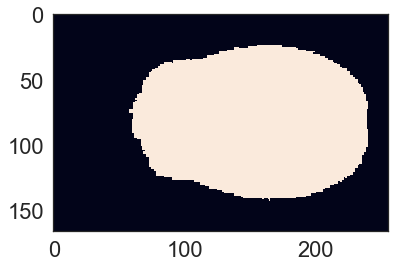

In [16]:
plt.imshow(sitk.GetArrayFromImage(flipped_mask)[:, :, 100])

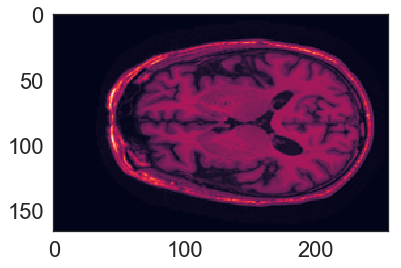

In [17]:
plt.imshow(sitk.GetArrayFromImage(MRI_Real)[:, :, 100])

In [18]:
flipped_mask.SetOrigin(MRI_Real.GetOrigin())

In [19]:
masked = sitk.MaskImageFilter()

In [20]:
flipped_mask = sitk.Cast(flipped_mask, sitk.sitkInt8)

In [21]:
mask = masked.Execute(MRI_Real, flipped_mask)

In [22]:
sitk.WriteImage(mask, 'D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107_brain.nii')

In [23]:
with open('Direzioni_img.txt') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    for roots, dirs, files in os.walk('D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI'):
        print("---------------------")
        
        # QUando len(dirs) == 0 sono nell'ultima cartella contenente i file .nii. Per ogni paziente esiste una risonanza e una maschera        
        if len(dirs)==0:
            try:
        
                if 'Mask' in files[0]:
                    mask = sitk.ReadImage(roots + '/' + files[0])

                    print()
                    print(roots)
                    print("Mask Directions: ")
                    x_mask = mask.GetDirection()[:3]
                    y_mask = mask.GetDirection()[3:6]
                    z_mask = mask.GetDirection()[6:]
                    
                    mask_dirs = np.round([x_mask, y_mask, z_mask])
                    mask_dirs_abs = np.round([np.absolute(x_mask), np.absolute(y_mask), np.absolute(z_mask)])
                    
                    print(mask_dirs_abs)
                    
                else:
                    MRI = sitk.ReadImage(roots + '/' + files[0])
                    
                    print(roots)
                    print("Mri Directions: ")
                    x_mask = MRI.GetDirection()[:3]
                    y_mask = MRI.GetDirection()[3:6]
                    z_mask = MRI.GetDirection()[6:]
                    
                    img_dirs = np.round([x_mask, y_mask, z_mask])
                    img_dirs_abs = np.round([np.absolute(x_mask), np.absolute(y_mask), np.absolute(z_mask)])
                    
                    print(img_dirs_abs)
                    
                    # creo un vettore per effettuare lo scambio degli assi. Mi baso sui valori assoluti. Poi flippo
                    transpose = []
                    for i, img_dir in enumerate(img_dirs_abs):
                        for j, mask_dir in enumerate(mask_dirs_abs):
                            if (mask_dir == img_dir).all():
                                transpose.append(j)
                    print(transpose)
                    
                    # Scambio gli assi
                    mask_brain = sitk.PermuteAxes(mask, transpose)
                    new_mask_dir_x = mask_brain.GetDirection()[:3]
                    new_mask_dir_y = mask_brain.GetDirection()[3:6]
                    new_mask_dir_z = mask_brain.GetDirection()[6:]
                    
                    new_mask_dir = np.round([new_mask_dir_x, new_mask_dir_y, new_mask_dir_z])
                    print(new_mask_dir)
                    print()
                    print(img_dirs)
                    flip_axes = []
                    for i in range(3):
                        if (img_dirs[i] == new_mask_dir[i]).all():
                            flip_axes.append(False)
                        else:
                            flip_axes.append(True)
                        print(flip_axes)
                        
                    flip = sitk.FlipImageFilter()
                    flip.SetFlipAxes(flip_axes)
                    flipped_mask = flip.Execute(mask_brain)
                    flipped_mask.SetOrigin(MRI.GetOrigin())
                    flipped_mask.SetSpacing(MRI.GetSpacing())
                    flipped_mask.SetDirection(np.round(flipped_mask.GetDirection()))
                    MRI.SetDirection(np.round(MRI.GetDirection()))
                    
                    masked = sitk.MaskImageFilter()
                    flipped_mask = sitk.Cast(flipped_mask, sitk.sitkInt8)
                    mask = masked.Execute(MRI, flipped_mask)
                    
                    sitk.WriteImage(mask, roots + '/Brain_' + files[0])
                    
                    
            except Exception as e:
                print(e)

---------------------
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\002_S_0295\MPR__GradWarp__B1_Correction__Mask\2006-04-18_08_20_30.0\S13408
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\002_S_0295\MPR__GradWarp__B1_Correction__N3\2006-04-18_08_20_30.0\S13408
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\002_S_0413\MPR__GradWarp__B1_Correction__Mask\2006-05-02_12_31_52.0\S13893
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\002_S_1261\MPR__GradWarp__B1_Correction__N3\2007-02-15_11_02_42.0\S26574
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\002_S_1268\MPR__GradWarp__B1_Correction__Mask\2007-02-14_07_55_55.0\S26498
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\002_S_1268\MPR__GradWarp__B1_Correction__N3\2007-02-14_07_55_55.0\S26498
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
------

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\005_S_0222\MPR__GradWarp__B1_Correction__Mask\2006-02-21_09_55_57.0\S11754
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\005_S_0222\MPR__GradWarp__B1_Correction__N3\2006-02-21_09_55_57.0\S11754
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\005_S_0223\MPR__GradWarp__B1_Correction__Mask\2006-02-28_09_31_12.0\S11981
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\005_S_0223\MPR__GradW

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\006_S_0322\MPR__GradWarp__B1_Correction__N3\2006-06-20_09_32_29.0\S15659
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\006_S_0484\MPR__GradWarp__B1_Correction__Mask\2006-09-13_13_04_49.0\S18837
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\006_S_0484\MPR__GradWarp__B1_Correction__N3\2006-09-13_13_04_49.0\S18837
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
------

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\007_S_0128\MPR__GradWarp__B1_Correction__Mask\2006-01-16_11_50_23.0\S10936
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\007_S_0128\MPR__GradWarp__B1_Correction__N3\2006-01-16_11_50_23.0\S10936
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\007_S_0249\MPR__GradWarp__B1_Correction__Mask\2006-03-02_09_55_02.0\S11911
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\007_S_0249\MPR__GradW

---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\009_S_0842\MPR__GradWarp__N3\2006-09-07_09_36_49.0\S18870
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\009_S_0862\MPR__GradWarp__Mask\2006-09-19_12_53_39.0\S19358
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\009_S_0862\MPR__GradWarp__N3\2006-09-19_12_53_39.0\S19358
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
-------

---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\010_S_0829\MPR____N3\2007-02-08_14_25_09.0\S26117
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1. -0.]
 [-1. -0. -0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\010_S_0904\MPR____Mask\2006-12-07_14_29_23.0\S23759
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\010_S_0904\MPR____N3\2006-12-07_14_29_23.0\S23759
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[ 0. -0.  1.]
 [-0.  1.  0.]
 [-1. -0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\011_S_0241\MPR__GradWarp__B1_Correction__Mask\2006-03-10_08_18_56.0\S12087
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\011_S_0241\MPR__GradWarp__B1_Correction__N3\2006-03-10_08_18_56.0\S12087
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[ 0. -0.  1.]
 [-0.  1.  0.]
 [-1. -0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\011_S_0326\MPR__GradWarp__B1_Correction__Mask\2006-03-20_13_46_31.0\S12342
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\011_S_0326\MPR__GradW

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\012_S_0932\MPR____Mask\2006-09-20_12_49_02.0\S19374
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\012_S_0932\MPR____N3\2006-09-20_12_49_02.0\S19374
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\012_S_1009\MPR____Mask\2006-11-01_07_17_56.0\S21609
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\012_S_1009\MPR____N3\2006-11-01_07_17_56.0\S21609
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\013_S_0699\MPR__GradWarp__B1_Correction__Mask\2006-08-28_15_00_26.0\S18365
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\013_S_0699\MPR__GradWarp__B1_Correction__N3\2006-08-28_15_00_26.0\S18365
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\013_S_0860\MPR__GradWarp__B1_Correction__Mask\2006-09-21_14_14_36.0\S19237
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\013_S_0860\MPR__GradW

---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\014_S_0357\MPR__GradWarp__B1_Correction__N3\2006-04-04_13_13_51.0\S12824
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\014_S_0519\MPR__GradWarp__B1_Correction__Mask\2006-05-12_12_46_41.0\S14488
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\014_S_0519\MPR__GradWarp__B1_Correction__N3\2006-05-12_12_46_41.0\S14488
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
------

[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\016_S_0769\MPR__GradWarp__B1_Correction__Mask\2006-08-02_14_17_50.0\S17720
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\016_S_0769\MPR__GradWarp__B1_Correction__N3\2006-08-02_14_17_50.0\S17720
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\016_S_0991\MPR__GradWarp__B1_Correction__Mask\2006-11-01_14_40_40.0\S21736
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\018_S_0087\MPR____N3\2005-12-22_12_58_37.0\S10687
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\018_S_0103\MPR____Mask\2006-01-05_13_43_42.0\S10790
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\018_S_0103\MPR____N3\2006-01-05_13_43_42.0\S10790
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\018_S_0142\MPR___

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\020_S_0883\MPR__GradWarp__B1_Correction__Mask\2006-09-15_12_55_11.0\S19459
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\020_S_0883\MPR__GradWarp__B1_Correction__N3\2006-09-15_12_55_11.0\S19459
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\020_S_0899\MPR__GradWarp__B1_Correction__Mask\2006-09-25_19_44_35.0\S19329
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\020_S_0899\MPR__GradW

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\021_S_0642\MPR__GradWarp__Mask\2006-06-28_13_51_36.0\S15935
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\021_S_0642\MPR__GradWarp__N3\2006-06-28_13_51_36.0\S15935
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\021_S_0647\MPR__GradWarp__Mask\2006-06-29_12_55_43.0\S15957
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\021_S_0647\MPR__GradWarp__N3\2006-06-29_12_55_43.0\S15957
Mri Dire

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\022_S_0219\MPR__GradWarp__B1_Correction__N3\2006-03-17_13_47_47.0\S12375
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\022_S_0543\MPR__GradWarp__B1_Correction__Mask\2006-05-22_09_27_24.0\S14849
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\022_S_0543\MPR__GradWarp__B1_Correction__N3\2006-05-22_09_27_24.0\S14849
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
------

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\023_S_0058\MPR__GradWarp__B1_Correction__Mask\2005-11-30_09_36_10.0\S10335
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\023_S_0058\MPR__GradWarp__B1_Correction__N3\2005-11-30_09_36_10.0\S10335
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\023_S_0061\MPR__GradWarp__B1_Correction__Mask\2005-11-29_08_54_05.0\S10311
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\023_S_0061\MPR__GradW

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\023_S_0388\MPR__GradWarp__B1_Correction__N3\2006-04-10_09_53_55.0\S13076
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 1.  0. -0.]
 [ 0.  1.  0.]
 [ 0.  0. -1.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, False]
[True, False, True]
Exception thrown in SimpleITK MaskImageFilter_Execute: C:\b\3.7-64\SimpleITK-build\Code\BasicFilters\src\sitkMaskImageFilter.cxx:118:
sitk::ERROR: Both images for MaskImageFilter don't match type or dimension!
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\023_S_0604\MPR__GradWarp__B1_Correction__Mask\2006-06-02_12_47_40.0\S15182
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\023_S_0604\MPR__GradWarp__B1_Correction__N3\2006-06-02_12_47_40.0\S15182
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\023_S_1247\MPR__GradWarp__B1_Correction__N3\2007-01-31_11_57_06.0\S25741
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\023_S_1262\MPR__GradWarp__B1_Correction__Mask\2007-02-09_08_36_16.0\S26314
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\023_S_1262\MPR__GradWarp__B1_Correction__N3\2007-02-09_08_36_16.0\S26314
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
------

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\027_S_0307\MPR__GradWarp__B1_Correction__Mask\2006-04-06_14_44_38.0\S13072
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\027_S_0307\MPR__GradWarp__B1_Correction__N3\2006-04-06_14_44_38.0\S13072
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\027_S_0403\MPR__GradWarp__B1_Correction__Mask\2006-04-20_15_56_17.0\S13718
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\027_S_0403\MPR__GradW


D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\027_S_1082\MPR__GradWarp__B1_Correction__Mask\2006-11-27_14_55_00.0\S22937
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\027_S_1082\MPR__GradWarp__B1_Correction__N3\2006-11-27_14_55_00.0\S22937
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\027_S_1213\MPR__GradWarp__B1_Correction__Mask\2007-01-19_14_43_25.0\S25493
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\027_S_1213\MPR__GradWarp__B1_Correction__N3\2007-01-19_14_43_25.0\S25493
Mri Directions: 
[[0. 0. 1.]
 [0. 1.

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\029_S_0878\MPR__GradWarp__B1_Correction__N3\2006-09-15_14_28_17.0\S18986
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\029_S_0914\MPR__GradWarp__B1_Correction__Mask\2006-12-18_13_27_51.0\S24287
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\029_S_0914\MPR__GradWarp__B1_Correction__N3\2006-12-18_13_27_51.0\S24287
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
------

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\031_S_0568\MPR__GradWarp__Mask\2006-05-22_12_46_58.0\S14833
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\031_S_0568\MPR__GradWarp__N3\2006-05-22_12_46_58.0\S14833
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\031_S_0618\MPR__GradWarp__Mask\2006-06-06_11_13_05.0\S15270
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\031_S_0618\MPR__GradWarp__N3\2006-06-06_11_13_05.0\S15270
Mri Dire

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\032_S_0677\MPR__GradWarp__B1_Correction__Mask\2006-10-09_14_17_34.0\S19889
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\032_S_0677\MPR__GradWarp__B1_Correction__N3\2006-10-09_14_17_34.0\S19889
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\032_S_0718\MPR____Mask\2006-07-12_11_27_10.0\S16859
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\032_S_0718\MPR____N3\2006-07-12_11_27_10.0\S

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\033_S_0725\MPR__GradWarp__B1_Correction__N3\2006-07-20_13_47_29.0\S17092
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\033_S_0733\MPR__GradWarp__B1_Correction__Mask\2006-07-18_13_34_59.0\S16932
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\033_S_0733\MPR__GradWarp__B1_Correction__N3\2006-07-18_13_34_59.0\S16932
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
------

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\033_S_1098\MPR__GradWarp__B1_Correction__Mask\2006-11-21_13_30_13.0\S22791
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\033_S_1098\MPR__GradWarp__B1_Correction__N3\2006-11-21_13_30_13.0\S22791
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\033_S_1116\MPR__GradWarp__B1_Correction__Mask\2006-11-21_14_12_48.0\S22799
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\033_S_1116\MPR__GradW


D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\035_S_0292\MPR__GradWarp__B1_Correction__Mask\2006-03-22_12_45_11.0\S12408
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\035_S_0292\MPR__GradWarp__B1_Correction__N3\2006-03-22_12_45_11.0\S12408
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\035_S_0341\MPR__GradWarp__B1_Correction__Mask\2006-04-06_10_28_57.0\S12952
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\035_S_0341\MPR__GradWarp__B1_Correction__N3\2006-04-06_10_28_57.0\S12952
Mri Directions: 
[[0. 0. 1.]
 [0. 1.

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\036_S_0869\MPR__GradWarp__B1_Correction__N3\2006-10-30_10_29_41.0\S21422
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\036_S_0945\MPR__GradWarp__B1_Correction__Mask\2006-10-25_09_04_33.0\S20971
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\036_S_0945\MPR__GradWarp__B1_Correction__N3\2006-10-25_09_04_33.0\S20971
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
------

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\037_S_0501\MPR__GradWarp__B1_Correction__Mask\2006-06-23_10_53_47.0\S15804
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\037_S_0501\MPR__GradWarp__B1_Correction__N3\2006-06-23_10_53_47.0\S15804
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\037_S_0539\MPR__GradWarp__Mask\2006-06-15_10_27_47.0\S15542
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\037_S_0539\MPR__GradWarp__N3\2006-06

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\041_S_0407\MPR__GradWarp__B1_Correction__N3\2006-04-28_12_18_19.0\S13802
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\041_S_0446\MPR__GradWarp__B1_Correction__Mask\2006-05-02_13_33_51.0\S13909
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\041_S_0446\MPR__GradWarp__B1_Correction__N3\2006-05-02_13_33_51.0\S13909
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
------

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\041_S_1418\MPR__GradWarp__B1_Correction__Mask\2007-07-27_12_34_11.0\S36523
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\041_S_1418\MPR__GradWarp__B1_Correction__N3\2007-07-27_12_34_11.0\S36523
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\041_S_1420\MPR__GradWarp__B1_Correction__Mask\2007-09-24_10_54_54.0\S39952
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\041_S_1420\MPR__GradW


D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\052_S_0951\MPR__GradWarp__B1_Correction__Mask\2006-10-19_10_20_23.0\S20352
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\052_S_0951\MPR__GradWarp__B1_Correction__N3\2006-10-19_10_20_23.0\S20352
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
list index out of range
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\052_S_0989\MPR__GradWarp__B1_Correction__Mask\2006-11-14_09_37_11.0\S22476
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\052_S_0989\MPR__GradWarp__B1_Correction__N3\2006-11-14_09_37_11

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\057_S_0464\MPR__GradWarp__B1_Correction__N3\2006-05-17_14_08_28.0\S14736
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\057_S_0474\MPR__GradWarp__B1_Correction__Mask\2006-05-03_14_34_03.0\S13991
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\057_S_0474\MPR__GradWarp__B1_Correction__N3\2006-05-03_14_34_03.0\S13991
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
------

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\057_S_1373\MPR__GradWarp__B1_Correction__Mask\2007-03-21_17_24_05.0\S28697
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\057_S_1373\MPR__GradWarp__B1_Correction__N3\2007-03-21_17_24_05.0\S28697
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\057_S_1379\MPR__GradWarp__B1_Correction__Mask\2007-03-21_16_36_57.0\S28761
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\057_S_1379\MPR__GradW


D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\067_S_0019\MPR__GradWarp__B1_Correction__Mask\2005-10-12_10_40_27.0\S9539
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\067_S_0019\MPR__GradWarp__B1_Correction__N3\2005-10-12_10_40_27.0\S9539
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\067_S_0020\MPR__GradWarp__B1_Correction__Mask\2005-10-12_11_40_36.0\S9675
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\067_S_0020\MPR__GradWarp__B1_Correction__N3\2005-10-12_11_40_36.0\S9675
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\067_S_0177\MPR__GradWarp__B1_Correction__N3\2006-03-10_14_39_05.0\S12187
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\067_S_0243\MPR__GradWarp__B1_Correction__Mask\2006-03-09_09_26_07.0\S12029
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\067_S_0243\MPR__GradWarp__B1_Correction__N3\2006-03-09_09_26_07.0\S12029
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
------

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\068_S_0401\MPR____Mask\2006-04-25_09_52_36.0\S13727
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\068_S_0401\MPR____N3\2006-04-25_09_52_36.0\S13727
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\068_S_0442\MPR____Mask\2006-05-09_10_53_43.0\S14129
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\068_S_0442\MPR____N3\2006-05-09_10_53_43.0\S14129
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]


D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\073_S_0312\MPR__GradWarp__B1_Correction__Mask\2006-05-31_13_21_45.0\S15079
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\073_S_0312\MPR__GradWarp__B1_Correction__N3\2006-05-31_13_21_45.0\S15079
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\073_S_0386\MPR__GradWarp__B1_Correction__Mask\2006-04-20_13_30_48.0\S13746
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\073_S_0386\MPR__GradWarp__B1_Correction__N3\2006-04-20_13_30_48.0\S13746
Mri Directions: 
[[0. 0. 1.]
 [0. 1.

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\082_S_0641\MPR__GradWarp__B1_Correction__N3\2006-06-19_13_53_51.0\S15699
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\082_S_0761\MPR__GradWarp__B1_Correction__Mask\2006-08-07_13_03_25.0\S18119
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\082_S_0761\MPR__GradWarp__B1_Correction__N3\2006-08-07_13_03_25.0\S18119
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
------

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\094_S_0921\MPR__GradWarp__B1_Correction__Mask\2006-10-02_13_16_04.0\S19582
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\094_S_0921\MPR__GradWarp__B1_Correction__N3\2006-10-02_13_16_04.0\S19582
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [-0.  1. -0.]
 [-1. -0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\094_S_0964\MPR__GradWarp__B1_Correction__Mask\2006-10-10_11_36_01.0\S19897
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\094_S_0964\MPR__GradW


D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\094_S_1397\MPR__GradWarp__B1_Correction__Mask\2007-04-26_13_42_01.0\S31013
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\094_S_1397\MPR__GradWarp__B1_Correction__N3\2007-04-26_13_42_01.0\S31013
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\094_S_1398\MPR__GradWarp__B1_Correction__Mask\2007-05-03_12_48_21.0\S31771
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\094_S_1398\MPR__GradWarp__B1_Correction__N3\2007-05-03_12_48_21.0\S31771
Mri Directions: 
[[0. 0. 1.]
 [0. 1.

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\099_S_0040\MPR__GradWarp__B1_Correction__N3\2005-10-24_11_40_37.0\S8921
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[ 0.  0.  1.]
 [-0.  1. -0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\099_S_0051\MPR__GradWarp__B1_Correction__Mask\2005-11-15_18_49_32.0\S10325
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\099_S_0051\MPR__GradWarp__B1_Correction__N3\2005-11-15_18_49_32.0\S10325
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[ 0. -0.  1.]
 [ 0.  1.  0.]
 [-1. -0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
-------

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\100_S_0047\MPR____Mask\2005-11-17_10_22_20.0\S10216
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\100_S_0047\MPR____N3\2005-11-17_10_22_20.0\S10216
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[ 0.  0.  1.]
 [-0.  1. -0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\100_S_0069\MPR____Mask\2005-12-13_10_15_08.0\S10563
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\100_S_0069\MPR____N3\2005-12-13_10_15_08.0\S10563
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]


D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\109_S_0840\MPR__GradWarp__B1_Correction__Mask\2006-09-07_13_47_43.0\S18807
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\109_S_0840\MPR__GradWarp__B1_Correction__N3\2006-09-07_13_47_43.0\S18807
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\109_S_0876\MPR__GradWarp__B1_Correction__Mask\2006-09-19_13_32_29.0\S19132
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\109_S_0876\MPR__GradWarp__B1_Correction__N3\2006-09-19_13_32_29.0\S19132
Mri Directions: 
[[0. 0. 1.]
 [0. 1.

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\114_S_0228\MPR__GradWarp__B1_Correction__N3\2006-02-16_16_40_54.0\S11697
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\114_S_0374\MPR__GradWarp__B1_Correction__Mask\2006-04-10_11_29_43.0\S13031
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\114_S_0374\MPR__GradWarp__B1_Correction__N3\2006-04-10_11_29_43.0\S13031
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
------

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\116_S_0382\MPR__GradWarp__B1_Correction__Mask\2006-06-13_10_21_56.0\S15735
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\116_S_0382\MPR__GradWarp__B1_Correction__N3\2006-06-13_10_21_56.0\S15735
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0. -0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\116_S_0392\MPR__GradWarp__B1_Correction__Mask\2006-06-26_10_52_42.0\S16453
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\116_S_0392\MPR__GradW

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\116_S_1271\MPR__GradWarp__N3\2007-02-21_09_12_06.0\S26938
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\116_S_1315\MPR__GradWarp__Mask\2007-03-08_09_24_54.0\S27811
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\116_S_1315\MPR__GradWarp__N3\2007-03-08_09_24_54.0\S27811
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\123_S_0390\MPR____Mask\2006-04-11_06_40_32.0\S13099
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\123_S_0390\MPR____N3\2006-04-11_06_40_32.0\S13099
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[ 0.  0.  1.]
 [-0.  1. -0.]
 [-1. -0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\123_S_1300\MPR____Mask\2007-03-08_09_55_20.0\S27689
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\123_S_1300\MPR____N3\2007-03-08_09_55_20.0\S27689
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\126_S_1187\MPR__GradWarp__B1_Correction__N3\2007-01-17_11_13_08.0\S25143
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\126_S_1221\MPR__GradWarp__B1_Correction__Mask\2007-01-23_10_03_45.0\S25455
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\126_S_1221\MPR__GradWarp__B1_Correction__N3\2007-01-23_10_03_45.0\S25455
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
------

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\127_S_0925\MPR__GradWarp__B1_Correction__Mask\2006-10-30_14_00_55.0\S21560
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\127_S_0925\MPR__GradWarp__B1_Correction__N3\2006-10-30_14_00_55.0\S21560
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\127_S_1032\MPR__GradWarp__B1_Correction__Mask\2006-11-08_14_01_32.0\S22258
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\127_S_1032\MPR__GradW

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\128_S_0216\MPR__GradWarp__N3\2006-02-14_07_16_12.0\S11632
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\128_S_0225\MPR__GradWarp__Mask\2006-02-15_08_22_50.0\S11679
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\128_S_0225\MPR__GradWarp__N3\2006-02-15_08_22_50.0\S11679
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\128_S_0545\MPR__GradWarp__N3\2006-05-24_07_02_11.0\S14959
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\128_S_0608\MPR__GradWarp__Mask\2006-06-01_17_03_06.0\S15211
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\128_S_0608\MPR__GradWarp__N3\2006-06-01_17_03_06.0\S15211
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\128_S_1406\MPR__GradWarp__B1_Correction__Mask\2007-05-18_17_47_24.0\S32551
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\128_S_1406\MPR__GradWarp__B1_Correction__N3\2007-05-18_17_47_24.0\S32551
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\128_S_1407\MPR__GradWarp__B1_Correction__Mask\2007-06-06_10_41_52.0\S33808
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\128_S_1407\MPR__GradW

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\130_S_0449\MPR__GradWarp__B1_Correction__N3\2006-05-31_11_27_54.0\S15123
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\130_S_0460\MPR__GradWarp__B1_Correction__Mask\2006-05-18_07_47_27.0\S14725
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\130_S_0460\MPR__GradWarp__B1_Correction__N3\2006-05-18_07_47_27.0\S14725
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
------

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\131_S_0409\MPR__GradWarp__B1_Correction__Mask\2006-04-25_10_34_19.0\S13775
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\131_S_0409\MPR__GradWarp__B1_Correction__N3\2006-04-25_10_34_19.0\S13775
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\131_S_0436\MPR__GradWarp__B1_Correction__Mask\2006-05-17_14_53_12.0\S14710
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\131_S_0436\MPR__GradW

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\133_S_0525\MPR__GradWarp__B1_Correction__N3\2006-05-30_08_58_53.0\S14991
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\133_S_0629\MPR__GradWarp__B1_Correction__Mask\2006-06-23_10_23_05.0\S15914
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\133_S_0629\MPR__GradWarp__B1_Correction__N3\2006-06-23_10_23_05.0\S15914
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
------

---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\136_S_0186\MPR__GradWarp__B1_Correction__Mask\2006-02-24_07_56_11.0\S11774
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\136_S_0186\MPR__GradWarp__B1_Correction__N3\2006-02-24_07_56_11.0\S11774
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\136_S_0194\MPR__GradWarp__B1_Correction__Mask\2006-04-10_17_33_08.0\S13177
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\136_S_0194\MPR__GradW

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\137_S_0158\MPR__GradWarp__N3\2006-02-14_10_55_37.0\S11648
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\137_S_0283\MPR__GradWarp__Mask\2006-03-15_11_02_28.0\S12218
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\137_S_0283\MPR__GradWarp__N3\2006-03-15_11_02_28.0\S12218
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\137_S_0800\MPR__GradWarp__N3\2006-08-14_14_04_22.0\S17822
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\137_S_0825\MPR__GradWarp__Mask\2006-09-28_11_47_38.0\S19451
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\137_S_0825\MPR__GradWarp__N3\2006-09-28_11_47_38.0\S19451
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T


D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\141_S_0790\MPR__GradWarp__B1_Correction__Mask\2006-09-10_15_48_15.0\S18766
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\141_S_0790\MPR__GradWarp__B1_Correction__N3\2006-09-10_15_48_15.0\S18766
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\141_S_0810\MPR__GradWarp__B1_Correction__Mask\2006-10-17_16_43_40.0\S20273
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\141_S_0810\MPR__GradWarp__B1_Correction__N3\2006-10-17_16_43_40.0\S20273
Mri Directions: 
[[0. 0. 1.]
 [0. 1.

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\141_S_1152\MPR__GradWarp__B1_Correction__N3\2006-12-26_15_23_11.0\S24487
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
---------------------

D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\141_S_1231\MPR__GradWarp__B1_Correction__Mask\2007-02-18_15_21_05.0\S26876
Mask Directions: 
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
---------------------
---------------------
---------------------
D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI\141_S_1231\MPR__GradWarp__B1_Correction__N3\2007-02-18_15_21_05.0\S26876
Mri Directions: 
[[0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]]
[2, 1, 0]
[[ 0.  0. -1.]
 [ 0. -1.  0.]
 [ 1.  0.  0.]]

[[-0.  0.  1.]
 [ 0.  1.  0.]
 [-1.  0.  0.]]
[True]
[True, True]
[True, True, True]
---------------------
---------------------
---------------------
------

In [32]:
main_folder = 'D:\ADNI\Dati\ADNI_T1\ADNI1_T1\ADNI'
folders = os.listdir(main_folder)

trasformation = 'affine'
for folder in folders:
    for roots, dirs, files in os.walk(main_folder + '/' + folder):
        print()
        for file in files:
            if "Brain" in str(file):
                print(roots + '/' + str(file))
                moving_image = roots + '/' + str(file)
                print(moving_image)
                if 'txt' not in file:
                    my_txt = os.path.join(main_folder + '/' + folder, file +'.txt')
                    file = open(my_txt, "w")
                    file.write("[GLOBAL] \n\nfixed = " + fixed_image +"\nmoving = " + moving_image + "\nimg_out = D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI_Registrate/" + 'registrata_' + str(files[0])+
                    "\n\n[STAGE] \n\nxform=" + trasformation +  "\noptim=versor \nmax_its=30 \nres=4 4 2")
                    file.close()

                    command = ['plastimatch', 'register' ,  my_txt]
                    registration = subprocess.Popen(command, stdout=subprocess.PIPE)
                    output, errors = registration.communicate()
                    print ([registration.returncode, errors, output])





D:\ADNI\Dati\ADNI_T1\ADNI1_T1\ADNI/002_S_0295/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii.txt
D:\ADNI\Dati\ADNI_T1\ADNI1_T1\ADNI/002_S_0295/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii.txt






D:\ADNI\Dati\ADNI_T1\ADNI1_T1\ADNI/002_S_0295\MPR__GradWarp__B1_Correction__N3\2006-04-18_08_20_30.0\S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii
D:\ADNI\Dati\ADNI_T1\ADNI1_T1\ADNI/002_S_0295\MPR__GradWarp__B1_Correction__N3\2006-04-18_08_20_30.0\S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii
[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\AD

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/002_S_0559\\MPR__GradWarp__B1_Correction__N3\\2006-05-23_15_31_00.0\\S14875/Brain_ADNI_002_S_0559_MR_MPR__GradWarp__B1_Correction__N3_Br_20070216234114135_S14875_I40673.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -95.6917 -162.174 116.198\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/002_S_0685\\MPR__GradWarp__B1_Correction__N3\\2006-07-06_10_36_49.0\\S16309/Brain_ADNI_002_S_0685_MR_MPR__GradWarp__B1_Correction__N3_Br_20070216235718337_S16309_I40682.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.765 -154.906 116.961\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/002_S_0729\\MPR__GradWarp__B1_Correction__N3\\2006-07-17_13_27_14.0\\S16874/Brain_ADNI_002_S_0729_MR_MPR__GradWarp__B1_Correction__N3_Br_20070217001754498_S16874_I40707.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -93.1551 -136.515 122.034\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/002_S_0782\\MPR__GradWarp__B1_Correction__N3\\2006-08-14_09_39_47.0\\S17835/Brain_ADNI_002_S_0782_MR_MPR__GradWarp__B1_Correction__N3_Br_20070217003330133_S17835_I40716.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.8627 -160.623 114.356\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/002_S_0816\\MPR__GradWarp__B1_Correction__N3\\2006-08-30_12_22_53.0\\S18402/Brain_ADNI_002_S_0816_MR_MPR__GradWarp__B1_Correction__N3_Br_20070217005641090_S18402_I40730.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9326 -160.592 98.2562\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/002_S_0938\\MPR__GradWarp__B1_Correction__N3\\2006-10-05_15_54_26.0\\S19852/Brain_ADNI_002_S_0938_MR_MPR__GradWarp__B1_Correction__N3_Br_20070219175220082_S19852_I40979.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -154.906 115.693\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/002_S_0954\\MPR__GradWarp__B1_Correction__N3\\2006-10-10_15_05_03.0\\S19978/Brain_ADNI_002_S_0954_MR_MPR__GradWarp__B1_Correction__N3_Br_20070217011146794_S19978_I40739.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -105.204 -156.931 99.205\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/002_S_0955\\MPR__GradWarp__B1_Correction__N3\\2006-10-11_10_32_38.0\\S20004/Brain_ADNI_002_S_0955_MR_MPR__GradWarp__B1_Correction__N3_Br_20070217013238534_S20004_I40753.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.96 -152.359 97.3123\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/002_S_1018\\MPR__GradWarp__B1_Correction__N3\\2006-11-29_10_00_05.0\\S23128/Brain_ADNI_002_S_1018_MR_MPR__GradWarp__B1_Correction__N3_Br_20070217030252830_S23128_I40816.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -147.296 150.571\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/002_S_1070\\MPR__GradWarp__B1_Correction__N3\\2006-11-28_10_01_04.0\\S23120/Brain_ADNI_002_S_1070_MR_MPR__GradWarp__B1_Correction__N3_Br_20070217032456764_S23120_I40830.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -92.5204 -147.93 151.839\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/002_S_1155\\MPR__GradWarp__B1_Correction__N3\\2006-12-14_07_34_52.0\\S24144/Brain_ADNI_002_S_1155_MR_MPR__GradWarp__B1_Correction__N3_Br_20070217034739048_S24144_I40844.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -93.1551 -157.442 111.254\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/002_S_1261\\MPR__GradWarp__B1_Correction__N3\\2007-02-15_11_02_42.0\\S26574/Brain_ADNI_002_S_1261_MR_MPR__GradWarp__B1_Correction__N3_Br_20070727130236831_S26574_I62376.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -95.6943 -142.222 153.743\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters =

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/002_S_1268\\MPR__GradWarp__B1_Correction__N3\\2007-02-14_07_55_55.0\\S26498/Brain_ADNI_002_S_1268_MR_MPR__GradWarp__B1_Correction__N3_Br_20070802164944784_S26498_I64036.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9624 -152.368 97.3056\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/002_S_1280\\MPR__GradWarp__B1_Correction__N3\\2007-02-13_07_59_35.0\\S26453/Brain_ADNI_002_S_1280_MR_MPR__GradWarp__B1_Correction__N3_Br_20070713123654581_S26453_I60055.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5966 -158.075 96.0373\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/003_S_0907\\MPR__GradWarp__B1_Correction__N3\\2006-09-11_11_38_13.0\\S19728/Brain_ADNI_003_S_0907_MR_MPR__GradWarp__B1_Correction__N3_Br_20070501171718570_S19728_I52780.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -100.983 -128.294 120.6\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/003_S_0908\\MPR__GradWarp__B1_Correction__N3\\2006-09-12_16_07_53.0\\S32516/Brain_ADNI_003_S_0908_MR_MPR__GradWarp__B1_Correction__N3_Br_20070727174928819_S32516_I62588.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.5928 -134.396 105.007\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/003_S_0931\\MPR__GradWarp__B1_Correction__N3\\2006-10-11_11_49_21.0\\S20050/Brain_ADNI_003_S_0931_MR_MPR__GradWarp__B1_Correction__N3_Br_20070503165113102_S20050_I53385.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -131.006 115.176\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/003_S_0981\\MPR__GradWarp__B1_Correction__N3\\2006-10-19_10_43_56.0\\S20752/Brain_ADNI_003_S_0981_MR_MPR__GradWarp__B1_Correction__N3_Br_20070501171236152_S20752_I52771.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.4911 -147.956 118.566\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/003_S_1021\\MPR__GradWarp__B1_Correction__N3\\2006-11-01_11_29_25.0\\S21770/Brain_ADNI_003_S_1021_MR_MPR__GradWarp__B1_Correction__N3_Br_20070918111104579_S21770_I73501.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -98.9487 -149.3 94.292\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/003_S_1057\\MPR__GradWarp__B1_Correction__N3\\2006-12-04_10_43_48.0\\S23345/Brain_ADNI_003_S_1057_MR_MPR__GradWarp__B1_Correction__N3_Br_20070501173939235_S23345_I52820.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -99.6267 -129.65 120.6\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/003_S_1059\\MPR__GradWarp__B1_Correction__N3\\2006-11-09_17_28_06.0\\S22301/Brain_ADNI_003_S_1059_MR_MPR__GradWarp__B1_Correction__N3_Br_20070501173419666_S22301_I52811.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -89.4572 -132.362 115.854\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/003_S_1074\\MPR__GradWarp__B1_Correction__N3\\2006-12-04_12_14_38.0\\S23536/Brain_ADNI_003_S_1074_MR_MPR__GradWarp__B1_Correction__N3_Br_20070503165538722_S23536_I53394.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.2369 -124.227 90.7695\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/003_S_1122\\MPR__GradWarp__B1_Correction__N3\\2006-12-06_11_37_39.0\\S23542/Brain_ADNI_003_S_1122_MR_MPR__GradWarp__B1_Correction__N3_Br_20070501172723978_S23542_I52798.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -126.261 96.8712\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/003_S_1257\\MPR__GradWarp__B1_Correction__N3\\2007-03-01_10_20_36.0\\S27340/Brain_ADNI_003_S_1257_MR_MPR__GradWarp__B1_Correction__N3_Br_20070501172216483_S27340_I52789.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -98.2708 -135.074 120.6\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/005_S_0221\\MPR__GradWarp__B1_Correction__N3\\2006-02-22_09_57_53.0\\S11958/Brain_ADNI_005_S_0221_MR_MPR__GradWarp__B1_Correction__N3_Br_20070910164635984_S11958_I72127.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -92.3398 -145.967 130.278\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/005_S_0222\\MPR__GradWarp__B1_Correction__N3\\2006-02-21_09_55_57.0\\S11754/Brain_ADNI_005_S_0222_MR_MPR__GradWarp__B1_Correction__N3_Br_20070517131923519_S11754_I54685.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -92.521 -142.586 115.602\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/005_S_0223\\MPR__GradWarp__B1_Correction__N3\\2006-02-28_09_31_12.0\\S11981/Brain_ADNI_005_S_0223_MR_MPR__GradWarp__B1_Correction__N3_Br_20061212164202354_S11981_I32856.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -95.6917 -134.613 120.766\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/005_S_0324\\MPR__GradWarp__B1_Correction__N3\\2006-03-30_09_03_34.0\\S12600/Brain_ADNI_005_S_0324_MR_MPR__GradWarp__B1_Correction__N3_Br_20061212164851618_S12600_I32871.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.3258 -140.954 106.656\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/005_S_0448\\MPR__GradWarp__B1_Correction__N3\\2006-05-04_08_55_12.0\\S14032/Brain_ADNI_005_S_0448_MR_MPR__GradWarp__B1_Correction__N3_Br_20061212165720114_S14032_I32876.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -89.9844 -140.32 114.107\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/005_S_0546\\MPR__GradWarp__B1_Correction__N3\\2006-06-15_09_39_35.0\\S15567/Brain_ADNI_005_S_0546_MR_MPR__GradWarp__B1_Correction__N3_Br_20061212095514026_S15567_I32649.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -101.399 -143.763 94.766\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/005_S_0553\\MPR__GradWarp__B1_Correction__N3\\2006-06-14_08_28_53.0\\S15527/Brain_ADNI_005_S_0553_MR_MPR__GradWarp__B1_Correction__N3_Br_20061212094808977_S15527_I32645.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -95.0575 -146.028 107.449\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/005_S_0572\\MPR__GradWarp__B1_Correction__N3\\2006-06-20_09_37_39.0\\S15709/Brain_ADNI_005_S_0572_MR_MPR__GradWarp__B1_Correction__N3_Br_20061212100444554_S15709_I32654.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.1713 -157.895 85.7068\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/005_S_0602\\MPR__GradWarp__B1_Correction__N3\\2006-06-29_08_58_05.0\\S15966/Brain_ADNI_005_S_0602_MR_MPR__GradWarp__B1_Correction__N3_Br_20061212103336147_S15966_I32673.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -92.996 -146.096 100.383\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/005_S_0610\\MPR__GradWarp__B1_Correction__N3\\2006-06-21_08_37_05.0\\S15727/Brain_ADNI_005_S_0610_MR_MPR__GradWarp__B1_Correction__N3_Br_20061212102425656_S15727_I32668.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.3258 -145.605 111.465\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/005_S_0814\\MPR__GradWarp__B1_Correction__N3\\2006-08-30_09_32_32.0\\S18390/Brain_ADNI_005_S_0814_MR_MPR__GradWarp__B1_Correction__N3_Br_20070923123029847_S18390_I74590.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -102.667 -133.979 119.498\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters =

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/005_S_0929\\MPR__GradWarp__B1_Correction__N3\\2006-10-02_11_02_34.0\\S19669/Brain_ADNI_005_S_0929_MR_MPR__GradWarp__B1_Correction__N3_Br_20070923124844931_S19669_I74608.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.765 -146.028 115.059\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/005_S_1224\\MPR__GradWarp__B1_Correction__N3\\2007-01-23_13_44_33.0\\S25412/Brain_ADNI_005_S_1224_MR_MPR__GradWarp__B1_Correction__N3_Br_20070717175220690_S25412_I60405.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -103.302 -153.637 86.5221\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/005_S_1341\\MPR__GradWarp__B1_Correction__N3\\2007-03-07_12_44_49.0\\S27673/Brain_ADNI_005_S_1341_MR_MPR__GradWarp__B1_Correction__N3_Br_20070717180254882_S27673_I60416.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -99.4958 -143.491 129.01\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/006_S_0322\\MPR__GradWarp__B1_Correction__N3\\2006-06-20_09_32_29.0\\S15659/Brain_ADNI_006_S_0322_MR_MPR__GradWarp__B1_Correction__N3_Br_20070605115357499_S15659_I55917.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -90.618 -140.955 130.278\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/006_S_0484\\MPR__GradWarp__B1_Correction__N3\\2006-09-13_13_04_49.0\\S18837/Brain_ADNI_006_S_0484_MR_MPR__GradWarp__B1_Correction__N3_Br_20070807144856409_S18837_I65565.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.8627 -153.637 128.376\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/006_S_0498\\MPR__GradWarp__B1_Correction__N3\\2006-06-26_12_12_55.0\\S15857/Brain_ADNI_006_S_0498_MR_MPR__GradWarp__B1_Correction__N3_Br_20070812122500513_S15857_I67056.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.13 -139.898 112.099\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/006_S_0521\\MPR__GradWarp__B1_Correction__N3\\2006-06-27_13_20_23.0\\S15877/Brain_ADNI_006_S_0521_MR_MPR__GradWarp__B1_Correction__N3_Br_20080131105223358_S15877_I89050.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -94.423 -130.174 128.376\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/006_S_0547\\MPR__GradWarp__B1_Correction__N3\\2006-06-29_11_59_00.0\\S16033/Brain_ADNI_006_S_0547_MR_MPR__GradWarp__B1_Correction__N3_Br_20070813134018600_S16033_I67314.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -93.7887 -132.077 111.254\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/006_S_0653\\MPR__GradWarp__B1_Correction__N3\\2006-07-05_09_35_58.0\\S16073/Brain_ADNI_006_S_0653_MR_MPR__GradWarp__B1_Correction__N3_Br_20070813135331256_S16073_I67323.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -93.1546 -141.589 119.498\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/006_S_0675\\MPR__GradWarp__B1_Correction__N3\\2006-08-31_10_29_35.0\\S18432/Brain_ADNI_006_S_0675_MR_MPR__GradWarp__B1_Correction__N3_Br_20070813140555142_S18432_I67332.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.594 -153.91 105.637\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/006_S_0681\\MPR__GradWarp__B1_Correction__N3\\2006-08-31_13_42_29.0\\S18451/Brain_ADNI_006_S_0681_MR_MPR__GradWarp__B1_Correction__N3_Br_20080224150206003_S18451_I92304.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -95.6911 -137.573 106.603\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters =

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/006_S_0731\\MPR__GradWarp__B1_Correction__N3\\2006-08-28_10_57_36.0\\S18321/Brain_ADNI_006_S_0731_MR_MPR__GradWarp__B1_Correction__N3_Br_20080220094749654_S18321_I90847.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -162.516 120.766\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/006_S_1130\\MPR__GradWarp__B1_Correction__N3\\2006-11-30_12_55_09.0\\S23456/Brain_ADNI_006_S_1130_MR_MPR__GradWarp__B1_Correction__N3_Br_20070605123453065_S23456_I55956.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -93.1547 -119.397 116.329\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/007_S_0041\\MPR__GradWarp__B1_Correction__N3\\2005-10-21_09_06_32.0\\S9994/Brain_ADNI_007_S_0041_MR_MPR__GradWarp__B1_Correction__N3_Br_20070110204026546_S9994_I35733.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -95.0575 -137.162 92.2294\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/007_S_0068\\MPR__GradWarp__B1_Correction__N3\\2005-11-30_11_28_27.0\\S10355/Brain_ADNI_007_S_0068_MR_MPR__GradWarp__B1_Correction__N3_Br_20070110220432352_S10355_I35785.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.2282 -135.894 110.131\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/007_S_0070\\MPR__GradWarp__B1_Correction__N3\\2006-01-18_14_40_56.0\\S10949/Brain_ADNI_007_S_0070_MR_MPR__GradWarp__B1_Correction__N3_Br_20070118043115494_S10949_I36624.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -93.1551 -160.613 109.351\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/007_S_0101\\MPR__GradWarp__B1_Correction__N3\\2005-12-20_10_20_16.0\\S10679/Brain_ADNI_007_S_0101_MR_MPR__GradWarp__B1_Correction__N3_Br_20070118231444662_S10679_I36725.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.594 -141.589 129.644\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/007_S_0128\\MPR__GradWarp__B1_Correction__N3\\2006-01-16_11_50_23.0\\S10936/Brain_ADNI_007_S_0128_MR_MPR__GradWarp__B1_Correction__N3_Br_20070118045244301_S10936_I36639.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -99.4967 -148.564 120.132\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/007_S_0249\\MPR__GradWarp__B1_Correction__N3\\2006-03-02_09_55_02.0\\S11911/Brain_ADNI_007_S_0249_MR_MPR__GradWarp__B1_Correction__N3_Br_20070118015100311_S11911_I36529.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.2282 -147.296 71.3027\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/007_S_0293\\MPR__GradWarp__B1_Correction__N3\\2006-03-14_10_51_53.0\\S12193/Brain_ADNI_007_S_0293_MR_MPR__GradWarp__B1_Correction__N3_Br_20070118022409367_S12193_I36548.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.8627 -161.274 127.741\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/007_S_0316\\MPR__GradWarp__B1_Correction__N3\\2006-03-29_15_03_20.0\\S12582/Brain_ADNI_007_S_0316_MR_MPR__GradWarp__B1_Correction__N3_Br_20070118025904525_S12582_I36568.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -99.4967 -148.125 116.961\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/007_S_0344\\MPR__GradWarp__B1_Correction__N3\\2006-03-31_09_59_31.0\\S12631/Brain_ADNI_007_S_0344_MR_MPR__GradWarp__B1_Correction__N3_Br_20070118031816524_S12631_I36578.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -91.8867 -156.37 114.424\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/007_S_0414\\MPR__GradWarp__B1_Correction__N3\\2006-05-22_12_58_07.0\\S14826/Brain_ADNI_007_S_0414_MR_MPR__GradWarp__B1_Correction__N3_Br_20070118035136644_S14826_I36598.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -143.128 128.378\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/007_S_0698\\MPR__GradWarp__B1_Correction__N3\\2006-07-07_09_26_54.0\\S16402/Brain_ADNI_007_S_0698_MR_MPR__GradWarp__B1_Correction__N3_Br_20070118040538917_S16402_I36607.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -101.402 -148.835 116.961\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/007_S_1206\\MPR__GradWarp__B1_Correction__N3\\2007-01-17_09_22_40.0\\S25172/Brain_ADNI_007_S_1206_MR_MPR__GradWarp__B1_Correction__N3_Br_20070713114542464_S25172_I59963.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -93.1578 -151.369 108.72\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/007_S_1222\\MPR__GradWarp__B1_Correction__N3\\2007-01-19_11_07_33.0\\S25401/Brain_ADNI_007_S_1222_MR_MPR__GradWarp__B1_Correction__N3_Br_20070713120401689_S25401_I59994.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.2308 -143.762 120.131\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/007_S_1248\\MPR__GradWarp__B1_Correction__N3\\2007-01-25_15_06_02.0\\S25567/Brain_ADNI_007_S_1248_MR_MPR__GradWarp__B1_Correction__N3_Br_20070713112748674_S25567_I59945.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -94.4259 -143.125 111.891\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/007_S_1304\\MPR__GradWarp__B1_Correction__N3\\2007-02-13_13_09_26.0\\S26475/Brain_ADNI_007_S_1304_MR_MPR__GradWarp__B1_Correction__N3_Br_20070713110947493_S26475_I59909.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -95.6943 -143.759 98.5738\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters =

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/007_S_1339\\MPR__GradWarp__B1_Correction__N3\\2007-02-22_12_03_27.0\\S27414/Brain_ADNI_007_S_1339_MR_MPR__GradWarp__B1_Correction__N3_Br_20070607134646817_S27414_I56318.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -95.0602 -143.125 137.89\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/009_S_0751\\MPR__GradWarp__N3\\2006-07-25_12_31_19.0\\S17487/Brain_ADNI_009_S_0751_MR_MPR__GradWarp__N3_Br_20080408151826732_S17487_I101527.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -101.555 -101.942 90.327\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/009_S_0842\\MPR__GradWarp__N3\\2006-09-07_09_36_49.0\\S18870/Brain_ADNI_009_S_0842_MR_MPR__GradWarp__N3_Br_20080206154517157_S18870_I89574.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -104.726 -106.381 90.327\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/009_S_0862\\MPR__GradWarp__N3\\2006-09-19_12_53_39.0\\S19358/Brain_ADNI_009_S_0862_MR_MPR__GradWarp__N3_Br_20081016092008002_S19358_I121227.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -107.263 -97.8327 98.1801\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/009_S_1030\\MPR__GradWarp__N3\\2006-11-01_07_20_55.0\\S21823/Brain_ADNI_009_S_1030_MR_MPR__GradWarp__N3_Br_20070517121117136_S21823_I54650.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -103.458 -111.54 111.107\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/009_S_1199\\MPR__GradWarp__N3\\2007-01-16_10_04_50.0\\S25148/Brain_ADNI_009_S_1199_MR_MPR__GradWarp__N3_Br_20070501174447175_S25148_I52829.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -100.287 -103.552 110.62\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/009_S_1354\\MPR__GradWarp__N3\\2007-03-06_14_10_11.0\\S27633/Brain_ADNI_009_S_1354_MR_MPR__GradWarp__N3_Br_20070717182742399_S27633_I60438.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -99.6527 -129.552 113.156\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/010_S_0067\\MPR____N3\\2005-11-30_15_18_13.0\\S10344/Brain_ADNI_010_S_0067_MR_MPR____N3_Br_20080308121459500_S10344_I96210.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -97.078 -150.957 97.5053\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarti

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/010_S_0161\\MPR____N3\\2006-01-19_15_49_26.0\\S10983/Brain_ADNI_010_S_0161_MR_MPR____N3_Br_20080225190020741_S10983_I92654.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -96.3498 -127.161 97.3556\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/010_S_0419\\MPR____N3\\2006-05-16_14_41_33.0\\S14544/Brain_ADNI_010_S_0419_MR_MPR____N3_Br_20070731160256179_S14544_I63319.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -97.078 -123.21 118.621\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStartin

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/010_S_0420\\MPR____N3\\2006-06-15_15_41_24.0\\S15582/Brain_ADNI_010_S_0420_MR_MPR____N3_Br_20070807151641750_S15582_I65579.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -89.1529 -59.0265 122.007\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/010_S_0422\\MPR____N3\\2006-06-15_14_24_41.0\\S15587/Brain_ADNI_010_S_0422_MR_MPR____N3_Br_20070812133950930_S15587_I67141.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -87.202 -137.073 102.076\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting I

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/010_S_0472\\MPR____N3\\2006-07-05_14_18_20.0\\S16083/Brain_ADNI_010_S_0472_MR_MPR____N3_Br_20070731162237896_S16083_I63334.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -78.6842 -152.354 105.588\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/010_S_0662\\MPR____N3\\2006-07-12_11_58_58.0\\S16666/Brain_ADNI_010_S_0662_MR_MPR____N3_Br_20070807152659807_S16666_I65584.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -99.3597 -119.953 117.409\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/010_S_0786\\MPR____N3\\2006-09-27_11_10_34.0\\S19638/Brain_ADNI_010_S_0786_MR_MPR____N3_Br_20070807153427066_S19638_I65589.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -88.9071 -85.9766 150.438\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/010_S_0788\\MPR____N3\\2006-08-28_14_29_47.0\\S18308/Brain_ADNI_010_S_0788_MR_MPR____N3_Br_20070807154101041_S18308_I65605.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -97.6657 -155.68 114.109\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarti

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/010_S_0829\\MPR____N3\\2007-02-08_14_25_09.0\\S26117/Brain_ADNI_010_S_0829_MR_MPR____N3_Br_20070731163023910_S26117_I63342.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -97.7856 -133.438 114.165\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/010_S_0904\\MPR____N3\\2006-12-07_14_29_23.0\\S23759/Brain_ADNI_010_S_0904_MR_MPR____N3_Br_20070731163618044_S23759_I63356.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -99.5299 -137.283 109.017\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/011_S_0002\\MPR__GradWarp__B1_Correction__N3\\2005-08-26_08_45_00.0\\S9107/Brain_ADNI_011_S_0002_MR_MPR__GradWarp__B1_Correction__N3_Br_20070108225756977_S9107_I35474.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.9122 -174.62 120.867\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/011_S_0003\\MPR__GradWarp__B1_Correction__N3\\2005-09-01_10_33_55.0\\S9128/Brain_ADNI_011_S_0003_MR_MPR__GradWarp__B1_Correction__N3_Br_20061208110521891_S9128_I32232.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.5589 -179.311 107.719\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/011_S_0005\\MPR__GradWarp__B1_Correction__N3\\2005-09-02_10_13_57.0\\S9137/Brain_ADNI_011_S_0005_MR_MPR__GradWarp__B1_Correction__N3_Br_20061208111852035_S9137_I32241.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.203 -179.311 119.922\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/011_S_0008\\MPR__GradWarp__B1_Correction__N3\\2005-09-13_13_26_10.0\\S9196/Brain_ADNI_011_S_0008_MR_MPR__GradWarp__B1_Correction__N3_Br_20061208113144894_S9196_I32250.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -98.024 -169.875 89.5653\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/011_S_0010\\MPR__GradWarp__B1_Correction__N3\\2005-11-07_08_19_30.0\\S8800/Brain_ADNI_011_S_0010_MR_MPR__GradWarp__B1_Correction__N3_Br_20061208114417261_S8800_I32269.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.0025 -163.959 115.877\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/011_S_0016\\MPR__GradWarp__B1_Correction__N3\\2005-09-27_11_12_22.0\\S9253/Brain_ADNI_011_S_0016_MR_MPR__GradWarp__B1_Correction__N3_Br_20061208143434014_S9253_I32305.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -107.908 -172.553 109.971\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/011_S_0021\\MPR__GradWarp__B1_Correction__N3\\2005-10-10_13_12_17.0\\S9581/Brain_ADNI_011_S_0021_MR_MPR__GradWarp__B1_Correction__N3_Br_20061208144842137_S9581_I32331.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -171.065 109.805\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/011_S_0022\\MPR__GradWarp__B1_Correction__N3\\2005-10-10_08_39_18.0\\S9616/Brain_ADNI_011_S_0022_MR_MPR__GradWarp__B1_Correction__N3_Br_20061208150224889_S9616_I32373.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -172.532 116.532\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/011_S_0023\\MPR__GradWarp__B1_Correction__N3\\2005-10-31_09_18_49.0\\S8868/Brain_ADNI_011_S_0023_MR_MPR__GradWarp__B1_Correction__N3_Br_20061208151528899_S8868_I32401.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.2689 -170.574 112.048\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/011_S_0053\\MPR__GradWarp__B1_Correction__N3\\2005-11-14_09_04_44.0\\S10065/Brain_ADNI_011_S_0053_MR_MPR__GradWarp__B1_Correction__N3_Br_20070108230711006_S10065_I35481.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -179.989 112.464\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/011_S_0168\\MPR__GradWarp__B1_Correction__N3\\2006-02-10_08_37_04.0\\S11604/Brain_ADNI_011_S_0168_MR_MPR__GradWarp__B1_Correction__N3_Br_20070108231912977_S11604_I35490.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -83.1918 -182.091 121.744\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/011_S_0183\\MPR__GradWarp__B1_Correction__N3\\2006-03-03_12_21_01.0\\S12000/Brain_ADNI_011_S_0183_MR_MPR__GradWarp__B1_Correction__N3_Br_20061206183144719_S12000_I32002.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -103.232 -148.125 112.196\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/011_S_0241\\MPR__GradWarp__B1_Correction__N3\\2006-03-10_08_18_56.0\\S12087/Brain_ADNI_011_S_0241_MR_MPR__GradWarp__B1_Correction__N3_Br_20061206185431392_S12087_I32016.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -99.474 -178.486 97.4029\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/011_S_0326\\MPR__GradWarp__B1_Correction__N3\\2006-03-20_13_46_31.0\\S12342/Brain_ADNI_011_S_0326_MR_MPR__GradWarp__B1_Correction__N3_Br_20080205160118419_S12342_I89389.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -81.1396 -183.807 126.524\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/011_S_0362\\MPR__GradWarp__B1_Correction__N3\\2006-03-28_08_43_33.0\\S12677/Brain_ADNI_011_S_0362_MR_MPR__GradWarp__B1_Correction__N3_Br_20080205161203378_S12677_I89400.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.9537 -165.629 100.159\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/011_S_0856\\MPR__GradWarp__B1_Correction__N3\\2006-09-15_11_47_59.0\\S19031/Brain_ADNI_011_S_0856_MR_MPR__GradWarp__B1_Correction__N3_Br_20080205162540949_S19031_I89407.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.9381 -167.691 111.425\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/011_S_0861\\MPR__GradWarp__B1_Correction__N3\\2006-09-27_10_28_03.0\\S19476/Brain_ADNI_011_S_0861_MR_MPR__GradWarp__B1_Correction__N3_Br_20070108234253292_S19476_I35512.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -72.6849 -170.041 109.286\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/011_S_1080\\MPR__GradWarp__B1_Correction__N3\\2006-11-22_15_57_48.0\\S23159/Brain_ADNI_011_S_1080_MR_MPR__GradWarp__B1_Correction__N3_Br_20070109192253440_S23159_I35590.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -112.106 -149.449 89.6868\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/011_S_1282\\MPR__GradWarp__B1_Correction__N3\\2007-02-09_11_03_38.0\\S26225/Brain_ADNI_011_S_1282_MR_MPR__GradWarp__B1_Correction__N3_Br_20070727181940986_S26225_I62635.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -100.298 -152.35 126.153\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/012_S_0634\\MPR____N3\\2006-06-16_14_46_04.0\\S15751/Brain_ADNI_012_S_0634_MR_MPR____N3_Br_20070804131402126_S15751_I64584.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -97.7713 -136.57 117.267\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarti

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/012_S_0637\\MPR____N3\\2006-06-16_08_02_27.0\\S16018/Brain_ADNI_012_S_0637_MR_MPR____N3_Br_20070711172153641_S16018_I59242.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -98.1002 -126.38 127.645\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarti

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/012_S_0689\\MPR____N3\\2006-07-05_11_48_11.0\\S16393/Brain_ADNI_012_S_0689_MR_MPR____N3_Br_20080225093009655_S16393_I92394.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -96.9339 -137.475 96.4333\r\nSpacing = 3.82813 3.82813 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/012_S_0712\\MPR____N3\\2006-06-29_12_56_37.0\\S16704/Brain_ADNI_012_S_0712_MR_MPR____N3_Br_20080225093424096_S16704_I92400.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -102.508 -128.954 130.071\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/012_S_0720\\MPR____N3\\2006-08-09_12_45_29.0\\S17682/Brain_ADNI_012_S_0720_MR_MPR____N3_Br_20080225174045097_S17682_I92528.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -107.592 -131.422 112.452\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/012_S_0803\\MPR____N3\\2006-09-22_07_58_57.0\\S19197/Brain_ADNI_012_S_0803_MR_MPR____N3_Br_20070711172648215_S19197_I59249.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -101.453 -126.837 129.44\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarti

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/012_S_0917\\MPR____N3\\2006-12-01_12_08_38.0\\S23404/Brain_ADNI_012_S_0917_MR_MPR____N3_Br_20070711165630143_S23404_I59206.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -98.3435 -134.555 141.194\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/012_S_0932\\MPR____N3\\2006-09-20_12_49_02.0\\S19374/Brain_ADNI_012_S_0932_MR_MPR____N3_Br_20070711173019341_S19374_I59254.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -101.954 -134.256 113.857\r\nSpacing = 3.82813 3.82813 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/012_S_1009\\MPR____N3\\2006-11-01_07_17_56.0\\S21609/Brain_ADNI_012_S_1009_MR_MPR____N3_Br_20070804144845348_S21609_I64714.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -97.8669 -138.442 118.485\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/012_S_1033\\MPR____N3\\2006-11-16_14_06_09.0\\S22635/Brain_ADNI_012_S_1033_MR_MPR____N3_Br_20070711170447577_S22635_I59218.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -104.389 -120.355 141.618\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/012_S_1133\\MPR____N3\\2007-01-12_11_21_49.0\\S25016/Brain_ADNI_012_S_1133_MR_MPR____N3_Br_20070711170819786_S25016_I59223.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -99.2037 -139.096 111.736\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/012_S_1165\\MPR____N3\\2006-12-28_10_13_31.0\\S24576/Brain_ADNI_012_S_1165_MR_MPR____N3_Br_20070711171159845_S24576_I59228.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -111.682 -132.255 108.888\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/012_S_1175\\MPR____N3\\2007-01-05_09_49_31.0\\S24756/Brain_ADNI_012_S_1175_MR_MPR____N3_Br_20070711171420642_S24756_I59231.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -104.768 -132.011 116.02\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting I

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/012_S_1212\\MPR____N3\\2007-01-12_08_09_47.0\\S25005/Brain_ADNI_012_S_1212_MR_MPR____N3_Br_20070711171800463_S25005_I59236.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -99.9935 -135.599 99.3665\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/012_S_1292\\MPR____N3\\2007-03-01_08_50_49.0\\S27448/Brain_ADNI_012_S_1292_MR_MPR____N3_Br_20080225095507533_S27448_I92428.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -106.115 -140.333 127.267\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/012_S_1321\\MPR____N3\\2007-02-22_08_05_59.0\\S26933/Brain_ADNI_012_S_1321_MR_MPR____N3_Br_20070731164239192_S26933_I63366.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -96.7445 -139.621 118.129\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/013_S_0240\\MPR__GradWarp__B1_Correction__N3\\2006-03-20_10_02_16.0\\S12307/Brain_ADNI_013_S_0240_MR_MPR__GradWarp__B1_Correction__N3_Br_20070426090654801_S12307_I51146.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.3561 -163.901 122.978\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/013_S_0325\\MPR__GradWarp__B1_Correction__N3\\2006-04-19_10_28_14.0\\S13524/Brain_ADNI_013_S_0325_MR_MPR__GradWarp__B1_Correction__N3_Br_20070517130056867_S13524_I54664.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.3523 -147.202 148.364\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/013_S_0502\\MPR__GradWarp__B1_Correction__N3\\2006-07-25_13_35_33.0\\S17232/Brain_ADNI_013_S_0502_MR_MPR__GradWarp__B1_Correction__N3_Br_20070426090129359_S17232_I51137.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.5928 -136.43 121.278\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/013_S_0575\\MPR__GradWarp__B1_Correction__N3\\2006-08-14_14_59_59.0\\S17858/Brain_ADNI_013_S_0575_MR_MPR__GradWarp__B1_Correction__N3_Br_20070426091206571_S17858_I51155.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -84.3386 -184.716 125.346\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/013_S_0592\\MPR__GradWarp__B1_Correction__N3\\2006-08-17_15_07_00.0\\S18419/Brain_ADNI_013_S_0592_MR_MPR__GradWarp__B1_Correction__N3_Br_20071028192219154_S18419_I79143.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.5589 -170.328 127.38\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/013_S_0699\\MPR__GradWarp__B1_Correction__N3\\2006-08-28_15_00_26.0\\S18365/Brain_ADNI_013_S_0699_MR_MPR__GradWarp__B1_Correction__N3_Br_20070727182522860_S18365_I62644.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.1691 -151.345 116.532\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/013_S_0860\\MPR__GradWarp__B1_Correction__N3\\2006-09-21_14_14_36.0\\S19237/Brain_ADNI_013_S_0860_MR_MPR__GradWarp__B1_Correction__N3_Br_20070426173313547_S19237_I51532.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -89.3591 -194.078 125.346\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/013_S_0996\\MPR__GradWarp__B1_Correction__N3\\2006-11-06_14_53_40.0\\S22240/Brain_ADNI_013_S_0996_MR_MPR__GradWarp__B1_Correction__N3_Br_20070426092233214_S22240_I51182.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -89.4768 -138.366 114.528\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/013_S_1035\\MPR__GradWarp__B1_Correction__N3\\2006-11-02_10_59_41.0\\S21984/Brain_ADNI_013_S_1035_MR_MPR__GradWarp__B1_Correction__N3_Br_20070426091725492_S21984_I51164.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -83.3555 -160.837 127.38\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/013_S_1120\\MPR__GradWarp__B1_Correction__N3\\2006-11-22_11_19_20.0\\S22815/Brain_ADNI_013_S_1120_MR_MPR__GradWarp__B1_Correction__N3_Br_20070426171625576_S22815_I51493.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.9148 -137.108 122.634\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/013_S_1161\\MPR__GradWarp__B1_Correction__N3\\2006-12-20_14_34_30.0\\S24399/Brain_ADNI_013_S_1161_MR_MPR__GradWarp__B1_Correction__N3_Br_20070426171139334_S24399_I51484.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.717 -162.361 126.024\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/013_S_1186\\MPR__GradWarp__B1_Correction__N3\\2007-01-29_14_37_33.0\\S25689/Brain_ADNI_013_S_1186_MR_MPR__GradWarp__B1_Correction__N3_Br_20070727183157208_S25689_I62655.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -89.4572 -149.311 142.295\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/013_S_1205\\MPR__GradWarp__B1_Correction__N3\\2007-01-11_13_55_08.0\\S25024/Brain_ADNI_013_S_1205_MR_MPR__GradWarp__B1_Correction__N3_Br_20070426173754755_S25024_I51541.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -88.7792 -179.142 126.024\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/013_S_1275\\MPR__GradWarp__B1_Correction__N3\\2007-02-22_13_58_00.0\\S27069/Brain_ADNI_013_S_1275_MR_MPR__GradWarp__B1_Correction__N3_Br_20070727183824131_S27069_I62665.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.847 -137.786 139.583\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/013_S_1276\\MPR__GradWarp__B1_Correction__N3\\2007-03-05_13_31_20.0\\S27641/Brain_ADNI_013_S_1276_MR_MPR__GradWarp__B1_Correction__N3_Br_20070727184645747_S27641_I62679.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -101.661 -156.769 108.397\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/014_S_0169\\MPR__GradWarp__B1_Correction__N3\\2006-02-07_16_32_18.0\\S11564/Brain_ADNI_014_S_0169_MR_MPR__GradWarp__B1_Correction__N3_Br_20070217040203724_S11564_I40853.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.594 -145.406 105.546\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/014_S_0328\\MPR__GradWarp__B1_Correction__N3\\2006-03-22_10_37_28.0\\S12402/Brain_ADNI_014_S_0328_MR_MPR__GradWarp__B1_Correction__N3_Br_20070212231802526_S12402_I39619.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5929 -151.455 122.326\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/014_S_0356\\MPR__GradWarp__B1_Correction__N3\\2006-04-05_11_51_55.0\\S12857/Brain_ADNI_014_S_0356_MR_MPR__GradWarp__B1_Correction__N3_Br_20070212233400826_S12857_I39628.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.96 -152.064 102.376\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/014_S_0357\\MPR__GradWarp__B1_Correction__N3\\2006-04-04_13_13_51.0\\S12824/Brain_ADNI_014_S_0357_MR_MPR__GradWarp__B1_Correction__N3_Br_20070212234855307_S12824_I39637.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.52 -143.003 125.253\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/014_S_0519\\MPR__GradWarp__B1_Correction__N3\\2006-05-12_12_46_41.0\\S14488/Brain_ADNI_014_S_0519_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213000353268_S14488_I39646.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -99.4967 -140.333 143.595\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/014_S_0520\\MPR__GradWarp__B1_Correction__N3\\2006-05-12_12_02_37.0\\S14474/Brain_ADNI_014_S_0520_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213001934810_S14474_I39655.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -94.4233 -142.869 109.351\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/014_S_0548\\MPR__GradWarp__B1_Correction__N3\\2006-05-25_10_20_48.0\\S14921/Brain_ADNI_014_S_0548_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213003434222_S14921_I39664.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -93.1551 -134.625 101.742\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/014_S_0557\\MPR__GradWarp__B1_Correction__N3\\2006-05-31_14_42_29.0\\S15094/Brain_ADNI_014_S_0557_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213004949700_S15094_I39673.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -103.936 -149.845 129.01\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/014_S_0558\\MPR__GradWarp__B1_Correction__N3\\2006-06-21_08_34_40.0\\S15789/Brain_ADNI_014_S_0558_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213010423174_S15789_I39682.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -102.033 -134.625 120.132\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters =

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/014_S_0563\\MPR__GradWarp__B1_Correction__N3\\2006-07-05_12_06_54.0\\S16079/Brain_ADNI_014_S_0563_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213011849441_S16079_I39691.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -91.2526 -147.942 106.815\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/014_S_0658\\MPR__GradWarp__B1_Correction__N3\\2006-07-25_13_46_06.0\\S17481/Brain_ADNI_014_S_0658_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213013324426_S17481_I39700.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.96 -153.65 96.6684\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/014_S_1095\\MPR__GradWarp__B1_Correction__N3\\2006-12-03_09_03_16.0\\S23323/Brain_ADNI_014_S_1095_MR_MPR__GradWarp__B1_Correction__N3_Br_20070320181039084_S23323_I45739.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.96 -134.625 122.034\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/016_S_0354\\MPR__GradWarp__B1_Correction__N3\\2006-05-05_10_42_59.0\\S14080/Brain_ADNI_016_S_0354_MR_MPR__GradWarp__B1_Correction__N3_Br_20080225190327791_S14080_I92668.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -89.2789 -132.49 96.3108\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/016_S_0359\\MPR__GradWarp__B1_Correction__N3\\2006-04-06_09_06_17.0\\S13000/Brain_ADNI_016_S_0359_MR_MPR__GradWarp__B1_Correction__N3_Br_20080308122139124_S13000_I96220.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -131.932 86.8651\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/016_S_0538\\MPR__GradWarp__B1_Correction__N3\\2006-08-02_11_02_27.0\\S17545/Brain_ADNI_016_S_0538_MR_MPR__GradWarp__B1_Correction__N3_Br_20070217020213944_S17545_I40771.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.8503 -136.655 109.13\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/016_S_0590\\MPR__GradWarp__B1_Correction__N3\\2006-06-06_10_33_03.0\\S15409/Brain_ADNI_016_S_0590_MR_MPR__GradWarp__B1_Correction__N3_Br_20070426172152668_S15409_I51514.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.8503 -131.258 89.5639\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/016_S_0702\\MPR__GradWarp__B1_Correction__N3\\2006-07-24_14_24_51.0\\S17341/Brain_ADNI_016_S_0702_MR_MPR__GradWarp__B1_Correction__N3_Br_20070217021325507_S17341_I40780.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -131.258 113.853\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/016_S_0769\\MPR__GradWarp__B1_Correction__N3\\2006-08-02_14_17_50.0\\S17720/Brain_ADNI_016_S_0769_MR_MPR__GradWarp__B1_Correction__N3_Br_20070412172533278_S17720_I48866.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -145.426 117.901\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/016_S_0991\\MPR__GradWarp__B1_Correction__N3\\2006-11-01_14_40_40.0\\S21736/Brain_ADNI_016_S_0991_MR_MPR__GradWarp__B1_Correction__N3_Br_20070217022502799_S21736_I40789.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -129.908 85.5157\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/016_S_1028\\MPR__GradWarp__B1_Correction__N3\\2006-11-02_12_42_12.0\\S22058/Brain_ADNI_016_S_1028_MR_MPR__GradWarp__B1_Correction__N3_Br_20070217023643459_S22058_I40798.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -123.836 115.877\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/016_S_1092\\MPR__GradWarp__B1_Correction__N3\\2006-12-11_14_49_03.0\\S23826/Brain_ADNI_016_S_1092_MR_MPR__GradWarp__B1_Correction__N3_Br_20080408123230469_S23826_I101406.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.8985 -142.053 86.1904\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/016_S_1117\\MPR__GradWarp__B1_Correction__N3\\2006-12-01_14_49_22.0\\S23327/Brain_ADNI_016_S_1117_MR_MPR__GradWarp__B1_Correction__N3_Br_20070322172936574_S23327_I46383.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -148.125 120.6\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/016_S_1121\\MPR__GradWarp__B1_Correction__N3\\2006-12-06_16_21_27.0\\S23743/Brain_ADNI_016_S_1121_MR_MPR__GradWarp__B1_Correction__N3_Br_20080308122610323_S23743_I96229.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -87.6206 -145.042 113.853\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/016_S_1138\\MPR__GradWarp__B1_Correction__N3\\2006-12-28_10_45_05.0\\S24779/Brain_ADNI_016_S_1138_MR_MPR__GradWarp__B1_Correction__N3_Br_20071223123954312_S24779_I86044.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.5009 -138.679 88.2145\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/016_S_1149\\MPR__GradWarp__B1_Correction__N3\\2007-01-04_08_05_46.0\\S24786/Brain_ADNI_016_S_1149_MR_MPR__GradWarp__B1_Correction__N3_Br_20080307101233533_S24786_I95614.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -148.125 120.6\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/016_S_1263\\MPR__GradWarp__B1_Correction__N3\\2007-02-27_13_43_25.0\\S27304/Brain_ADNI_016_S_1263_MR_MPR__GradWarp__B1_Correction__N3_Br_20070804133727079_S27304_I64617.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -87.4527 -150.824 125.998\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/016_S_1326\\MPR__GradWarp__B1_Correction__N3\\2007-03-01_11_09_36.0\\S27431/Brain_ADNI_016_S_1326_MR_MPR__GradWarp__B1_Correction__N3_Br_20070727131003359_S27431_I62394.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -98.2479 -148.125 114.528\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/018_S_0043\\MPR____N3\\2005-12-08_13_16_26.0\\S10493/Brain_ADNI_018_S_0043_MR_MPR____N3_Br_20070118005047925_S10493_I36484.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 80\r\nOrigin = -93.9935 -125.801 140.42\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarti

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/018_S_0057\\MPR____N3\\2005-11-17_13_10_28.0\\S10210/Brain_ADNI_018_S_0057_MR_MPR____N3_Br_20070118010000382_S10210_I36498.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -99.9935 -124.654 117.948\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/018_S_0080\\MPR____N3\\2005-12-29_13_17_32.0\\S10722/Brain_ADNI_018_S_0080_MR_MPR____N3_Br_20080124144241252_S10722_I88355.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -92.3947 -128.823 126.282\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/018_S_0087\\MPR____N3\\2005-12-22_12_58_37.0\\S10687/Brain_ADNI_018_S_0087_MR_MPR____N3_Br_20070118010749783_S10687_I36503.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -103.033 -133.748 116.433\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/018_S_0103\\MPR____N3\\2006-01-05_13_43_42.0\\S10790/Brain_ADNI_018_S_0103_MR_MPR____N3_Br_20070118011603993_S10790_I36508.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -103.033 -130.332 115.297\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/018_S_0142\\MPR____N3\\2006-01-19_13_09_59.0\\S10989/Brain_ADNI_018_S_0142_MR_MPR____N3_Br_20070119225208827_S10989_I36882.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -99.9935 -122.382 120.221\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/018_S_0155\\MPR____N3\\2006-02-23_13_49_02.0\\S11767/Brain_ADNI_018_S_0155_MR_MPR____N3_Br_20070119230103180_S11767_I36890.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -103.861 -125.087 108.205\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/018_S_0277\\MPR____N3\\2006-03-16_13_15_55.0\\S12234/Brain_ADNI_018_S_0277_MR_MPR____N3_Br_20070119230857892_S12234_I36897.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -101.514 -112.154 107.342\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/018_S_0286\\MPR____N3\\2006-03-23_13_16_18.0\\S12435/Brain_ADNI_018_S_0286_MR_MPR____N3_Br_20070119232712119_S12435_I36911.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -99.9935 -128.518 129.539\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/018_S_0335\\MPR____N3\\2006-05-16_15_12_25.0\\S14586/Brain_ADNI_018_S_0335_MR_MPR____N3_Br_20070101214013982_S14586_I35008.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -103.033 -121.243 107.342\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/018_S_0369\\MPR____N3\\2006-03-30_16_37_02.0\\S12613/Brain_ADNI_018_S_0369_MR_MPR____N3_Br_20070123185117184_S12613_I37193.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -101.514 -128.442 115.676\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/018_S_0406\\MPR____N3\\2006-04-20_13_37_22.0\\S13623/Brain_ADNI_018_S_0406_MR_MPR____N3_Br_20070123190255403_S13623_I37198.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -107.747 -174.096 111.254\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/018_S_0425\\MPR____N3\\2006-04-19_15_23_58.0\\S13586/Brain_ADNI_018_S_0425_MR_MPR____N3_Br_20070731165911092_S13586_I63385.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -102.86 -134.305 86.7905\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarti

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/018_S_0450\\MPR____N3\\2006-05-04_13_01_48.0\\S13995/Brain_ADNI_018_S_0450_MR_MPR____N3_Br_20070123191319168_S13995_I37203.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -99.9935 -121.018 120.6\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStartin

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/018_S_0633\\MPR____N3\\2006-06-15_13_20_51.0\\S15572/Brain_ADNI_018_S_0633_MR_MPR____N3_Br_20070101222325519_S15572_I35033.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -90.8756 -165.561 118.706\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/018_S_0682\\MPR____N3\\2006-07-06_15_20_27.0\\S16293/Brain_ADNI_018_S_0682_MR_MPR____N3_Br_20070101223924635_S16293_I35043.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -111.289 -129.392 107.388\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/020_S_0097\\MPR__GradWarp__B1_Correction__N3\\2006-01-12_10_30_14.0\\S10858/Brain_ADNI_020_S_0097_MR_MPR__GradWarp__B1_Correction__N3_Br_20070802170253397_S10858_I64045.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.8503 -134.077 127.347\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/020_S_0213\\MPR__GradWarp__B1_Correction__N3\\2006-03-22_13_33_31.0\\S12386/Brain_ADNI_020_S_0213_MR_MPR__GradWarp__B1_Correction__N3_Br_20070718120122854_S12386_I60598.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.5009 -127.33 101.034\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/020_S_0883\\MPR__GradWarp__B1_Correction__N3\\2006-09-15_12_55_11.0\\S19459/Brain_ADNI_020_S_0883_MR_MPR__GradWarp__B1_Correction__N3_Br_20070718141242422_S19459_I60672.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.4 -133.874 127.845\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/020_S_0899\\MPR__GradWarp__B1_Correction__N3\\2006-09-25_19_44_35.0\\S19329/Brain_ADNI_020_S_0899_MR_MPR__GradWarp__B1_Correction__N3_Br_20070718121117430_S19329_I60617.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -118.125 120.6\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/020_S_1288\\MPR__GradWarp__B1_Correction__N3\\2007-02-21_17_15_15.0\\S26890/Brain_ADNI_020_S_1288_MR_MPR__GradWarp__B1_Correction__N3_Br_20070718140702193_S26890_I60663.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.4482 -137.922 102.206\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/021_S_0141\\MPR__GradWarp__N3\\2006-01-23_10_41_00.0\\S11036/Brain_ADNI_021_S_0141_MR_MPR__GradWarp__N3_Br_20061217095543076_S11036_I33399.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -105.994 -139.065 125.204\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/021_S_0159\\MPR__GradWarp__N3\\2006-01-30_13_45_04.0\\S11313/Brain_ADNI_021_S_0159_MR_MPR__GradWarp__N3_Br_20061217121206690_S11313_I33422.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -106.628 -132.723 113.79\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/021_S_0178\\MPR__GradWarp__N3\\2006-02-10_10_40_37.0\\S11567/Brain_ADNI_021_S_0178_MR_MPR__GradWarp__N3_Br_20061219165704572_S11567_I33798.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -107.263 -136.528 113.156\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/021_S_0231\\MPR__GradWarp__N3\\2006-02-28_09_04_08.0\\S11834/Brain_ADNI_021_S_0231_MR_MPR__GradWarp__N3_Br_20061217121724718_S11834_I33425.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -102.824 -154.918 120.131\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/021_S_0273\\MPR__GradWarp__N3\\2006-03-14_10_55_38.0\\S12168/Brain_ADNI_021_S_0273_MR_MPR__GradWarp__N3_Br_20061217122447138_S12168_I33429.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -100.287 -146.674 122.034\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/021_S_0276\\MPR__GradWarp__N3\\2006-03-17_10_43_55.0\\S12260/Brain_ADNI_021_S_0276_MR_MPR__GradWarp__N3_Br_20061217123257730_S12260_I33434.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -105.36 -153.65 150.118\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/021_S_0332\\MPR__GradWarp__B1_Correction__N3\\2006-04-19_10_22_09.0\\S13439/Brain_ADNI_021_S_0332_MR_MPR__GradWarp__B1_Correction__N3_Br_20061217140724928_S13439_I33485.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 60 64 80\r\nOrigin = -89.1542 -175.619 128.6\r\nSpacing = 4 4 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/021_S_0337\\MPR__GradWarp__N3\\2006-03-28_10_05_12.0\\S12485/Brain_ADNI_021_S_0337_MR_MPR__GradWarp__N3_Br_20061217124051421_S12485_I33438.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -105.36 -150.479 115.692\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/021_S_0343\\MPR__GradWarp__N3\\2006-04-06_09_35_50.0\\S12836/Brain_ADNI_021_S_0343_MR_MPR__GradWarp__N3_Br_20061217125403271_S12836_I33445.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -102.824 -151.747 136.619\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/021_S_0424\\MPR__GradWarp__N3\\2006-04-20_12_18_03.0\\S13532/Brain_ADNI_021_S_0424_MR_MPR__GradWarp__N3_Br_20061217125920842_S13532_I33448.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -103.458 -158.089 116.961\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/021_S_0626\\MPR__GradWarp__N3\\2006-06-29_14_31_33.0\\S15969/Brain_ADNI_021_S_0626_MR_MPR__GradWarp__N3_Br_20061229121104882_S15969_I34671.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -111.702 -132.089 122.668\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/021_S_0642\\MPR__GradWarp__N3\\2006-06-28_13_51_36.0\\S15935/Brain_ADNI_021_S_0642_MR_MPR__GradWarp__N3_Br_20061217130739265_S15935_I33453.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -98.3844 -131.455 121.4\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/021_S_0647\\MPR__GradWarp__N3\\2006-06-29_12_55_43.0\\S15957/Brain_ADNI_021_S_0647_MR_MPR__GradWarp__N3_Br_20061217131559627_S15957_I33458.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -106.628 -132.723 115.693\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/021_S_0753\\MPR__GradWarp__B1_Correction__N3\\2006-09-11_12_20_40.0\\S18712/Brain_ADNI_021_S_0753_MR_MPR__GradWarp__B1_Correction__N3_Br_20071115090946315_S18712_I82161.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 60 64 80\r\nOrigin = -91.8661 -169.517 142.837\r\nSpacing = 4 4 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/021_S_0984\\MPR__GradWarp__N3\\2006-10-23_08_45_39.0\\S20680/Brain_ADNI_021_S_0984_MR_MPR__GradWarp__N3_Br_20061217135224527_S20680_I33477.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -104.726 -135.894 129.644\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/021_S_1109\\MPR__GradWarp__N3\\2006-12-05_14_24_09.0\\S23446/Brain_ADNI_021_S_1109_MR_MPR__GradWarp__N3_Br_20070727185804210_S23446_I62694.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -108.531 -139.064 117.595\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/022_S_0004\\MPR__GradWarp__B1_Correction__N3\\2005-09-22_13_59_12.0\\S9233/Brain_ADNI_022_S_0004_MR_MPR__GradWarp__B1_Correction__N3_Br_20070804134258805_S9233_I64626.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -154.227 119.244\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/022_S_0007\\MPR__GradWarp__B1_Correction__N3\\2005-09-13_11_30_12.0\\S9024/Brain_ADNI_022_S_0007_MR_MPR__GradWarp__B1_Correction__N3_Br_20070712142400093_S9024_I59365.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.8809 -148.125 120.6\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/022_S_0014\\MPR__GradWarp__B1_Correction__N3\\2005-09-29_15_36_16.0\\S9271/Brain_ADNI_022_S_0014_MR_MPR__GradWarp__B1_Correction__N3_Br_20070712143004268_S9271_I59374.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.2369 -145.413 105.685\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/022_S_0044\\MPR__GradWarp__B1_Correction__N3\\2005-11-03_14_32_57.0\\S8814/Brain_ADNI_022_S_0044_MR_MPR__GradWarp__B1_Correction__N3_Br_20070712144228296_S8814_I59396.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -139.989 104.329\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/022_S_0066\\MPR__GradWarp__B1_Correction__N3\\2005-11-23_11_36_42.0\\S10271/Brain_ADNI_022_S_0066_MR_MPR__GradWarp__B1_Correction__N3_Br_20070712150108154_S10271_I59445.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -152.193 103.651\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/022_S_0096\\MPR__GradWarp__B1_Correction__N3\\2006-01-18_12_32_57.0\\S11006/Brain_ADNI_022_S_0096_MR_MPR__GradWarp__B1_Correction__N3_Br_20070712150719591_S11006_I59455.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -90.797 -140.648 112.443\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/022_S_0129\\MPR__GradWarp__B1_Correction__N3\\2006-02-06_11_54_32.0\\S11485/Brain_ADNI_022_S_0129_MR_MPR__GradWarp__B1_Correction__N3_Br_20070712152531039_S11485_I59483.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.847 -136.6 126.024\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/022_S_0130\\MPR__GradWarp__B1_Correction__N3\\2006-01-23_13_33_37.0\\S11089/Brain_ADNI_022_S_0130_MR_MPR__GradWarp__B1_Correction__N3_Br_20070712153944685_S11089_I59523.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.4911 -148.125 98.9051\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/022_S_0219\\MPR__GradWarp__B1_Correction__N3\\2006-03-17_13_47_47.0\\S12375/Brain_ADNI_022_S_0219_MR_MPR__GradWarp__B1_Correction__N3_Br_20070712154542027_S12375_I59532.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.4911 -143.379 117.21\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/022_S_0543\\MPR__GradWarp__B1_Correction__N3\\2006-05-22_09_27_24.0\\S14849/Brain_ADNI_022_S_0543_MR_MPR__GradWarp__B1_Correction__N3_Br_20070712155120152_S14849_I59542.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -100.305 -136.6 123.312\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/022_S_0544\\MPR__GradWarp__B1_Correction__N3\\2006-05-17_11_19_47.0\\S14679/Brain_ADNI_022_S_0544_MR_MPR__GradWarp__B1_Correction__N3_Br_20070804141208927_S14679_I64671.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -90.1352 -135.922 101.617\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/022_S_0750\\MPR__GradWarp__B1_Correction__N3\\2006-08-07_11_31_23.0\\S17695/Brain_ADNI_022_S_0750_MR_MPR__GradWarp__B1_Correction__N3_Br_20070712155627102_S17695_I59551.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.2369 -131.176 133.481\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/022_S_0924\\MPR__GradWarp__B1_Correction__N3\\2006-09-27_14_15_46.0\\S19445/Brain_ADNI_022_S_0924_MR_MPR__GradWarp__B1_Correction__N3_Br_20070712160617433_S19445_I59571.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -104.421 -155.292 114.498\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/022_S_0961\\MPR__GradWarp__B1_Correction__N3\\2006-10-20_10_00_31.0\\S20712/Brain_ADNI_022_S_0961_MR_MPR__GradWarp__B1_Correction__N3_Br_20070712161129227_S20712_I59596.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -137.956 105.007\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/022_S_1097\\MPR__GradWarp__B1_Correction__N3\\2006-11-30_09_21_56.0\\S23336/Brain_ADNI_022_S_1097_MR_MPR__GradWarp__B1_Correction__N3_Br_20070712161639167_S23336_I59605.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -88.1013 -135.244 109.753\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/022_S_1351\\MPR__GradWarp__B1_Correction__N3\\2007-03-16_11_58_59.0\\S28484/Brain_ADNI_022_S_1351_MR_MPR__GradWarp__B1_Correction__N3_Br_20070712162141544_S28484_I59614.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.9148 -136.6 114.498\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/022_S_1366\\MPR__GradWarp__B1_Correction__N3\\2007-03-28_13_58_47.0\\S29194/Brain_ADNI_022_S_1366_MR_MPR__GradWarp__B1_Correction__N3_Br_20070812135331441_S29194_I67160.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.5928 -146.091 98.9051\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/022_S_1394\\MPR__GradWarp__B1_Correction__N3\\2007-05-29_14_14_50.0\\S34318/Brain_ADNI_022_S_1394_MR_MPR__GradWarp__B1_Correction__N3_Br_20070816140411636_S34318_I68077.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.5589 -144.057 122.634\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0030\\MPR__GradWarp__B1_Correction__N3\\2005-10-10_09_00_44.0\\S9441/Brain_ADNI_023_S_0030_MR_MPR__GradWarp__B1_Correction__N3_Br_20061204155432942_S9441_I31630.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.9148 -140.498 87.3797\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0031\\MPR__GradWarp__B1_Correction__N3\\2005-10-12_15_48_09.0\\S9785/Brain_ADNI_023_S_0031_MR_MPR__GradWarp__B1_Correction__N3_Br_20070821182535230_S9785_I69611.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.9148 -137.108 79.922\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0042\\MPR__GradWarp__B1_Correction__N3\\2005-10-31_11_53_52.0\\S8851/Brain_ADNI_023_S_0042_MR_MPR__GradWarp__B1_Correction__N3_Br_20061130172620096_S8851_I31079.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -99.6267 -143.888 102.295\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0058\\MPR__GradWarp__B1_Correction__N3\\2005-11-30_09_36_10.0\\S10335/Brain_ADNI_023_S_0058_MR_MPR__GradWarp__B1_Correction__N3_Br_20061128092052433_S10335_I30550.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.5589 -145.244 120.6\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0061\\MPR__GradWarp__B1_Correction__N3\\2005-11-29_08_54_05.0\\S10311/Brain_ADNI_023_S_0061_MR_MPR__GradWarp__B1_Correction__N3_Br_20061130180337180_S10311_I31097.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.5589 -126.261 126.702\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0081\\MPR__GradWarp__B1_Correction__N3\\2006-01-10_08_27_21.0\\S10813/Brain_ADNI_023_S_0081_MR_MPR__GradWarp__B1_Correction__N3_Br_20061130190146149_S10813_I31124.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -101.661 -150.667 127.38\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0083\\MPR__GradWarp__B1_Correction__N3\\2005-12-14_08_30_26.0\\S10568/Brain_ADNI_023_S_0083_MR_MPR__GradWarp__B1_Correction__N3_Br_20061130193935870_S10568_I31142.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -142.532 111.786\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0084\\MPR__GradWarp__B1_Correction__N3\\2006-01-04_08_51_47.0\\S10765/Brain_ADNI_023_S_0084_MR_MPR__GradWarp__B1_Correction__N3_Br_20061201101229385_S10765_I31201.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.5928 -135.752 123.312\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0093\\MPR__GradWarp__B1_Correction__N3\\2006-01-03_08_54_30.0\\S10736/Brain_ADNI_023_S_0093_MR_MPR__GradWarp__B1_Correction__N3_Br_20061201134500231_S10736_I31247.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.5589 -145.922 111.108\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0126\\MPR__GradWarp__B1_Correction__N3\\2006-02-08_12_41_37.0\\S11524/Brain_ADNI_023_S_0126_MR_MPR__GradWarp__B1_Correction__N3_Br_20061201140354523_S11524_I31266.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.203 -137.108 128.736\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0139\\MPR__GradWarp__B1_Correction__N3\\2006-01-24_11_12_57.0\\S11079/Brain_ADNI_023_S_0139_MR_MPR__GradWarp__B1_Correction__N3_Br_20061201144247930_S11079_I31299.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -140.498 131.447\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0217\\MPR__GradWarp__B1_Correction__N3\\2006-02-21_09_59_31.0\\S11732/Brain_ADNI_023_S_0217_MR_MPR__GradWarp__B1_Correction__N3_Br_20061201155003092_S11732_I31341.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.203 -149.311 112.464\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0331\\MPR__GradWarp__B1_Correction__N3\\2006-03-23_16_08_20.0\\S12428/Brain_ADNI_023_S_0331_MR_MPR__GradWarp__B1_Correction__N3_Br_20061201162339327_S12428_I31368.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -120.837 117.888\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0376\\MPR__GradWarp__B1_Correction__N3\\2006-04-03_10_30_11.0\\S12652/Brain_ADNI_023_S_0376_MR_MPR__GradWarp__B1_Correction__N3_Br_20061201164317429_S12652_I31382.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -141.176 115.854\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0604\\MPR__GradWarp__B1_Correction__N3\\2006-06-02_12_47_40.0\\S15182/Brain_ADNI_023_S_0604_MR_MPR__GradWarp__B1_Correction__N3_Br_20061203122804703_S15182_I31454.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -88.525 -139.142 130.6\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0613\\MPR__GradWarp__B1_Correction__N3\\2006-06-21_12_14_05.0\\S15743/Brain_ADNI_023_S_0613_MR_MPR__GradWarp__B1_Correction__N3_Br_20061203125419895_S15743_I31472.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.5928 -133.04 116.532\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0625\\MPR__GradWarp__B1_Correction__N3\\2006-06-23_10_02_23.0\\S15821/Brain_ADNI_023_S_0625_MR_MPR__GradWarp__B1_Correction__N3_Br_20061203132331970_S15821_I31490.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.6785 -146.617 120.256\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0855\\MPR__GradWarp__B1_Correction__N3\\2006-09-05_12_44_29.0\\S18561/Brain_ADNI_023_S_0855_MR_MPR__GradWarp__B1_Correction__N3_Br_20061203135150612_S18561_I31508.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.9148 -143.888 123.312\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0887\\MPR__GradWarp__B1_Correction__N3\\2006-09-20_12_12_32.0\\S19087/Brain_ADNI_023_S_0887_MR_MPR__GradWarp__B1_Correction__N3_Br_20061203141718197_S19087_I31525.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -137.786 91.4475\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0916\\MPR__GradWarp__B1_Correction__N3\\2006-09-22_14_14_58.0\\S19228/Brain_ADNI_023_S_0916_MR_MPR__GradWarp__B1_Correction__N3_Br_20061203142725990_S19228_I31532.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.0723 -136.439 123.312\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0926\\MPR__GradWarp__B1_Correction__N3\\2006-09-27_12_09_35.0\\S19390/Brain_ADNI_023_S_0926_MR_MPR__GradWarp__B1_Correction__N3_Br_20061203145154419_S19390_I31546.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -101.661 -134.396 145.685\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_0963\\MPR__GradWarp__B1_Correction__N3\\2006-10-04_16_15_40.0\\S19740/Brain_ADNI_023_S_0963_MR_MPR__GradWarp__B1_Correction__N3_Br_20080206081923621_S19740_I89416.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.1691 -134.396 117.888\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_1046\\MPR__GradWarp__B1_Correction__N3\\2006-11-06_17_18_56.0\\S22198/Brain_ADNI_023_S_1046_MR_MPR__GradWarp__B1_Correction__N3_Br_20070322174209790_S22198_I46391.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -98.9487 -154.057 118.566\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_1104\\MPR__GradWarp__B1_Correction__N3\\2006-11-15_08_08_03.0\\S22578/Brain_ADNI_023_S_1104_MR_MPR__GradWarp__B1_Correction__N3_Br_20070412171402622_S22578_I48846.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.0765 -136.579 118.389\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_1126\\MPR__GradWarp__B1_Correction__N3\\2006-12-05_13_09_40.0\\S23440/Brain_ADNI_023_S_1126_MR_MPR__GradWarp__B1_Correction__N3_Br_20081101202440473_S23440_I124870.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.5928 -139.142 123.312\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_1190\\MPR__GradWarp__B1_Correction__N3\\2007-01-08_16_43_31.0\\S24847/Brain_ADNI_023_S_1190_MR_MPR__GradWarp__B1_Correction__N3_Br_20070322181748875_S24847_I46416.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -100.983 -137.786 120.6\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_1247\\MPR__GradWarp__B1_Correction__N3\\2007-01-31_11_57_06.0\\S25741/Brain_ADNI_023_S_1247_MR_MPR__GradWarp__B1_Correction__N3_Br_20070412171933530_S25741_I48856.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.5928 -124.905 109.075\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_1262\\MPR__GradWarp__B1_Correction__N3\\2007-02-09_08_36_16.0\\S26314/Brain_ADNI_023_S_1262_MR_MPR__GradWarp__B1_Correction__N3_Br_20070727133619152_S26314_I62432.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.5928 -135.752 123.312\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_1289\\MPR__GradWarp__B1_Correction__N3\\2007-02-12_11_41_49.0\\S26374/Brain_ADNI_023_S_1289_MR_MPR__GradWarp__B1_Correction__N3_Br_20080207172915267_S26374_I89937.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.1691 -142.532 121.956\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/023_S_1306\\MPR__GradWarp__B1_Correction__N3\\2007-02-16_08_05_58.0\\S26604/Brain_ADNI_023_S_1306_MR_MPR__GradWarp__B1_Correction__N3_Br_20070322184228636_S26604_I46434.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.2369 -135.752 131.447\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/024_S_0985\\MPR__GradWarp__B1_Correction__N3\\2006-10-20_16_18_18.0\\S21111/Brain_ADNI_024_S_0985_MR_MPR__GradWarp__B1_Correction__N3_Br_20070727191314441_S21111_I62710.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -94.9912 -149.911 108.107\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters =

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/024_S_1063\\MPR__GradWarp__B1_Correction__N3\\2006-10-31_09_58_04.0\\S21526/Brain_ADNI_024_S_1063_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731170102372_S21526_I63387.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 73\r\nOrigin = -90.0805 -155.674 106.669\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/024_S_1171\\MPR__GradWarp__B1_Correction__N3\\2007-01-04_11_07_07.0\\S24659/Brain_ADNI_024_S_1171_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731172051258_S24659_I63405.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -99.4987 -139.052 151.841\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/024_S_1307\\MPR__GradWarp__B1_Correction__N3\\2007-02-23_11_17_38.0\\S27061/Brain_ADNI_024_S_1307_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731173033095_S27061_I63414.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 81\r\nOrigin = -99.6308 -142.201 104.278\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/024_S_1393\\MPR__GradWarp__B1_Correction__N3\\2007-03-13_10_41_40.0\\S28190/Brain_ADNI_024_S_1393_MR_MPR__GradWarp__B1_Correction__N3_Br_20070806174843137_S28190_I65270.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.3307 -149.208 91.5684\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/024_S_1400\\MPR__GradWarp__B1_Correction__N3\\2007-05-08_11_10_33.0\\S31870/Brain_ADNI_024_S_1400_MR_MPR__GradWarp__B1_Correction__N3_Br_20070806175727591_S31870_I65279.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -99.4628 -153.003 99.8319\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_0116\\MPR__GradWarp__B1_Correction__N3\\2006-01-27_10_13_22.0\\S11442/Brain_ADNI_027_S_0116_MR_MPR__GradWarp__B1_Correction__N3_Br_20061227120952225_S11442_I34324.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.3258 -144.625 137.254\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_0118\\MPR__GradWarp__B1_Correction__N3\\2006-02-24_14_55_16.0\\S11796/Brain_ADNI_027_S_0118_MR_MPR__GradWarp__B1_Correction__N3_Br_20061222172704218_S11796_I34113.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.072 -154.766 113.063\r\nSpacing = 3.90625 3.90625 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_0179\\MPR__GradWarp__B1_Correction__N3\\2006-02-24_13_50_09.0\\S11782/Brain_ADNI_027_S_0179_MR_MPR__GradWarp__B1_Correction__N3_Br_20061222175508453_S11782_I34131.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.96 -160.625 125.205\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_0256\\MPR__GradWarp__B1_Correction__N3\\2006-03-21_12_02_55.0\\S12357/Brain_ADNI_027_S_0256_MR_MPR__GradWarp__B1_Correction__N3_Br_20061222182305377_S12357_I34149.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -94.3648 -154.132 126.38\r\nSpacing = 3.90625 3.90625 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_0307\\MPR__GradWarp__B1_Correction__N3\\2006-04-06_14_44_38.0\\S13072/Brain_ADNI_027_S_0307_MR_MPR__GradWarp__B1_Correction__N3_Br_20061222183740799_S13072_I34158.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.131 -158.089 130.278\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_0403\\MPR__GradWarp__B1_Correction__N3\\2006-04-20_15_56_17.0\\S13718/Brain_ADNI_027_S_0403_MR_MPR__GradWarp__B1_Correction__N3_Br_20061222190609960_S13718_I34176.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -103.936 -147.343 112.613\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_0404\\MPR__GradWarp__B1_Correction__N3\\2006-04-27_16_28_47.0\\S13866/Brain_ADNI_027_S_0404_MR_MPR__GradWarp__B1_Correction__N3_Br_20061222194708996_S13866_I34203.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.3258 -144.625 99.8391\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_0408\\MPR__GradWarp__B1_Correction__N3\\2006-05-10_13_41_42.0\\S14231/Brain_ADNI_027_S_0408_MR_MPR__GradWarp__B1_Correction__N3_Br_20070129172730520_S14231_I37547.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.2282 -154.625 103.644\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_0417\\MPR__GradWarp__B1_Correction__N3\\2006-05-12_13_41_13.0\\S14372/Brain_ADNI_027_S_0417_MR_MPR__GradWarp__B1_Correction__N3_Br_20061222201613977_S14372_I34221.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.2282 -160.625 123.937\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_0461\\MPR__GradWarp__B1_Correction__N3\\2006-06-02_13_43_26.0\\S15192/Brain_ADNI_027_S_0461_MR_MPR__GradWarp__B1_Correction__N3_Br_20061222203106558_S15192_I34230.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.765 -158.077 127.107\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_0485\\MPR__GradWarp__B1_Correction__N3\\2006-05-08_17_10_44.0\\S14208/Brain_ADNI_027_S_0485_MR_MPR__GradWarp__B1_Correction__N3_Br_20070129174726109_S14208_I37556.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -101.399 -140.333 115.059\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_0644\\MPR__GradWarp__B1_Correction__N3\\2006-06-16_12_23_30.0\\S15630/Brain_ADNI_027_S_0644_MR_MPR__GradWarp__B1_Correction__N3_Br_20061222204612905_S15630_I34239.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.8627 -144.76 120.131\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_0835\\MPR__GradWarp__B1_Correction__N3\\2006-09-11_11_59_14.0\\S18759/Brain_ADNI_027_S_0835_MR_MPR__GradWarp__B1_Correction__N3_Br_20070109233311904_S18759_I35661.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.2282 -148.125 120.132\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_0850\\MPR__GradWarp__B1_Correction__N3\\2006-09-06_10_03_25.0\\S18554/Brain_ADNI_027_S_0850_MR_MPR__GradWarp__B1_Correction__N3_Br_20070412190910878_S18554_I48995.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.4128 -150.662 156.55\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_0948\\MPR__GradWarp__B1_Correction__N3\\2006-10-09_12_28_06.0\\S19913/Brain_ADNI_027_S_0948_MR_MPR__GradWarp__B1_Correction__N3_Br_20061222210056252_S19913_I34248.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -148.125 120.451\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_1045\\MPR__GradWarp__B1_Correction__N3\\2006-11-03_12_23_14.0\\S22174/Brain_ADNI_027_S_1045_MR_MPR__GradWarp__B1_Correction__N3_Br_20070327162204232_S22174_I47208.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -99.4987 -145.393 129.646\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_1081\\MPR__GradWarp__B1_Correction__N3\\2007-01-22_11_05_45.0\\S25357/Brain_ADNI_027_S_1081_MR_MPR__GradWarp__B1_Correction__N3_Br_20070327151952894_S25357_I47167.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.768 -155.337 119.047\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_1082\\MPR__GradWarp__B1_Correction__N3\\2006-11-27_14_55_00.0\\S22937/Brain_ADNI_027_S_1082_MR_MPR__GradWarp__B1_Correction__N3_Br_20070327160702449_S22937_I47193.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -99.7107 -143.198 119.077\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_1213\\MPR__GradWarp__B1_Correction__N3\\2007-01-19_14_43_25.0\\S25493/Brain_ADNI_027_S_1213_MR_MPR__GradWarp__B1_Correction__N3_Br_20070327163737246_S25493_I47218.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.2308 -153.002 136.622\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_1254\\MPR__GradWarp__B1_Correction__N3\\2007-01-31_11_15_39.0\\S25764/Brain_ADNI_027_S_1254_MR_MPR__GradWarp__B1_Correction__N3_Br_20070327165304395_S25764_I47227.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.8648 -150.808 117.417\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_1277\\MPR__GradWarp__B1_Correction__N3\\2007-02-09_14_02_11.0\\S26408/Brain_ADNI_027_S_1277_MR_MPR__GradWarp__B1_Correction__N3_Br_20070328083627066_S26408_I47277.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.133 -149.832 117.598\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters =

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_1335\\MPR__GradWarp__B1_Correction__N3\\2007-02-28_12_40_23.0\\S27331/Brain_ADNI_027_S_1335_MR_MPR__GradWarp__B1_Correction__N3_Br_20070330092330741_S27331_I47564.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -99.6578 -138.125 144.231\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_1385\\MPR__GradWarp__B1_Correction__N3\\2007-02-28_12_40_23.0\\S28133/Brain_ADNI_027_S_1385_MR_MPR__GradWarp__B1_Correction__N3_Br_20070330093850060_S28133_I47573.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.2308 -144.467 123.758\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/027_S_1387\\MPR__GradWarp__B1_Correction__N3\\2007-02-26_10_28_59.0\\S28123/Brain_ADNI_027_S_1387_MR_MPR__GradWarp__B1_Correction__N3_Br_20070812142128998_S28123_I67200.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9624 -139.052 122.037\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/029_S_0824\\MPR__GradWarp__B1_Correction__N3\\2006-08-22_14_54_21.0\\S18139/Brain_ADNI_029_S_0824_MR_MPR__GradWarp__B1_Correction__N3_Br_20080308130028804_S18139_I96283.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -95.6917 -134.626 120.131\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/029_S_0836\\MPR__GradWarp__B1_Correction__N3\\2006-08-23_12_49_43.0\\S18151/Brain_ADNI_029_S_0836_MR_MPR__GradWarp__B1_Correction__N3_Br_20070806122813473_S18151_I65012.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.8627 -150.479 113.156\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/029_S_0843\\MPR__GradWarp__B1_Correction__N3\\2006-09-13_12_19_12.0\\S18909/Brain_ADNI_029_S_0843_MR_MPR__GradWarp__B1_Correction__N3_Br_20070810175401938_S18909_I66996.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -93.7893 -142.235 115.693\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters =

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/029_S_0845\\MPR__GradWarp__B1_Correction__N3\\2006-09-12_12_24_22.0\\S18829/Brain_ADNI_029_S_0845_MR_MPR__GradWarp__B1_Correction__N3_Br_20070805141322798_S18829_I64866.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -102.033 -147.942 104.912\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters =

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/029_S_0866\\MPR__GradWarp__B1_Correction__N3\\2006-09-13_14_35_06.0\\S18917/Brain_ADNI_029_S_0866_MR_MPR__GradWarp__B1_Correction__N3_Br_20070807154723819_S18917_I65610.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.2282 -130.186 108.717\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/029_S_0871\\MPR__GradWarp__B1_Correction__N3\\2006-12-15_18_53_39.0\\S24246/Brain_ADNI_029_S_0871_MR_MPR__GradWarp__B1_Correction__N3_Br_20070718145026486_S24246_I60718.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -92.9105 -144.881 104.911\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/029_S_0878\\MPR__GradWarp__B1_Correction__N3\\2006-09-15_14_28_17.0\\S18986/Brain_ADNI_029_S_0878_MR_MPR__GradWarp__B1_Correction__N3_Br_20070805142252167_S18986_I64875.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.3258 -153.015 103.01\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/029_S_0914\\MPR__GradWarp__B1_Correction__N3\\2006-12-18_13_27_51.0\\S24287/Brain_ADNI_029_S_0914_MR_MPR__GradWarp__B1_Correction__N3_Br_20081101211251488_S24287_I124878.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -91.1544 -161.272 123.058\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/029_S_0999\\MPR__GradWarp__B1_Correction__N3\\2006-11-30_11_11_42.0\\S23249/Brain_ADNI_029_S_0999_MR_MPR__GradWarp__B1_Correction__N3_Br_20070805144156067_S23249_I64893.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.4227 -150.149 102.57\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/029_S_1038\\MPR__GradWarp__B1_Correction__N3\\2006-11-21_13_38_48.0\\S22850/Brain_ADNI_029_S_1038_MR_MPR__GradWarp__B1_Correction__N3_Br_20070718150056671_S22850_I60727.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -93.4958 -165.954 120.131\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/029_S_1056\\MPR__GradWarp__B1_Correction__N3\\2006-11-27_13_41_56.0\\S22978/Brain_ADNI_029_S_1056_MR_MPR__GradWarp__B1_Correction__N3_Br_20070718150941712_S22978_I60736.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.7637 -145.466 107.839\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters =

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/029_S_1073\\MPR__GradWarp__B1_Correction__N3\\2006-11-21_11_37_46.0\\S22828/Brain_ADNI_029_S_1073_MR_MPR__GradWarp__B1_Correction__N3_Br_20070806124244294_S22828_I65021.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5934 -143.125 134.765\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/029_S_1184\\MPR__GradWarp__B1_Correction__N3\\2007-01-22_18_04_55.0\\S25463/Brain_ADNI_029_S_1184_MR_MPR__GradWarp__B1_Correction__N3_Br_20070812143008954_S25463_I67209.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -91.1544 -141.954 106.668\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/029_S_1215\\MPR__GradWarp__B1_Correction__N3\\2007-01-19_17_30_03.0\\S25348/Brain_ADNI_029_S_1215_MR_MPR__GradWarp__B1_Correction__N3_Br_20070718151815837_S25348_I60745.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -93.4958 -147.223 113.107\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/029_S_1218\\MPR__GradWarp__B1_Correction__N3\\2007-01-23_12_30_19.0\\S25478/Brain_ADNI_029_S_1218_MR_MPR__GradWarp__B1_Correction__N3_Br_20070813144303644_S25478_I67388.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -88.2275 -147.808 103.156\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/029_S_1318\\MPR__GradWarp__B1_Correction__N3\\2007-02-17_08_45_03.0\\S26768/Brain_ADNI_029_S_1318_MR_MPR__GradWarp__B1_Correction__N3_Br_20070718152851797_S26768_I60755.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.4227 -143.125 109.009\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/029_S_1384\\MPR__GradWarp__B1_Correction__N3\\2007-03-28_11_29_53.0\\S29082/Brain_ADNI_029_S_1384_MR_MPR__GradWarp__B1_Correction__N3_Br_20070805145102556_S29082_I64902.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -91.2553 -154.917 126.476\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/031_S_0321\\MPR__GradWarp__N3\\2006-03-21_12_55_50.0\\S12365/Brain_ADNI_031_S_0321_MR_MPR__GradWarp__N3_Br_20070807093421300_S12365_I65382.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -106.722 -129.57 102.304\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/031_S_0351\\MPR__GradWarp__N3\\2006-04-18_12_03_56.0\\S13460/Brain_ADNI_031_S_0351_MR_MPR__GradWarp__N3_Br_20070807100037630_S13460_I65396.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -103.343 -146.232 112.848\r\nSpacing = 4.0625 4.0625 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/031_S_0554\\MPR__GradWarp__N3\\2006-05-23_18_50_30.0\\S14903/Brain_ADNI_031_S_0554_MR_MPR__GradWarp__N3_Br_20070804143943837_S14903_I64707.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -100.924 -121.13 108.555\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/031_S_0568\\MPR__GradWarp__N3\\2006-05-22_12_46_58.0\\S14833/Brain_ADNI_031_S_0568_MR_MPR__GradWarp__N3_Br_20070805151337984_S14833_I64921.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -105.363 -126.207 110.454\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/031_S_0618\\MPR__GradWarp__N3\\2006-06-06_11_13_05.0\\S15270/Brain_ADNI_031_S_0618_MR_MPR__GradWarp__N3_Br_20070812130213912_S15270_I67106.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -107.782 -148.769 88.7506\r\nSpacing = 4.0625 4.0625 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/031_S_0773\\MPR__GradWarp__N3\\2006-08-01_17_22_30.0\\S17562/Brain_ADNI_031_S_0773_MR_MPR__GradWarp__N3_Br_20070813145521644_S17562_I67397.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -107.454 -121.517 124.259\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/031_S_0821\\MPR__GradWarp__N3\\2006-08-30_15_49_14.0\\S18439/Brain_ADNI_031_S_0821_MR_MPR__GradWarp__N3_Br_20080302104348109_S18439_I94815.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -112.338 -128.109 101.234\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/031_S_0830\\MPR__GradWarp__B1_Correction__N3\\2006-09-21_12_30_58.0\\S19248/Brain_ADNI_031_S_0830_MR_MPR__GradWarp__B1_Correction__N3_Br_20090313092802867_S19248_I138787.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 60 64 80\r\nOrigin = -95.3528 -151.406 118.431\r\nSpacing = 4 4 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/031_S_0867\\MPR__GradWarp__N3\\2006-09-20_18_38_23.0\\S19256/Brain_ADNI_031_S_0867_MR_MPR__GradWarp__N3_Br_20070813150816080_S19256_I67404.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -105.997 -120.499 126.649\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/031_S_1066\\MPR__GradWarp__B1_Correction__N3\\2006-12-04_12_03_05.0\\S23507/Brain_ADNI_031_S_1066_MR_MPR__GradWarp__B1_Correction__N3_Br_20080220103342872_S23507_I90915.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 60 64 80\r\nOrigin = -90.971 -156.889 108.082\r\nSpacing = 4.0625 4.0625 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/031_S_1209\\MPR__GradWarp__B1_Correction__N3\\2007-01-31_14_55_45.0\\S25948/Brain_ADNI_031_S_1209_MR_MPR__GradWarp__B1_Correction__N3_Br_20080220104034992_S25948_I90924.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 60 64 80\r\nOrigin = -93.1244 -137.519 117.514\r\nSpacing = 4 4 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/032_S_0095\\MPR____N3\\2005-12-22_09_58_24.0\\S10729/Brain_ADNI_032_S_0095_MR_MPR____N3_Br_20070731173926102_S10729_I63423.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 92\r\nOrigin = -121.708 -133.356 113.377\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/032_S_0147\\MPR____N3\\2006-01-26_11_40_52.0\\S11186/Brain_ADNI_032_S_0147_MR_MPR____N3_Br_20070123192446390_S11186_I37208.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 92\r\nOrigin = -108.393 -125.631 121.217\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/032_S_0187\\MPR____N3\\2006-02-13_12_54_36.0\\S11616/Brain_ADNI_032_S_0187_MR_MPR____N3_Br_20070123193727142_S11616_I37214.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 92\r\nOrigin = -110.226 -133.662 101.898\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/032_S_0214\\MPR____N3\\2006-02-20_14_04_51.0\\S11741/Brain_ADNI_032_S_0214_MR_MPR____N3_Br_20070123195023907_S11741_I37219.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 92\r\nOrigin = -109.914 -132.609 110.391\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/032_S_0400\\MPR____N3\\2006-04-17_11_44_52.0\\S13238/Brain_ADNI_032_S_0400_MR_MPR____N3_Br_20070118000055096_S13238_I36458.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 92\r\nOrigin = -111.738 -135.286 118.247\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/032_S_0479\\MPR____N3\\2006-05-15_12_17_39.0\\S14457/Brain_ADNI_032_S_0479_MR_MPR____N3_Br_20070118002002603_S14457_I36468.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 92\r\nOrigin = -108.393 -129.546 129.648\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/032_S_0677\\MPR__GradWarp__B1_Correction__N3\\2006-10-09_14_17_34.0\\S19889/Brain_ADNI_032_S_0677_MR_MPR__GradWarp__B1_Correction__N3_Br_20080220105348186_S19889_I90941.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 60 64 80\r\nOrigin = -100.002 -143.076 97.4136\r\nSpacing = 4 4 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/032_S_0718\\MPR____N3\\2006-07-12_11_27_10.0\\S16859/Brain_ADNI_032_S_0718_MR_MPR____N3_Br_20070118002940431_S16859_I36473.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 92\r\nOrigin = -108.393 -133.027 152.039\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/032_S_0978\\MPR____N3\\2006-10-16_13_06_25.0\\S20184/Brain_ADNI_032_S_0978_MR_MPR____N3_Br_20070123201532746_S20184_I37236.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 92\r\nOrigin = -108.335 -137.894 140.985\r\nSpacing = 3.90625 3.90625 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/032_S_1037\\MPR____N3\\2006-11-02_10_31_19.0\\S22208/Brain_ADNI_032_S_1037_MR_MPR____N3_Br_20070118004433537_S22208_I36481.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 92\r\nOrigin = -112.961 -124.605 81.2836\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/032_S_1101\\MPR__GradWarp__B1_Correction__N3\\2007-01-25_11_00_45.0\\S25579/Brain_ADNI_032_S_1101_MR_MPR__GradWarp__B1_Correction__N3_Br_20080220110715446_S25579_I90970.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 60 64 80\r\nOrigin = -94.4803 -130.062 102.599\r\nSpacing = 4 4 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/032_S_1169\\MPR__GradWarp__B1_Correction__N3\\2007-01-24_09_17_59.0\\S25564/Brain_ADNI_032_S_1169_MR_MPR__GradWarp__B1_Correction__N3_Br_20080220111537354_S25564_I90984.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 60 64 80\r\nOrigin = -93.8023 -141.587 108.022\r\nSpacing = 4 4 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_0511\\MPR__GradWarp__B1_Correction__N3\\2006-06-01_08_53_01.0\\S15101/Brain_ADNI_033_S_0511_MR_MPR__GradWarp__B1_Correction__N3_Br_20070302151029669_S15101_I42239.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -103.936 -147.93 119.498\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_0513\\MPR__GradWarp__B1_Correction__N3\\2006-05-18_11_34_42.0\\S14673/Brain_ADNI_033_S_0513_MR_MPR__GradWarp__B1_Correction__N3_Br_20070302154403477_S14673_I42257.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -95.6911 -159.979 80.8148\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters =

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_0514\\MPR__GradWarp__B1_Correction__N3\\2006-05-18_10_42_19.0\\S14663/Brain_ADNI_033_S_0514_MR_MPR__GradWarp__B1_Correction__N3_Br_20070302161551093_S14663_I42275.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -94.4233 -161.881 115.693\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_0516\\MPR__GradWarp__B1_Correction__N3\\2006-05-22_13_21_54.0\\S14818/Brain_ADNI_033_S_0516_MR_MPR__GradWarp__B1_Correction__N3_Br_20070302171113280_S14818_I42307.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.2278 -158.711 106.815\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_0567\\MPR__GradWarp__B1_Correction__N3\\2006-05-17_09_20_35.0\\S14571/Brain_ADNI_033_S_0567_MR_MPR__GradWarp__B1_Correction__N3_Br_20070303115715382_S14571_I42365.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -159.979 109.985\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_0723\\MPR__GradWarp__B1_Correction__N3\\2006-07-14_10_51_59.0\\S16845/Brain_ADNI_033_S_0723_MR_MPR__GradWarp__B1_Correction__N3_Br_20070303122518050_S16845_I42383.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.131 -159.345 95.4001\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_0724\\MPR__GradWarp__B1_Correction__N3\\2006-07-26_15_23_14.0\\S17337/Brain_ADNI_033_S_0724_MR_MPR__GradWarp__B1_Correction__N3_Br_20070303125043747_S17337_I42399.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.131 -160.613 115.059\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_0725\\MPR__GradWarp__B1_Correction__N3\\2006-07-20_13_47_29.0\\S17092/Brain_ADNI_033_S_0725_MR_MPR__GradWarp__B1_Correction__N3_Br_20070303130520908_S17092_I42408.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.3258 -158.076 119.498\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_0733\\MPR__GradWarp__B1_Correction__N3\\2006-07-18_13_34_59.0\\S16932/Brain_ADNI_033_S_0733_MR_MPR__GradWarp__B1_Correction__N3_Br_20070303133044975_S16932_I42424.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.96 -149.832 133.449\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_0734\\MPR__GradWarp__B1_Correction__N3\\2006-07-18_14_28_47.0\\S16942/Brain_ADNI_033_S_0734_MR_MPR__GradWarp__B1_Correction__N3_Br_20070303134432630_S16942_I42433.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -101.399 -149.832 114.424\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_0739\\MPR__GradWarp__B1_Correction__N3\\2006-07-19_09_10_01.0\\S16956/Brain_ADNI_033_S_0739_MR_MPR__GradWarp__B1_Correction__N3_Br_20070304110721911_S16956_I42440.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -93.1551 -158.71 101.107\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_0741\\MPR__GradWarp__B1_Correction__N3\\2006-07-19_15_31_41.0\\S17006/Brain_ADNI_033_S_0741_MR_MPR__GradWarp__B1_Correction__N3_Br_20070304112125372_S17006_I42449.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -101.399 -154.906 99.205\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_0888\\MPR__GradWarp__B1_Correction__N3\\2006-09-21_10_32_22.0\\S19265/Brain_ADNI_033_S_0888_MR_MPR__GradWarp__B1_Correction__N3_Br_20070304113519110_S19265_I42458.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.3253 -157.443 129.644\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_0889\\MPR__GradWarp__B1_Correction__N3\\2006-09-25_09_22_55.0\\S19297/Brain_ADNI_033_S_0889_MR_MPR__GradWarp__B1_Correction__N3_Br_20070426182741779_S19297_I51624.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -103.302 -153.003 118.229\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_0906\\MPR__GradWarp__B1_Correction__N3\\2006-09-25_12_38_45.0\\S19314/Brain_ADNI_033_S_0906_MR_MPR__GradWarp__B1_Correction__N3_Br_20070304114912240_S19314_I42467.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.13 -145.394 120.132\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_0920\\MPR__GradWarp__B1_Correction__N3\\2006-09-22_12_22_49.0\\S19289/Brain_ADNI_033_S_0920_MR_MPR__GradWarp__B1_Correction__N3_Br_20070304120248237_S19289_I42476.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -99.4958 -151.101 116.327\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_0922\\MPR__GradWarp__B1_Correction__N3\\2006-09-26_10_54_34.0\\S19341/Brain_ADNI_033_S_0922_MR_MPR__GradWarp__B1_Correction__N3_Br_20070304122721787_S19341_I42492.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -84.2766 -160.613 113.79\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_0923\\MPR__GradWarp__B1_Correction__N3\\2006-09-29_09_42_13.0\\S19544/Brain_ADNI_033_S_0923_MR_MPR__GradWarp__B1_Correction__N3_Br_20070304125302490_S19544_I42508.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.765 -142.857 111.254\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_1016\\MPR__GradWarp__B1_Correction__N3\\2006-11-01_09_23_40.0\\S21817/Brain_ADNI_033_S_1016_MR_MPR__GradWarp__B1_Correction__N3_Br_20070306084642061_S21817_I42771.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -102.667 -144.76 124.571\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_1086\\MPR__GradWarp__B1_Correction__N3\\2006-12-06_16_24_03.0\\S23547/Brain_ADNI_033_S_1086_MR_MPR__GradWarp__B1_Correction__N3_Br_20070306090228350_S23547_I42780.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.594 -151.101 125.839\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_1087\\MPR__GradWarp__B1_Correction__N3\\2006-11-20_10_16_38.0\\S22739/Brain_ADNI_033_S_1087_MR_MPR__GradWarp__B1_Correction__N3_Br_20070816142408127_S22739_I68096.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -101.399 -154.906 101.742\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_1098\\MPR__GradWarp__B1_Correction__N3\\2006-11-21_13_30_13.0\\S22791/Brain_ADNI_033_S_1098_MR_MPR__GradWarp__B1_Correction__N3_Br_20070306094504176_S22791_I42827.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -159.345 104.278\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_1116\\MPR__GradWarp__B1_Correction__N3\\2006-11-21_14_12_48.0\\S22799/Brain_ADNI_033_S_1116_MR_MPR__GradWarp__B1_Correction__N3_Br_20070306101258808_S22799_I42843.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -105.838 -158.71 109.351\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_1279\\MPR__GradWarp__B1_Correction__N3\\2007-02-12_13_57_30.0\\S26694/Brain_ADNI_033_S_1279_MR_MPR__GradWarp__B1_Correction__N3_Br_20070517160355013_S26694_I54756.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -158.711 110.62\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_1281\\MPR__GradWarp__B1_Correction__N3\\2007-02-07_14_52_32.0\\S26137/Brain_ADNI_033_S_1281_MR_MPR__GradWarp__B1_Correction__N3_Br_20070517161156987_S26137_I54765.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.131 -150.467 105.546\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_1283\\MPR__GradWarp__B1_Correction__N3\\2007-02-07_15_22_20.0\\S26144/Brain_ADNI_033_S_1283_MR_MPR__GradWarp__B1_Correction__N3_Br_20070517162136896_S26144_I54784.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -153.638 100.473\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_1284\\MPR__GradWarp__B1_Correction__N3\\2007-02-12_14_28_30.0\\S26686/Brain_ADNI_033_S_1284_MR_MPR__GradWarp__B1_Correction__N3_Br_20070517163002017_S26686_I54798.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -99.6428 -161.247 85.2538\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_1285\\MPR__GradWarp__B1_Correction__N3\\2007-02-06_15_03_16.0\\S26128/Brain_ADNI_033_S_1285_MR_MPR__GradWarp__B1_Correction__N3_Br_20070426175832097_S26128_I51587.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -142.223 153.741\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_1308\\MPR__GradWarp__B1_Correction__N3\\2007-02-08_16_04_59.0\\S26473/Brain_ADNI_033_S_1308_MR_MPR__GradWarp__B1_Correction__N3_Br_20070517155547897_S26473_I54747.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -147.93 115.693\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/033_S_1309\\MPR__GradWarp__B1_Correction__N3\\2007-02-08_12_12_07.0\\S26195/Brain_ADNI_033_S_1309_MR_MPR__GradWarp__B1_Correction__N3_Br_20070426181246816_S26195_I51604.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -93.7893 -145.393 122.668\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters =

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/035_S_0033\\MPR__GradWarp__B1_Correction__N3\\2005-11-22_10_19_43.0\\S10396/Brain_ADNI_035_S_0033_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319170636511_S10396_I45165.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.2369 -149.65 113.82\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/035_S_0048\\MPR__GradWarp__B1_Correction__N3\\2005-11-22_13_31_20.0\\S10257/Brain_ADNI_035_S_0048_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319171653811_S10257_I45182.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.2369 -145.583 113.142\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/035_S_0156\\MPR__GradWarp__B1_Correction__N3\\2006-01-31_15_19_50.0\\S11391/Brain_ADNI_035_S_0156_MR_MPR__GradWarp__B1_Correction__N3_Br_20070212214507128_S11391_I39532.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -138.803 136.871\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/035_S_0204\\MPR__GradWarp__B1_Correction__N3\\2006-02-14_09_03_52.0\\S11661/Brain_ADNI_035_S_0204_MR_MPR__GradWarp__B1_Correction__N3_Br_20070212215819591_S11661_I39541.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.8809 -138.125 136.193\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/035_S_0292\\MPR__GradWarp__B1_Correction__N3\\2006-03-22_12_45_11.0\\S12408/Brain_ADNI_035_S_0292_MR_MPR__GradWarp__B1_Correction__N3_Br_20070212221138461_S12408_I39568.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -154.632 124.484\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/035_S_0341\\MPR__GradWarp__B1_Correction__N3\\2006-04-06_10_28_57.0\\S12952/Brain_ADNI_035_S_0341_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319174837732_S12952_I45212.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -90.8953 -171.764 132.301\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/035_S_0555\\MPR__GradWarp__B1_Correction__N3\\2006-06-06_14_41_03.0\\S15332/Brain_ADNI_035_S_0555_MR_MPR__GradWarp__B1_Correction__N3_Br_20070212225334986_S15332_I39600.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -101.414 -152.917 118.628\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/035_S_0997\\MPR__GradWarp__B1_Correction__N3\\2006-11-29_15_11_51.0\\S23184/Brain_ADNI_035_S_0997_MR_MPR__GradWarp__B1_Correction__N3_Br_20070730180746855_S23184_I62907.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -89.3595 -139.265 102.75\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/036_S_0576\\MPR__GradWarp__B1_Correction__N3\\2006-06-01_16_37_12.0\\S15156/Brain_ADNI_036_S_0576_MR_MPR__GradWarp__B1_Correction__N3_Br_20070119231131615_S15156_I36899.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -149.989 118.566\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/036_S_0577\\MPR__GradWarp__B1_Correction__N3\\2006-05-26_12_09_33.0\\S14974/Brain_ADNI_036_S_0577_MR_MPR__GradWarp__B1_Correction__N3_Br_20070119233003601_S14974_I36913.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -145.922 105.007\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/036_S_0656\\MPR__GradWarp__B1_Correction__N3\\2006-07-07_09_14_25.0\\S16286/Brain_ADNI_036_S_0656_MR_MPR__GradWarp__B1_Correction__N3_Br_20070119234340991_S16286_I36923.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.203 -145.244 118.566\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/036_S_0672\\MPR__GradWarp__B1_Correction__N3\\2006-07-21_07_44_23.0\\S17131/Brain_ADNI_036_S_0672_MR_MPR__GradWarp__B1_Correction__N3_Br_20070119235708891_S17131_I36937.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.5009 -142.414 120.6\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/036_S_0673\\MPR__GradWarp__B1_Correction__N3\\2006-07-21_08_45_17.0\\S17157/Brain_ADNI_036_S_0673_MR_MPR__GradWarp__B1_Correction__N3_Br_20070120001040042_S17157_I36948.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -87.4527 -150.854 115.202\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/036_S_0748\\MPR__GradWarp__B1_Correction__N3\\2006-08-10_12_14_49.0\\S17705/Brain_ADNI_036_S_0748_MR_MPR__GradWarp__B1_Correction__N3_Br_20070120002429836_S17705_I36958.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.0225 -153.773 116.532\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/036_S_0759\\MPR__GradWarp__B1_Correction__N3\\2006-08-22_11_08_33.0\\S18094/Brain_ADNI_036_S_0759_MR_MPR__GradWarp__B1_Correction__N3_Br_20070120003904580_S18094_I36968.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -89.4768 -143.089 121.275\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/036_S_0760\\MPR__GradWarp__B1_Correction__N3\\2006-08-25_11_11_22.0\\S18264/Brain_ADNI_036_S_0760_MR_MPR__GradWarp__B1_Correction__N3_Br_20070209144209307_S18264_I38651.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.8985 -141.739 122.624\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/036_S_0813\\MPR__GradWarp__B1_Correction__N3\\2006-08-25_10_11_42.0\\S18252/Brain_ADNI_036_S_0813_MR_MPR__GradWarp__B1_Correction__N3_Br_20070120005307806_S18252_I36978.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -90.7481 -157.457 117.504\r\nSpacing = 5.20833 5.20833 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/036_S_0869\\MPR__GradWarp__B1_Correction__N3\\2006-10-30_10_29_41.0\\S21422/Brain_ADNI_036_S_0869_MR_MPR__GradWarp__B1_Correction__N3_Br_20070120010635369_S21422_I36988.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -142.532 116.532\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/036_S_0945\\MPR__GradWarp__B1_Correction__N3\\2006-10-25_09_04_33.0\\S20971/Brain_ADNI_036_S_0945_MR_MPR__GradWarp__B1_Correction__N3_Br_20070120011949580_S20971_I36998.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.7327 -161.947 117.963\r\nSpacing = 5.20833 5.20833 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/036_S_0976\\MPR__GradWarp__B1_Correction__N3\\2006-12-12_11_33_31.0\\S23852/Brain_ADNI_036_S_0976_MR_MPR__GradWarp__B1_Correction__N3_Br_20070806142405196_S23852_I65090.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -87.3452 -162.369 122.21\r\nSpacing = 5.20833 5.20833 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/036_S_1001\\MPR__GradWarp__B1_Correction__N3\\2006-11-20_09_21_45.0\\S22692/Brain_ADNI_036_S_1001_MR_MPR__GradWarp__B1_Correction__N3_Br_20070209150358841_S22692_I38665.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.8028 -162.216 128.99\r\nSpacing = 5.20833 5.20833 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/036_S_1023\\MPR__GradWarp__B1_Correction__N3\\2006-12-20_09_29_17.0\\S24339/Brain_ADNI_036_S_1023_MR_MPR__GradWarp__B1_Correction__N3_Br_20070806143347625_S24339_I65099.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.203 -147.278 111.786\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/036_S_1135\\MPR__GradWarp__B1_Correction__N3\\2006-12-27_10_11_45.0\\S24501/Brain_ADNI_036_S_1135_MR_MPR__GradWarp__B1_Correction__N3_Br_20070806144207375_S24501_I65108.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.9148 -147.956 118.566\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/036_S_1240\\MPR__GradWarp__B1_Correction__N3\\2007-02-13_14_41_05.0\\S26423/Brain_ADNI_036_S_1240_MR_MPR__GradWarp__B1_Correction__N3_Br_20070806145111994_S26423_I65117.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -90.8229 -144.451 117.872\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/037_S_0150\\MPR__GradWarp__N3\\2006-02-01_12_41_06.0\\S11435/Brain_ADNI_037_S_0150_MR_MPR__GradWarp__N3_Br_20070806150014715_S11435_I65126.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -115.509 -122.399 118.701\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/037_S_0182\\MPR__GradWarp__N3\\2006-02-14_13_22_06.0\\S11644/Brain_ADNI_037_S_0182_MR_MPR__GradWarp__N3_Br_20070806151543736_S11644_I65133.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -111.07 -116.057 121.871\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/037_S_0303\\MPR__GradWarp__B1_Correction__N3\\2006-05-03_11_41_39.0\\S13916/Brain_ADNI_037_S_0303_MR_MPR__GradWarp__B1_Correction__N3_Br_20070802181109790_S13916_I64115.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 60 64 80\r\nOrigin = -96.5988 -159.295 111.733\r\nSpacing = 4 4 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/037_S_0327\\MPR__GradWarp__N3\\2006-04-19_09_19_50.0\\S13473/Brain_ADNI_037_S_0327_MR_MPR__GradWarp__N3_Br_20071030155120722_S13473_I79731.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -102.192 -128.106 108.555\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/037_S_0377\\MPR__GradWarp__N3\\2006-05-02_10_25_34.0\\S13873/Brain_ADNI_037_S_0377_MR_MPR__GradWarp__N3_Br_20071125141317504_S13873_I83093.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -107.265 -123.033 96.5062\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/037_S_0454\\MPR__GradWarp__N3\\2006-05-09_09_29_52.0\\S14104/Brain_ADNI_037_S_0454_MR_MPR__GradWarp__N3_Br_20071030160700788_S14104_I79745.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -116.777 -119.862 104.116\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/037_S_0467\\MPR__GradWarp__N3\\2006-05-02_11_31_56.0\\S14164/Brain_ADNI_037_S_0467_MR_MPR__GradWarp__N3_Br_20071125141958214_S14164_I83100.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -99.6557 -120.496 102.848\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/037_S_0501\\MPR__GradWarp__B1_Correction__N3\\2006-06-23_10_53_47.0\\S15804/Brain_ADNI_037_S_0501_MR_MPR__GradWarp__B1_Correction__N3_Br_20071030163405201_S15804_I79779.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 60 64 80\r\nOrigin = -89.1771 -170.765 106.335\r\nSpacing = 4 4 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/037_S_0539\\MPR__GradWarp__N3\\2006-06-15_10_27_47.0\\S15542/Brain_ADNI_037_S_0539_MR_MPR__GradWarp__N3_Br_20071030164127831_S15542_I79788.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -109.168 -119.862 120.603\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/037_S_0552\\MPR__GradWarp__N3\\2006-05-24_11_45_06.0\\S14888/Brain_ADNI_037_S_0552_MR_MPR__GradWarp__N3_Br_20071030164846110_S14888_I79795.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -117.411 -129.374 105.384\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/037_S_0566\\MPR__GradWarp__N3\\2006-06-13_14_26_10.0\\S15457/Brain_ADNI_037_S_0566_MR_MPR__GradWarp__N3_Br_20071030165559281_S15457_I79802.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -93.9482 -146.496 88.8967\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/037_S_0588\\MPR__GradWarp__N3\\2006-06-12_11_39_24.0\\S17251/Brain_ADNI_037_S_0588_MR_MPR__GradWarp__N3_Br_20071030171119425_S17251_I79816.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -101.558 -135.081 116.798\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/037_S_0627\\MPR__GradWarp__N3\\2006-07-06_13_23_59.0\\S16313/Brain_ADNI_037_S_0627_MR_MPR__GradWarp__N3_Br_20071030172603152_S16313_I79830.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -110.436 -124.301 122.506\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/037_S_1078\\MPR__GradWarp__N3\\2006-11-29_12_49_40.0\\S23178/Brain_ADNI_037_S_1078_MR_MPR__GradWarp__N3_Br_20071030173350897_S23178_I79837.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -112.972 -118.594 121.871\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/037_S_1225\\MPR__GradWarp__B1_Correction__N3\\2007-02-09_12_57_26.0\\S26188/Brain_ADNI_037_S_1225_MR_MPR__GradWarp__B1_Correction__N3_Br_20071031135511899_S26188_I79938.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 60 64 80\r\nOrigin = -93.2253 -167.392 118.48\r\nSpacing = 4 4 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/037_S_1421\\MPR__GradWarp__N3\\2007-08-27_09_46_49.0\\S38602/Brain_ADNI_037_S_1421_MR_MPR__GradWarp__N3_Br_20071031140319729_S38602_I79947.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -114.875 -90.692 134.554\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_0125\\MPR__GradWarp__B1_Correction__N3\\2006-01-13_13_00_31.0\\S10883/Brain_ADNI_041_S_0125_MR_MPR__GradWarp__B1_Correction__N3_Br_20070109234755124_S10883_I35670.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -82.0406 -159.609 120.053\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_0262\\MPR__GradWarp__B1_Correction__N3\\2006-03-17_11_27_22.0\\S12292/Brain_ADNI_041_S_0262_MR_MPR__GradWarp__B1_Correction__N3_Br_20081103091202644_S12292_I124896.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -82.5875 -177.656 123.881\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_0282\\MPR__GradWarp__B1_Correction__N3\\2006-04-19_15_09_15.0\\S13496/Brain_ADNI_041_S_0282_MR_MPR__GradWarp__B1_Correction__N3_Br_20070212210230197_S13496_I39485.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -100.088 -191.328 106.928\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_0314\\MPR__GradWarp__B1_Correction__N3\\2006-03-28_11_26_06.0\\S12492/Brain_ADNI_041_S_0314_MR_MPR__GradWarp__B1_Correction__N3_Br_20061229141528139_S12492_I34679.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.8844 -180.938 114.584\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_0407\\MPR__GradWarp__B1_Correction__N3\\2006-04-28_12_18_19.0\\S13802/Brain_ADNI_041_S_0407_MR_MPR__GradWarp__B1_Correction__N3_Br_20061229143120345_S13802_I34688.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -101.181 -176.563 122.241\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_0446\\MPR__GradWarp__B1_Correction__N3\\2006-05-02_13_33_51.0\\S13909/Brain_ADNI_041_S_0446_MR_MPR__GradWarp__B1_Correction__N3_Br_20070215225551105_S13909_I40429.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.7125 -184.766 108.569\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_0549\\MPR__GradWarp__B1_Correction__N3\\2006-06-13_14_26_16.0\\S15488/Brain_ADNI_041_S_0549_MR_MPR__GradWarp__B1_Correction__N3_Br_20070212211617277_S15488_I39494.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.4313 -185.313 121.694\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_0598\\MPR__GradWarp__B1_Correction__N3\\2006-06-16_12_05_02.0\\S15604/Brain_ADNI_041_S_0598_MR_MPR__GradWarp__B1_Correction__N3_Br_20070214000313819_S15604_I40036.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.2238 -185.233 123.973\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_0679\\MPR__GradWarp__B1_Correction__N3\\2006-07-20_10_19_53.0\\S17077/Brain_ADNI_041_S_0679_MR_MPR__GradWarp__B1_Correction__N3_Br_20070214001516571_S17077_I40045.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.7125 -180.938 102.553\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_0721\\MPR__GradWarp__B1_Correction__N3\\2006-09-14_11_22_17.0\\S18944/Brain_ADNI_041_S_0721_MR_MPR__GradWarp__B1_Correction__N3_Br_20070214002743422_S18944_I40054.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -89.6969 -166.172 114.584\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_0898\\MPR__GradWarp__B1_Correction__N3\\2006-10-18_10_33_26.0\\S20306/Brain_ADNI_041_S_0898_MR_MPR__GradWarp__B1_Correction__N3_Br_20061229144634884_S20306_I34697.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.9781 -179.844 114.584\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_1002\\MPR__GradWarp__B1_Correction__N3\\2006-12-08_12_23_31.0\\S23705/Brain_ADNI_041_S_1002_MR_MPR__GradWarp__B1_Correction__N3_Br_20070806162734124_S23705_I65219.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.9781 -176.016 120.6\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_1010\\MPR__GradWarp__B1_Correction__N3\\2006-12-12_09_30_05.0\\S23880/Brain_ADNI_041_S_1010_MR_MPR__GradWarp__B1_Correction__N3_Br_20070806163459645_S23880_I65229.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -186.953 120.053\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_1260\\MPR__GradWarp__B1_Correction__N3\\2007-02-01_11_52_03.0\\S25806/Brain_ADNI_041_S_1260_MR_MPR__GradWarp__B1_Correction__N3_Br_20070806164228434_S25806_I65238.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -88.6031 -187.5 112.397\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_1368\\MPR__GradWarp__B1_Correction__N3\\2007-03-05_10_29_58.0\\S27512/Brain_ADNI_041_S_1368_MR_MPR__GradWarp__B1_Correction__N3_Br_20070806164901762_S27512_I65247.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -90.1515 -178.486 122.624\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_1391\\MPR__GradWarp__B1_Correction__N3\\2007-03-29_12_12_32.0\\S29116/Brain_ADNI_041_S_1391_MR_MPR__GradWarp__B1_Correction__N3_Br_20070730182749501_S29116_I62932.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.8844 -184.219 126.616\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_1411\\MPR__GradWarp__B1_Correction__N3\\2007-07-16_10_18_06.0\\S35102/Brain_ADNI_041_S_1411_MR_MPR__GradWarp__B1_Correction__N3_Br_20071101163926715_S35102_I80160.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -85.3219 -173.281 111.303\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_1412\\MPR__GradWarp__B1_Correction__N3\\2007-06-25_11_36_05.0\\S34022/Brain_ADNI_041_S_1412_MR_MPR__GradWarp__B1_Correction__N3_Br_20070910180317724_S34022_I72218.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.5009 -183.884 133.419\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_1418\\MPR__GradWarp__B1_Correction__N3\\2007-07-27_12_34_11.0\\S36523/Brain_ADNI_041_S_1418_MR_MPR__GradWarp__B1_Correction__N3_Br_20070918131937079_S36523_I73637.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.8844 -182.578 116.772\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_1420\\MPR__GradWarp__B1_Correction__N3\\2007-09-24_10_54_54.0\\S39952/Brain_ADNI_041_S_1420_MR_MPR__GradWarp__B1_Correction__N3_Br_20071029191743605_S39952_I79622.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.8503 -175.113 103.733\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_1423\\MPR__GradWarp__B1_Correction__N3\\2007-08-03_09_27_24.0\\S36901/Brain_ADNI_041_S_1423_MR_MPR__GradWarp__B1_Correction__N3_Br_20070910180807388_S36901_I72227.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -88.1274 -183.884 113.853\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_1425\\MPR__GradWarp__B1_Correction__N3\\2007-08-06_10_28_40.0\\S36930/Brain_ADNI_041_S_1425_MR_MPR__GradWarp__B1_Correction__N3_Br_20070917110303743_S36930_I73355.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.8844 -173.281 126.069\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/041_S_1435\\MPR__GradWarp__B1_Correction__N3\\2007-09-07_12_53_18.0\\S39185/Brain_ADNI_041_S_1435_MR_MPR__GradWarp__B1_Correction__N3_Br_20071029192156483_S39185_I79631.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.9 -179.297 120.6\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/051_S_1040\\MPR__GradWarp__B1_Correction__N3\\2006-10-31_15_02_05.0\\S21752/Brain_ADNI_051_S_1040_MR_MPR__GradWarp__B1_Correction__N3_Br_20070628170024637_S21752_I58033.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.1756 -175.788 116.552\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/051_S_1072\\MPR__GradWarp__B1_Correction__N3\\2006-11-24_09_14_20.0\\S22884/Brain_ADNI_051_S_1072_MR_MPR__GradWarp__B1_Correction__N3_Br_20070628164908346_S22884_I58010.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -166.342 114.528\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/051_S_1123\\MPR__GradWarp__B1_Correction__N3\\2006-12-15_10_20_28.0\\S24099/Brain_ADNI_051_S_1123_MR_MPR__GradWarp__B1_Correction__N3_Br_20070628170545729_S24099_I58042.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.8503 -171.739 119.251\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/051_S_1131\\MPR__GradWarp__B1_Correction__N3\\2006-12-15_09_21_06.0\\S24089/Brain_ADNI_051_S_1131_MR_MPR__GradWarp__B1_Correction__N3_Br_20070730183343688_S24089_I62942.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.1997 -179.161 103.733\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/051_S_1296\\MPR__GradWarp__B1_Correction__N3\\2007-02-12_14_52_00.0\\S26431/Brain_ADNI_051_S_1296_MR_MPR__GradWarp__B1_Correction__N3_Br_20070628165453006_S26431_I58021.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.1997 -171.739 115.877\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/051_S_1331\\MPR__GradWarp__B1_Correction__N3\\2007-04-13_09_05_52.0\\S29664/Brain_ADNI_051_S_1331_MR_MPR__GradWarp__B1_Correction__N3_Br_20070802183258194_S29664_I64151.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.8503 -167.017 115.877\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/051_S_1338\\MPR__GradWarp__B1_Correction__N3\\2007-04-13_10_06_00.0\\S29709/Brain_ADNI_051_S_1338_MR_MPR__GradWarp__B1_Correction__N3_Br_20070628164259671_S29709_I57999.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -90.8262 -164.992 113.853\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/052_S_0671\\MPR__GradWarp__B1_Correction__N3\\2006-07-05_08_21_15.0\\S16062/Brain_ADNI_052_S_0671_MR_MPR__GradWarp__B1_Correction__N3_Br_20070802183917123_S16062_I64160.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -101.399 -135.26 103.644\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/052_S_0951\\MPR__GradWarp__B1_Correction__N3\\2006-10-19_10_20_23.0\\S20352/Brain_ADNI_052_S_0951_MR_MPR__GradWarp__B1_Correction__N3_Br_20070802184843032_S20352_I64169.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -151.747 103.631\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/052_S_0989\\MPR__GradWarp__B1_Correction__N3\\2006-11-14_09_37_11.0\\S22476/Brain_ADNI_052_S_0989_MR_MPR__GradWarp__B1_Correction__N3_Br_20070802185834638_S22476_I64178.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -143.126 125.205\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/052_S_1054\\MPR__GradWarp__B1_Correction__N3\\2006-11-28_09_00_48.0\\S22954/Brain_ADNI_052_S_1054_MR_MPR__GradWarp__B1_Correction__N3_Br_20070727103317064_S22954_I62228.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -102.033 -162.528 107.449\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/052_S_1168\\MPR__GradWarp__B1_Correction__N3\\2006-12-08_14_17_37.0\\S23688/Brain_ADNI_052_S_1168_MR_MPR__GradWarp__B1_Correction__N3_Br_20070807165125328_S23688_I65666.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -103.302 -147.943 111.887\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/052_S_1250\\MPR__GradWarp__B1_Correction__N3\\2007-02-02_13_18_18.0\\S25829/Brain_ADNI_052_S_1250_MR_MPR__GradWarp__B1_Correction__N3_Br_20070727104644512_S25829_I62239.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -146.04 126.473\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/052_S_1251\\MPR__GradWarp__B1_Correction__N3\\2007-02-09_13_07_55.0\\S26231/Brain_ADNI_052_S_1251_MR_MPR__GradWarp__B1_Correction__N3_Br_20070727112835636_S26231_I62281.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -102.033 -147.492 113.79\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/052_S_1346\\MPR__GradWarp__B1_Correction__N3\\2007-03-13_09_04_18.0\\S28024/Brain_ADNI_052_S_1346_MR_MPR__GradWarp__B1_Correction__N3_Br_20070727115157792_S28024_I62298.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.765 -146.04 110.62\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/052_S_1352\\MPR__GradWarp__B1_Correction__N3\\2007-03-06_09_11_51.0\\S27549/Brain_ADNI_052_S_1352_MR_MPR__GradWarp__B1_Correction__N3_Br_20070727120537242_S27549_I62318.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.131 -145.406 119.497\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/053_S_0389\\MPR__GradWarp__B1_Correction__N3\\2006-04-20_09_08_19.0\\S13550/Brain_ADNI_053_S_0389_MR_MPR__GradWarp__B1_Correction__N3_Br_20070807170308215_S13550_I65675.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.8627 -135.247 120.766\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/053_S_0507\\MPR__GradWarp__B1_Correction__N3\\2006-05-15_09_36_47.0\\S14483/Brain_ADNI_053_S_0507_MR_MPR__GradWarp__B1_Correction__N3_Br_20071101171132725_S14483_I80198.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -93.7893 -130.808 156.278\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters =

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/053_S_0621\\MPR__GradWarp__B1_Correction__N3\\2006-06-12_16_26_20.0\\S15442/Brain_ADNI_053_S_0621_MR_MPR__GradWarp__B1_Correction__N3_Br_20070802190756052_S15442_I64188.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.96 -149.832 136.619\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/053_S_0919\\MPR__GradWarp__B1_Correction__N3\\2006-10-16_09_21_47.0\\S20423/Brain_ADNI_053_S_0919_MR_MPR__GradWarp__B1_Correction__N3_Br_20070807171356688_S20423_I65684.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5966 -145.32 132.183\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/053_S_1044\\MPR__GradWarp__B1_Correction__N3\\2006-10-26_15_17_13.0\\S21255/Brain_ADNI_053_S_1044_MR_MPR__GradWarp__B1_Correction__N3_Br_20070802191629556_S21255_I64197.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.768 -154.54 91.5984\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/057_S_0464\\MPR__GradWarp__B1_Correction__N3\\2006-05-17_14_08_28.0\\S14736/Brain_ADNI_057_S_0464_MR_MPR__GradWarp__B1_Correction__N3_Br_20061229151447223_S14736_I34706.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -105.728 -137.447 119.922\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/057_S_0474\\MPR__GradWarp__B1_Correction__N3\\2006-05-03_14_34_03.0\\S13991/Brain_ADNI_057_S_0474_MR_MPR__GradWarp__B1_Correction__N3_Br_20061229153005515_S13991_I34715.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.2369 -134.057 109.753\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/057_S_0643\\MPR__GradWarp__B1_Correction__N3\\2006-06-21_13_35_43.0\\S15782/Brain_ADNI_057_S_0643_MR_MPR__GradWarp__B1_Correction__N3_Br_20061229154508625_S15782_I34724.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.5589 -135.413 110.431\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/057_S_0779\\MPR__GradWarp__B1_Correction__N3\\2006-08-16_13_05_14.0\\S18110/Brain_ADNI_057_S_0779_MR_MPR__GradWarp__B1_Correction__N3_Br_20071103124550464_S18110_I80624.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.9148 -136.091 117.888\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/057_S_0818\\MPR__GradWarp__B1_Correction__N3\\2006-09-06_13_54_55.0\\S18612/Brain_ADNI_057_S_0818_MR_MPR__GradWarp__B1_Correction__N3_Br_20081016160905502_S18612_I121430.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.2369 -134.057 111.786\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/057_S_0839\\MPR__GradWarp__B1_Correction__N3\\2006-09-20_14_00_08.0\\S19188/Brain_ADNI_057_S_0839_MR_MPR__GradWarp__B1_Correction__N3_Br_20070209150943510_S19188_I38669.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -109.796 -121.854 115.854\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/057_S_0934\\MPR__GradWarp__B1_Correction__N3\\2006-10-04_14_02_01.0\\S19971/Brain_ADNI_057_S_0934_MR_MPR__GradWarp__B1_Correction__N3_Br_20061229160001379_S19971_I34733.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -121.869 -125.187 106.791\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/057_S_0941\\MPR__GradWarp__B1_Correction__N3\\2006-10-11_13_21_28.0\\S19984/Brain_ADNI_057_S_0941_MR_MPR__GradWarp__B1_Correction__N3_Br_20061229161336569_S19984_I34742.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -86.0674 -138.125 114.498\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/057_S_0957\\MPR__GradWarp__B1_Correction__N3\\2006-10-18_13_30_04.0\\S20606/Brain_ADNI_057_S_0957_MR_MPR__GradWarp__B1_Correction__N3_Br_20061229162701302_S20606_I34751.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -83.4207 -118.558 114.751\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/057_S_1007\\MPR__GradWarp__B1_Correction__N3\\2006-10-25_13_41_01.0\\S21339/Brain_ADNI_057_S_1007_MR_MPR__GradWarp__B1_Correction__N3_Br_20070402183732149_S21339_I47764.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -88.1013 -138.125 111.108\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/057_S_1217\\MPR__GradWarp__B1_Correction__N3\\2007-01-31_13_26_03.0\\S25854/Brain_ADNI_057_S_1217_MR_MPR__GradWarp__B1_Correction__N3_Br_20070730190009463_S25854_I62983.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.1392 -136.553 100.038\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/057_S_1265\\MPR__GradWarp__B1_Correction__N3\\2007-01-31_15_22_06.0\\S25872/Brain_ADNI_057_S_1265_MR_MPR__GradWarp__B1_Correction__N3_Br_20070821151555210_S25872_I69491.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.7494 -129.774 111.564\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/057_S_1269\\MPR__GradWarp__B1_Correction__N3\\2007-01-31_16_02_56.0\\S25880/Brain_ADNI_057_S_1269_MR_MPR__GradWarp__B1_Correction__N3_Br_20070818134237513_S25880_I68544.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.7833 -135.198 99.3605\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/057_S_1371\\MPR__GradWarp__B1_Correction__N3\\2007-03-21_15_36_03.0\\S28668/Brain_ADNI_057_S_1371_MR_MPR__GradWarp__B1_Correction__N3_Br_20070730190537948_S28668_I62992.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -90.0375 -135.876 143.428\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/057_S_1373\\MPR__GradWarp__B1_Correction__N3\\2007-03-21_17_24_05.0\\S28697/Brain_ADNI_057_S_1373_MR_MPR__GradWarp__B1_Correction__N3_Br_20070730191130141_S28697_I63002.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.4951 -114.859 112.242\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/057_S_1379\\MPR__GradWarp__B1_Correction__N3\\2007-03-21_16_36_57.0\\S28761/Brain_ADNI_057_S_1379_MR_MPR__GradWarp__B1_Correction__N3_Br_20070730191728724_S28761_I63013.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -88.6816 -140.621 129.191\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/062_S_0535\\MPR__GradWarp__B1_Correction__N3\\2006-05-18_13_30_22.0\\S14699/Brain_ADNI_062_S_0535_MR_MPR__GradWarp__B1_Correction__N3_Br_20070424112705962_S14699_I50425.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -89.6654 -161.091 109.927\r\nSpacing = 5.20833 5.20833 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/062_S_0578\\MPR__GradWarp__B1_Correction__N3\\2006-05-30_15_56_34.0\\S15035/Brain_ADNI_062_S_0578_MR_MPR__GradWarp__B1_Correction__N3_Br_20070424114504036_S15035_I50458.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.203 -136.769 115.854\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/062_S_0690\\MPR__GradWarp__B1_Correction__N3\\2006-07-18_10_19_47.0\\S16924/Brain_ADNI_062_S_0690_MR_MPR__GradWarp__B1_Correction__N3_Br_20070424115243884_S16924_I50467.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.8028 -164.064 112.719\r\nSpacing = 5.20833 5.20833 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/062_S_0730\\MPR__GradWarp__B1_Correction__N3\\2006-07-19_11_21_35.0\\S17062/Brain_ADNI_062_S_0730_MR_MPR__GradWarp__B1_Correction__N3_Br_20070424120508594_S17062_I50486.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.766 -146.261 115.176\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/062_S_0793\\MPR__GradWarp__B1_Correction__N3\\2006-08-24_10_28_33.0\\S18189/Brain_ADNI_062_S_0793_MR_MPR__GradWarp__B1_Correction__N3_Br_20070424123641766_S18189_I50523.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -89.3791 -165.42 120.854\r\nSpacing = 5.20833 5.20833 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/062_S_1091\\MPR__GradWarp__B1_Correction__N3\\2006-11-28_09_16_19.0\\S23031/Brain_ADNI_062_S_1091_MR_MPR__GradWarp__B1_Correction__N3_Br_20070424125145103_S23031_I50542.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.7689 -162.708 114.075\r\nSpacing = 5.20833 5.20833 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/062_S_1099\\MPR__GradWarp__B1_Correction__N3\\2006-11-20_14_25_07.0\\S22713/Brain_ADNI_062_S_1099_MR_MPR__GradWarp__B1_Correction__N3_Br_20070424130022393_S22713_I50556.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.847 -143.549 120.6\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/062_S_1182\\MPR__GradWarp__B1_Correction__N3\\2007-01-17_13_28_23.0\\S25166/Brain_ADNI_062_S_1182_MR_MPR__GradWarp__B1_Correction__N3_Br_20070424130751273_S25166_I50565.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.4105 -152.155 115.024\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/062_S_1294\\MPR__GradWarp__B1_Correction__N3\\2007-02-15_12_16_04.0\\S26551/Brain_ADNI_062_S_1294_MR_MPR__GradWarp__B1_Correction__N3_Br_20070424131648259_S26551_I50574.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.1587 -159.91 104.512\r\nSpacing = 5.20833 5.20833 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/062_S_1299\\MPR__GradWarp__B1_Correction__N3\\2007-02-20_16_08_10.0\\S26794/Brain_ADNI_062_S_1299_MR_MPR__GradWarp__B1_Correction__N3_Br_20070424132636463_S26794_I50583.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -89.3791 -164.064 126.956\r\nSpacing = 5.20833 5.20833 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0019\\MPR__GradWarp__B1_Correction__N3\\2005-10-12_10_40_27.0\\S9539/Brain_ADNI_067_S_0019_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319180146583_S9539_I45227.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -101.661 -140.498 101.617\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0020\\MPR__GradWarp__B1_Correction__N3\\2005-10-12_11_40_36.0\\S9675/Brain_ADNI_067_S_0020_MR_MPR__GradWarp__B1_Correction__N3_Br_20070808174608703_S9675_I66035.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -99.6267 -143.888 96.8712\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0024\\MPR__GradWarp__B1_Correction__N3\\2005-10-14_09_34_13.0\\S9913/Brain_ADNI_067_S_0024_MR_MPR__GradWarp__B1_Correction__N3_Br_20070209155122212_S9913_I38707.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.5589 -140.498 111.786\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0029\\MPR__GradWarp__B1_Correction__N3\\2005-10-14_08_35_10.0\\S9905/Brain_ADNI_067_S_0029_MR_MPR__GradWarp__B1_Correction__N3_Br_20070209161157246_S9905_I38721.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.5589 -144.566 98.9051\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0038\\MPR__GradWarp__B1_Correction__N3\\2005-11-10_09_28_42.0\\S10026/Brain_ADNI_067_S_0038_MR_MPR__GradWarp__B1_Correction__N3_Br_20070111002908446_S10026_I35874.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -102.125 -148.371 101.513\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0045\\MPR__GradWarp__B1_Correction__N3\\2005-11-16_09_48_28.0\\S10184/Brain_ADNI_067_S_0045_MR_MPR__GradWarp__B1_Correction__N3_Br_20070111004150770_S10184_I35883.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -88.1013 -145.244 107.041\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0056\\MPR__GradWarp__B1_Correction__N3\\2005-11-09_09_25_54.0\\S8723/Brain_ADNI_067_S_0056_MR_MPR__GradWarp__B1_Correction__N3_Br_20070111005414671_S8723_I35892.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -98.2708 -137.108 100.939\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0059\\MPR__GradWarp__B1_Correction__N3\\2005-12-12_09_12_14.0\\S10517/Brain_ADNI_067_S_0059_MR_MPR__GradWarp__B1_Correction__N3_Br_20070111010713010_S10517_I35901.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -84.7114 -135.752 112.464\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0076\\MPR__GradWarp__B1_Correction__N3\\2005-12-06_11_34_31.0\\S10468/Brain_ADNI_067_S_0076_MR_MPR__GradWarp__B1_Correction__N3_Br_20070111012006854_S10468_I35910.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -90.1352 -143.21 90.0915\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0077\\MPR__GradWarp__B1_Correction__N3\\2005-12-21_13_36_34.0\\S11135/Brain_ADNI_067_S_0077_MR_MPR__GradWarp__B1_Correction__N3_Br_20070816144242906_S11135_I68115.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.4911 -154.369 94.1593\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0098\\MPR__GradWarp__B1_Correction__N3\\2006-01-30_10_45_45.0\\S11324/Brain_ADNI_067_S_0098_MR_MPR__GradWarp__B1_Correction__N3_Br_20070111013322713_S11324_I35919.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -105.05 -175.074 100.939\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0110\\MPR__GradWarp__B1_Correction__N3\\2006-01-25_09_01_55.0\\S11176/Brain_ADNI_067_S_0110_MR_MPR__GradWarp__B1_Correction__N3_Br_20070111014601734_S11176_I35928.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -99.2422 -148.911 105.685\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0176\\MPR__GradWarp__B1_Correction__N3\\2006-04-03_10_01_23.0\\S12799/Brain_ADNI_067_S_0176_MR_MPR__GradWarp__B1_Correction__N3_Br_20061229173037879_S12799_I34796.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.208 -157.983 104.329\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0177\\MPR__GradWarp__B1_Correction__N3\\2006-03-10_14_39_05.0\\S12187/Brain_ADNI_067_S_0177_MR_MPR__GradWarp__B1_Correction__N3_Br_20061229174310599_S12187_I34805.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.9189 -185.57 108.874\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0243\\MPR__GradWarp__B1_Correction__N3\\2006-03-09_09_26_07.0\\S12029/Brain_ADNI_067_S_0243_MR_MPR__GradWarp__B1_Correction__N3_Br_20061229175529026_S12029_I34814.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -100.983 -137.108 102.973\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0257\\MPR__GradWarp__B1_Correction__N3\\2006-05-19_09_01_53.0\\S14730/Brain_ADNI_067_S_0257_MR_MPR__GradWarp__B1_Correction__N3_Br_20061229180743158_S14730_I34823.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -155.413 89.4136\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0284\\MPR__GradWarp__B1_Correction__N3\\2006-03-17_12_28_37.0\\S12440/Brain_ADNI_067_S_0284_MR_MPR__GradWarp__B1_Correction__N3_Br_20061229181949185_S12440_I34832.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.9148 -143.447 95.4309\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0290\\MPR__GradWarp__B1_Correction__N3\\2006-03-28_11_33_38.0\\S12593/Brain_ADNI_067_S_0290_MR_MPR__GradWarp__B1_Correction__N3_Br_20061229183157593_S12593_I34841.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.1349 -161.899 91.5494\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0336\\MPR__GradWarp__B1_Correction__N3\\2006-05-04_08_09_56.0\\S14023/Brain_ADNI_067_S_0336_MR_MPR__GradWarp__B1_Correction__N3_Br_20061229185402763_S14023_I34856.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -99.5488 -158.785 96.505\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0607\\MPR__GradWarp__B1_Correction__N3\\2006-06-27_09_14_16.0\\S15894/Brain_ADNI_067_S_0607_MR_MPR__GradWarp__B1_Correction__N3_Br_20070111015953626_S15894_I35937.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.5589 -145.922 92.1254\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0812\\MPR__GradWarp__B1_Correction__N3\\2006-10-02_09_24_18.0\\S19629/Brain_ADNI_067_S_0812_MR_MPR__GradWarp__B1_Correction__N3_Br_20070209161726533_S19629_I38725.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.9436 -152.925 93.3702\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_0828\\MPR__GradWarp__B1_Correction__N3\\2006-09-05_09_39_23.0\\S18532/Brain_ADNI_067_S_0828_MR_MPR__GradWarp__B1_Correction__N3_Br_20070807174141143_S18532_I65715.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.847 -150.608 87.9934\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_1185\\MPR__GradWarp__B1_Correction__N3\\2007-01-03_10_12_03.0\\S24635/Brain_ADNI_067_S_1185_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731110948816_S24635_I63103.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.9148 -156.404 81.3018\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/067_S_1253\\MPR__GradWarp__B1_Correction__N3\\2007-03-05_09_11_56.0\\S27559/Brain_ADNI_067_S_1253_MR_MPR__GradWarp__B1_Correction__N3_Br_20070522142758243_S27559_I55029.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -89.229 -152.117 97.5022\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/068_S_0109\\MPR____N3\\2006-01-03_17_00_17.0\\S10772/Brain_ADNI_068_S_0109_MR_MPR____N3_Br_20070731180939623_S10772_I63453.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -105.492 -126.194 133.31\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting I

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/068_S_0127\\MPR____N3\\2006-02-14_10_25_06.0\\S11653/Brain_ADNI_068_S_0127_MR_MPR____N3_Br_20070731105258917_S11653_I63091.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -99.9935 -131.82 114.868\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarti

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/068_S_0210\\MPR____N3\\2006-02-16_14_07_47.0\\S11713/Brain_ADNI_068_S_0210_MR_MPR____N3_Br_20070731105712082_S11713_I63093.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -101.908 -126.242 113.474\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/068_S_0401\\MPR____N3\\2006-04-25_09_52_36.0\\S13727/Brain_ADNI_068_S_0401_MR_MPR____N3_Br_20070120011702047_S13727_I36996.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -101.35 -133.16 97.717\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/068_S_0442\\MPR____N3\\2006-05-09_10_53_43.0\\S14129/Brain_ADNI_068_S_0442_MR_MPR____N3_Br_20070807174759485_S14129_I65724.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -99.9935 -139.708 96.6494\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/068_S_0473\\MPR____N3\\2006-05-03_12_45_12.0\\S13925/Brain_ADNI_068_S_0473_MR_MPR____N3_Br_20070120020121370_S13925_I37028.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -102.744 -132.224 100.58\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarti

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/068_S_0476\\MPR____N3\\2006-05-11_10_35_25.0\\S14509/Brain_ADNI_068_S_0476_MR_MPR____N3_Br_20070731181341803_S14509_I63458.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -104.432 -122.495 104.35\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarti

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/068_S_0478\\MPR____N3\\2006-05-16_10_25_21.0\\S14540/Brain_ADNI_068_S_0478_MR_MPR____N3_Br_20070120022502605_S14540_I37043.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -99.9935 -132.013 118.207\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/068_S_0802\\MPR____N3\\2006-08-25_14_40_53.0\\S18266/Brain_ADNI_068_S_0802_MR_MPR____N3_Br_20070120023213811_S18266_I37048.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -105.911 -118.036 121.334\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/068_S_0872\\MPR____N3\\2006-10-24_13_43_04.0\\S20977/Brain_ADNI_068_S_0872_MR_MPR____N3_Br_20070120024153192_S20977_I37055.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -107.717 -133.666 121.148\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/068_S_1075\\MPR____N3\\2006-12-14_14_51_32.0\\S24083/Brain_ADNI_068_S_1075_MR_MPR____N3_Br_20080225180325173_S24083_I92556.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 77\r\nOrigin = -101.35 -136.575 128.735\r\nSpacing = 3.75 3.75 2.63378\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarti

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/068_S_1191\\MPR____N3\\2007-01-23_13_28_41.0\\S25451/Brain_ADNI_068_S_1191_MR_MPR____N3_Br_20071103125657171_S25451_I80644.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -107.541 -121.739 116.875\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/072_S_0315\\MPR____N3\\2006-03-29_11_23_47.0\\S12549/Brain_ADNI_072_S_0315_MR_MPR____N3_Br_20071229191030907_S12549_I86437.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -106.778 -124.567 126.569\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/072_S_1211\\MPR____N3\\2007-03-09_11_09_45.0\\S27808/Brain_ADNI_072_S_1211_MR_MPR____N3_Br_20070805154309182_S27808_I64956.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -103.691 -170.445 106.283\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/072_S_1380\\MPR____N3\\2007-04-16_15_06_48.0\\S30046/Brain_ADNI_072_S_1380_MR_MPR____N3_Br_20070802204302469_S30046_I64331.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -96.4121 -173.767 119.139\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/073_S_0089\\MPR__GradWarp__B1_Correction__N3\\2006-01-26_13_31_52.0\\S11162/Brain_ADNI_073_S_0089_MR_MPR__GradWarp__B1_Correction__N3_Br_20070419143455310_S11162_I49670.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -148.294 112.464\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/073_S_0311\\MPR__GradWarp__B1_Correction__N3\\2006-05-31_14_38_48.0\\S15069/Brain_ADNI_073_S_0311_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213202957024_S15069_I39867.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -138.125 111.108\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/073_S_0312\\MPR__GradWarp__B1_Correction__N3\\2006-05-31_13_21_45.0\\S15079/Brain_ADNI_073_S_0312_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213204603053_S15079_I39877.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.5928 -138.125 119.922\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/073_S_0386\\MPR__GradWarp__B1_Correction__N3\\2006-04-20_13_30_48.0\\S13746/Brain_ADNI_073_S_0386_MR_MPR__GradWarp__B1_Correction__N3_Br_20070419144320449_S13746_I49679.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.8809 -134.057 111.786\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/073_S_0445\\MPR__GradWarp__B1_Correction__N3\\2006-06-19_16_26_25.0\\S15683/Brain_ADNI_073_S_0445_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213210112129_S15683_I39898.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -103.017 -146.261 128.736\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/073_S_0518\\MPR__GradWarp__B1_Correction__N3\\2006-09-11_14_16_35.0\\S18797/Brain_ADNI_073_S_0518_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213211645043_S18797_I39908.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.2369 -152.362 109.753\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/073_S_0565\\MPR__GradWarp__B1_Correction__N3\\2006-06-21_14_22_31.0\\S15762/Brain_ADNI_073_S_0565_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213213158258_S15762_I39918.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -142.871 119.244\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/073_S_0746\\MPR__GradWarp__B1_Correction__N3\\2006-11-30_16_39_17.0\\S23285/Brain_ADNI_073_S_0746_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731112157142_S23285_I63117.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -103.694 -155.752 117.888\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/073_S_0909\\MPR__GradWarp__B1_Correction__N3\\2006-10-02_13_44_32.0\\S19716/Brain_ADNI_073_S_0909_MR_MPR__GradWarp__B1_Correction__N3_Br_20070927080530073_S19716_I75484.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -138.125 120.6\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/073_S_1207\\MPR__GradWarp__B1_Correction__N3\\2007-02-15_16_18_42.0\\S26777/Brain_ADNI_073_S_1207_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731112709289_S26777_I63126.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.5928 -144.227 120.6\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/073_S_1357\\MPR__GradWarp__B1_Correction__N3\\2007-04-09_13_40_07.0\\S29544/Brain_ADNI_073_S_1357_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731113214701_S29544_I63134.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.2369 -145.583 107.041\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/082_S_0304\\MPR__GradWarp__B1_Correction__N3\\2006-03-21_12_33_58.0\\S12558/Brain_ADNI_082_S_0304_MR_MPR__GradWarp__B1_Correction__N3_Br_20080307103506969_S12558_I95648.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.5589 -142.532 129.414\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/082_S_0363\\MPR__GradWarp__B1_Correction__N3\\2006-03-28_13_57_25.0\\S13017/Brain_ADNI_082_S_0363_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213172146186_S13017_I39729.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -98.2708 -143.21 125.346\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/082_S_0469\\MPR__GradWarp__B1_Correction__N3\\2006-06-06_08_42_49.0\\S15262/Brain_ADNI_082_S_0469_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213173411647_S15262_I39738.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -90.1352 -143.21 108.397\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/082_S_0640\\MPR__GradWarp__B1_Correction__N3\\2006-07-03_14_23_58.0\\S16562/Brain_ADNI_082_S_0640_MR_MPR__GradWarp__B1_Correction__N3_Br_20070418081458914_S16562_I49478.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.9148 -143.888 110.431\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/082_S_0641\\MPR__GradWarp__B1_Correction__N3\\2006-06-19_13_53_51.0\\S15699/Brain_ADNI_082_S_0641_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213182231273_S15699_I39780.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.8809 -146.6 107.719\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/082_S_0761\\MPR__GradWarp__B1_Correction__N3\\2006-08-07_13_03_25.0\\S18119/Brain_ADNI_082_S_0761_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213183809834_S18119_I39790.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -99.6267 -145.922 126.024\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/082_S_0832\\MPR__GradWarp__B1_Correction__N3\\2006-08-30_10_21_31.0\\S19001/Brain_ADNI_082_S_0832_MR_MPR__GradWarp__B1_Correction__N3_Br_20071118114235465_S19001_I82541.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.5928 -149.311 125.346\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/082_S_0928\\MPR__GradWarp__B1_Correction__N3\\2006-09-29_11_20_45.0\\S19649/Brain_ADNI_082_S_0928_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213185415047_S19649_I39800.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.2369 -139.82 132.125\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/082_S_1079\\MPR__GradWarp__B1_Correction__N3\\2006-11-16_09_48_17.0\\S22650/Brain_ADNI_082_S_1079_MR_MPR__GradWarp__B1_Correction__N3_Br_20070418082100641_S22650_I49489.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -88.7792 -150.667 124.668\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/082_S_1119\\MPR__GradWarp__B1_Correction__N3\\2006-12-07_12_55_42.0\\S23733/Brain_ADNI_082_S_1119_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731113729085_S23733_I63145.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.8809 -145.244 125.346\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/082_S_1256\\MPR__GradWarp__B1_Correction__N3\\2007-02-16_15_10_42.0\\S26812/Brain_ADNI_082_S_1256_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731114245981_S26812_I63154.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.847 -129.65 109.753\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/082_S_1377\\MPR__GradWarp__B1_Correction__N3\\2007-03-20_11_02_26.0\\S28494/Brain_ADNI_082_S_1377_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731115024077_S28494_I63164.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.2369 -150.894 123.99\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_0434\\MPR__GradWarp__B1_Correction__N3\\2006-04-20_12_31_10.0\\S13570/Brain_ADNI_094_S_0434_MR_MPR__GradWarp__B1_Correction__N3_Br_20070210203220395_S13570_I39123.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -140.321 85.888\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_0489\\MPR__GradWarp__B1_Correction__N3\\2006-05-09_15_15_23.0\\S14122/Brain_ADNI_094_S_0489_MR_MPR__GradWarp__B1_Correction__N3_Br_20070327135145880_S14122_I47103.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.8617 -137.15 105.546\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_0526\\MPR__GradWarp__B1_Correction__N3\\2006-05-16_13_18_28.0\\S14560/Brain_ADNI_094_S_0526_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731182313374_S14560_I63463.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.3253 -139.052 106.815\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_0531\\MPR__GradWarp__B1_Correction__N3\\2006-05-16_14_40_46.0\\S14553/Brain_ADNI_094_S_0531_MR_MPR__GradWarp__B1_Correction__N3_Br_20070419142716848_S14553_I49658.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -141.589 101.107\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_0692\\MPR__GradWarp__B1_Correction__N3\\2006-07-21_14_19_56.0\\S17207/Brain_ADNI_094_S_0692_MR_MPR__GradWarp__B1_Correction__N3_Br_20070328090227373_S17207_I47294.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.13 -127.638 109.985\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_0711\\MPR__GradWarp__B1_Correction__N3\\2006-07-10_14_00_10.0\\S16553/Brain_ADNI_094_S_0711_MR_MPR__GradWarp__B1_Correction__N3_Br_20070210205558416_S16553_I39138.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -154.272 119.498\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_0921\\MPR__GradWarp__B1_Correction__N3\\2006-10-02_13_16_04.0\\S19582/Brain_ADNI_094_S_0921_MR_MPR__GradWarp__B1_Correction__N3_Br_20070418082824129_S19582_I49509.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -105.214 -142.414 149.302\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters =

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_0964\\MPR__GradWarp__B1_Correction__N3\\2006-10-10_11_36_01.0\\S19897/Brain_ADNI_094_S_0964_MR_MPR__GradWarp__B1_Correction__N3_Br_20070210215719804_S19897_I39177.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -94.9749 -132.343 110.297\r\nSpacing = 3.74996 3.74996 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_1015\\MPR__GradWarp__B1_Correction__N3\\2006-10-30_09_23_26.0\\S21457/Brain_ADNI_094_S_1015_MR_MPR__GradWarp__B1_Correction__N3_Br_20070217014626621_S21457_I40762.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -101.242 -149.832 115.744\r\nSpacing = 3.74996 3.74996 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parame

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_1027\\MPR__GradWarp__B1_Correction__N3\\2006-10-26_15_45_57.0\\S21208/Brain_ADNI_094_S_1027_MR_MPR__GradWarp__B1_Correction__N3_Br_20070418083641759_S21208_I49522.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -134.613 117.595\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_1090\\MPR__GradWarp__B1_Correction__N3\\2006-12-04_09_55_17.0\\S23375/Brain_ADNI_094_S_1090_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731115858000_S23375_I63175.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -101.399 -146.028 121.4\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_1102\\MPR__GradWarp__B1_Correction__N3\\2006-11-24_10_17_07.0\\S22905/Brain_ADNI_094_S_1102_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731121106361_S22905_I63185.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -104.062 -124.759 89.9822\r\nSpacing = 3.74997 3.74996 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_1164\\MPR__GradWarp__B1_Correction__N3\\2006-12-11_13_06_29.0\\S23871/Brain_ADNI_094_S_1164_MR_MPR__GradWarp__B1_Correction__N3_Br_20070812144223558_S23871_I67222.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -90.6296 -147.296 111.468\r\nSpacing = 3.75005 3.75005 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parame

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_1188\\MPR__GradWarp__B1_Correction__N3\\2006-12-28_13_33_58.0\\S24546/Brain_ADNI_094_S_1188_MR_MPR__GradWarp__B1_Correction__N3_Br_20070808184520320_S24546_I66050.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.2308 -136.515 139.792\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_1241\\MPR__GradWarp__B1_Correction__N3\\2007-02-16_12_07_52.0\\S26634/Brain_ADNI_094_S_1241_MR_MPR__GradWarp__B1_Correction__N3_Br_20070808185808966_S26634_I66068.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.9218 -153.005 114.149\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_1267\\MPR__GradWarp__B1_Correction__N3\\2007-03-16_11_05_19.0\\S28217/Brain_ADNI_094_S_1267_MR_MPR__GradWarp__B1_Correction__N3_Br_20071104115850235_S28217_I80717.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -93.7888 -156.81 126.476\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_1293\\MPR__GradWarp__B1_Correction__N3\\2007-03-12_08_28_54.0\\S27865/Brain_ADNI_094_S_1293_MR_MPR__GradWarp__B1_Correction__N3_Br_20070802212328149_S27865_I64373.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -94.423 -149.518 107.927\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_1314\\MPR__GradWarp__B1_Correction__N3\\2007-02-26_10_50_09.0\\S27488/Brain_ADNI_094_S_1314_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731122301270_S27488_I63195.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -94.423 -144.762 100.476\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_1330\\MPR__GradWarp__B1_Correction__N3\\2007-02-22_15_08_06.0\\S27038/Brain_ADNI_094_S_1330_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731123743623_S27038_I63205.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.768 -153.637 91.5984\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_1397\\MPR__GradWarp__B1_Correction__N3\\2007-04-26_13_42_01.0\\S31013/Brain_ADNI_094_S_1397_MR_MPR__GradWarp__B1_Correction__N3_Br_20080307104039234_S31013_I95657.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -99.4987 -142.856 134.085\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_1398\\MPR__GradWarp__B1_Correction__N3\\2007-05-03_12_48_21.0\\S31771/Brain_ADNI_094_S_1398_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731125225180_S31771_I63226.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.2278 -143.501 116.293\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_1402\\MPR__GradWarp__B1_Correction__N3\\2007-05-10_13_13_12.0\\S32102/Brain_ADNI_094_S_1402_MR_MPR__GradWarp__B1_Correction__N3_Br_20070808191010104_S32102_I66077.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -155.542 117.598\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/094_S_1417\\MPR__GradWarp__B1_Correction__N3\\2007-07-16_09_35_21.0\\S35043/Brain_ADNI_094_S_1417_MR_MPR__GradWarp__B1_Correction__N3_Br_20070918132603697_S35043_I73646.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.2308 -149.228 125.839\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/098_S_0149\\MPR__GradWarp__B1_Correction__N3\\2006-01-22_16_37_48.0\\S11021/Brain_ADNI_098_S_0149_MR_MPR__GradWarp__B1_Correction__N3_Br_20080206083008192_S11021_I89428.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.8627 -142.857 119.498\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/098_S_0160\\MPR__GradWarp__B1_Correction__N3\\2006-01-28_16_21_57.0\\S11224/Brain_ADNI_098_S_0160_MR_MPR__GradWarp__B1_Correction__N3_Br_20070807180220071_S11224_I65738.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -93.3009 -137.15 95.4001\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/098_S_0171\\MPR__GradWarp__B1_Correction__N3\\2006-02-04_16_53_15.0\\S11459/Brain_ADNI_098_S_0171_MR_MPR__GradWarp__B1_Correction__N3_Br_20070807181233808_S11459_I65747.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -88.0819 -126.37 116.326\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/098_S_0172\\MPR__GradWarp__B1_Correction__N3\\2006-02-26_16_58_06.0\\S11812/Brain_ADNI_098_S_0172_MR_MPR__GradWarp__B1_Correction__N3_Br_20070807182144891_S11812_I65756.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -92.5204 -122.565 115.059\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/098_S_0269\\MPR__GradWarp__B1_Correction__N3\\2006-03-04_17_22_56.0\\S11964/Brain_ADNI_098_S_0269_MR_MPR__GradWarp__B1_Correction__N3_Br_20070806165544640_S11964_I65256.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -133.345 105.546\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/098_S_0288\\MPR__GradWarp__B1_Correction__N3\\2006-03-25_16_54_16.0\\S12607/Brain_ADNI_098_S_0288_MR_MPR__GradWarp__B1_Correction__N3_Br_20120813130710892_S12607_I323254.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -94.423 -141.589 116.327\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/098_S_0667\\MPR__GradWarp__B1_Correction__N3\\2006-06-24_18_19_03.0\\S15980/Brain_ADNI_098_S_0667_MR_MPR__GradWarp__B1_Correction__N3_Br_20080206094604821_S15980_I89494.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -149.833 115.059\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/098_S_0884\\MPR__GradWarp__B1_Correction__N3\\2006-12-16_16_18_24.0\\S24184/Brain_ADNI_098_S_0884_MR_MPR__GradWarp__B1_Correction__N3_Br_20070605152423615_S24184_I56021.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -99.4958 -138.418 81.449\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/098_S_0896\\MPR__GradWarp__B1_Correction__N3\\2006-09-25_21_31_59.0\\S19439/Brain_ADNI_098_S_0896_MR_MPR__GradWarp__B1_Correction__N3_Br_20070605153414576_S19439_I56030.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -146.028 116.961\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/099_S_0040\\MPR__GradWarp__B1_Correction__N3\\2005-10-24_11_40_37.0\\S8921/Brain_ADNI_099_S_0040_MR_MPR__GradWarp__B1_Correction__N3_Br_20061228155120528_S8921_I34602.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -105.841 -139.789 94.9623\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/099_S_0051\\MPR__GradWarp__B1_Correction__N3\\2005-11-15_18_49_32.0\\S10325/Brain_ADNI_099_S_0051_MR_MPR__GradWarp__B1_Correction__N3_Br_20070110230224090_S10325_I35818.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.4397 -146.074 102.802\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/099_S_0054\\MPR__GradWarp__B1_Correction__N3\\2005-11-16_08_09_41.0\\S10329/Brain_ADNI_099_S_0054_MR_MPR__GradWarp__B1_Correction__N3_Br_20070110231048333_S10329_I35824.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -81.4675 -144.427 118.634\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/099_S_0060\\MPR__GradWarp__B1_Correction__N3\\2005-12-07_08_58_03.0\\S10478/Brain_ADNI_099_S_0060_MR_MPR__GradWarp__B1_Correction__N3_Br_20070110232229118_S10478_I35832.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.4808 -138.382 128.644\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/099_S_0090\\MPR__GradWarp__B1_Correction__N3\\2006-01-11_07_06_46.0\\S10835/Brain_ADNI_099_S_0090_MR_MPR__GradWarp__B1_Correction__N3_Br_20070110233431829_S10835_I35840.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.864 -143.21 111.936\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/099_S_0111\\MPR__GradWarp__B1_Correction__N3\\2006-01-18_08_46_50.0\\S10933/Brain_ADNI_099_S_0111_MR_MPR__GradWarp__B1_Correction__N3_Br_20070110234728921_S10933_I35848.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -88.5052 -137.889 126.003\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/099_S_0291\\MPR__GradWarp__B1_Correction__N3\\2006-03-09_09_30_05.0\\S12065/Brain_ADNI_099_S_0291_MR_MPR__GradWarp__B1_Correction__N3_Br_20061228141150177_S12065_I34523.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -80.2806 -143.032 130.769\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/099_S_0352\\MPR__GradWarp__B1_Correction__N3\\2006-04-07_08_21_51.0\\S12992/Brain_ADNI_099_S_0352_MR_MPR__GradWarp__B1_Correction__N3_Br_20061228143639131_S12992_I34536.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.3265 -135.761 116.532\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/099_S_0492\\MPR__GradWarp__B1_Correction__N3\\2006-05-25_08_01_38.0\\S14944/Brain_ADNI_099_S_0492_MR_MPR__GradWarp__B1_Correction__N3_Br_20070209165853595_S14944_I38769.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.8809 -143.888 102.295\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/099_S_0880\\MPR__GradWarp__B1_Correction__N3\\2006-10-05_07_03_06.0\\S19744/Brain_ADNI_099_S_0880_MR_MPR__GradWarp__B1_Correction__N3_Br_20070818141628929_S19744_I68580.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -88.4637 -154.701 115.288\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/099_S_1034\\MPR__GradWarp__B1_Correction__N3\\2006-11-02_07_05_39.0\\S21759/Brain_ADNI_099_S_1034_MR_MPR__GradWarp__B1_Correction__N3_Br_20070403124830713_S21759_I47952.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.8809 -158.125 96.8712\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/100_S_0006\\MPR____N3\\2005-11-15_12_07_32.0\\S10145/Brain_ADNI_100_S_0006_MR_MPR____N3_Br_20061213145757396_S10145_I33024.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -95.5563 -127.581 85.3143\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/100_S_0015\\MPR____N3\\2005-09-26_11_13_13.0\\S9245/Brain_ADNI_100_S_0015_MR_MPR____N3_Br_20061213154031828_S9245_I33062.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -99.9935 -127.259 89.9949\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStartin

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/100_S_0035\\MPR____N3\\2005-10-20_11_03_01.0\\S9959/Brain_ADNI_100_S_0035_MR_MPR____N3_Br_20061213155707752_S9959_I33073.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -96.894 -135.517 98.0147\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/100_S_0047\\MPR____N3\\2005-11-17_10_22_20.0\\S10216/Brain_ADNI_100_S_0047_MR_MPR____N3_Br_20061213161259703_S10216_I33083.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -119.135 -111.985 128.22\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarti

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/100_S_0069\\MPR____N3\\2005-12-13_10_15_08.0\\S10563/Brain_ADNI_100_S_0069_MR_MPR____N3_Br_20061213163630417_S10563_I33098.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -91.1178 -129.772 124.271\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/100_S_0190\\MPR____N3\\2006-04-24_11_00_21.0\\S13689/Brain_ADNI_100_S_0190_MR_MPR____N3_Br_20061213164223417_S13689_I33108.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -97.0936 -117.666 116.202\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/100_S_0296\\MPR____N3\\2006-04-03_12_15_08.0\\S12813/Brain_ADNI_100_S_0296_MR_MPR____N3_Br_20061213165814900_S12813_I33118.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -98.8409 -136.917 87.3997\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/100_S_0743\\MPR____N3\\2006-07-24_09_06_04.0\\S17223/Brain_ADNI_100_S_0743_MR_MPR____N3_Br_20070727124726524_S17223_I62355.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -101.335 -115.716 86.8758\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/100_S_0892\\MPR____N3\\2006-10-16_12_31_37.0\\S20213/Brain_ADNI_100_S_0892_MR_MPR____N3_Br_20070808194530029_S20213_I66122.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -92.9145 -124.504 113.579\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/100_S_0893\\MPR____N3\\2006-09-26_11_11_53.0\\S19332/Brain_ADNI_100_S_0893_MR_MPR____N3_Br_20071118115314688_S19332_I82560.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -97.6797 -125.412 93.1079\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/100_S_0930\\MPR____N3\\2006-10-03_13_19_19.0\\S19653/Brain_ADNI_100_S_0930_MR_MPR____N3_Br_20070808194726296_S19653_I66128.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -106.03 -139.071 113.939\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting I

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/100_S_0995\\MPR____N3\\2006-10-27_11_57_34.0\\S22114/Brain_ADNI_100_S_0995_MR_MPR____N3_Br_20090313151734353_S22114_I138911.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -93.0701 -124.562 83.4788\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStar

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/100_S_1062\\MPR____N3\\2006-11-13_12_04_39.0\\S22492/Brain_ADNI_100_S_1062_MR_MPR____N3_Br_20070727124249619_S22492_I62352.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -105.141 -140.043 98.9055\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/100_S_1113\\MPR____N3\\2006-12-14_11_43_02.0\\S24092/Brain_ADNI_100_S_1113_MR_MPR____N3_Br_20070808195241606_S24092_I66133.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -101.407 -123.276 104.203\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/100_S_1154\\MPR____N3\\2006-12-21_11_15_52.0\\S24471/Brain_ADNI_100_S_1154_MR_MPR____N3_Br_20070808200026330_S24471_I66140.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -103.851 -102.436 128.134\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/100_S_1286\\MPR____N3\\2007-02-20_12_34_58.0\\S27102/Brain_ADNI_100_S_1286_MR_MPR____N3_Br_20070808200342583_S27102_I66143.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -115.839 -134.96 72.2246\r\nSpacing = 3.90625 3.90625 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStar

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/109_S_0777\\MPR__GradWarp__B1_Correction__N3\\2006-09-07_14_49_07.0\\S18676/Brain_ADNI_109_S_0777_MR_MPR__GradWarp__B1_Correction__N3_Br_20071119085715078_S18676_I82575.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -128.294 111.786\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/109_S_0840\\MPR__GradWarp__B1_Correction__N3\\2006-09-07_13_47_43.0\\S18807/Brain_ADNI_109_S_0840_MR_MPR__GradWarp__B1_Correction__N3_Br_20071119090216741_S18807_I82584.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.5928 -135.074 105.685\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/109_S_0876\\MPR__GradWarp__B1_Correction__N3\\2006-09-19_13_32_29.0\\S19132/Brain_ADNI_109_S_0876_MR_MPR__GradWarp__B1_Correction__N3_Br_20071119090719313_S19132_I82593.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.4911 -141.176 122.408\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/109_S_0950\\MPR__GradWarp__B1_Correction__N3\\2006-10-25_10_39_12.0\\S21164/Brain_ADNI_109_S_0950_MR_MPR__GradWarp__B1_Correction__N3_Br_20080313120543591_S21164_I97195.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -86.5891 -146.585 125.176\r\nSpacing = 5.41667 5.41667 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/109_S_0967\\MPR__GradWarp__B1_Correction__N3\\2006-10-23_12_38_04.0\\S21137/Brain_ADNI_109_S_0967_MR_MPR__GradWarp__B1_Correction__N3_Br_20070522145108880_S21137_I55043.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -90.8836 -145.828 128.566\r\nSpacing = 5.41667 5.41667 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/109_S_1013\\MPR__GradWarp__B1_Correction__N3\\2006-11-08_14_01_39.0\\S22585/Brain_ADNI_109_S_1013_MR_MPR__GradWarp__B1_Correction__N3_Br_20070808200902240_S22585_I66148.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.4469 -136.606 120.176\r\nSpacing = 5.20833 5.20833 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/109_S_1014\\MPR__GradWarp__B1_Correction__N3\\2006-12-28_11_46_23.0\\S24818/Brain_ADNI_109_S_1014_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731183900744_S24818_I63478.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -104.174 -144.064 115.069\r\nSpacing = 5.20833 5.20833 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/109_S_1114\\MPR__GradWarp__B1_Correction__N3\\2006-12-27_11_58_17.0\\S24702/Brain_ADNI_109_S_1114_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731184540222_S24702_I63488.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -116.224 -106.474 87.9382\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/109_S_1157\\MPR__GradWarp__B1_Correction__N3\\2007-01-03_14_06_52.0\\S24711/Brain_ADNI_109_S_1157_MR_MPR__GradWarp__B1_Correction__N3_Br_20070808201605301_S24711_I66157.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.7281 -112.256 121.956\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/109_S_1183\\MPR__GradWarp__B1_Correction__N3\\2007-01-03_10_32_35.0\\S24718/Brain_ADNI_109_S_1183_MR_MPR__GradWarp__B1_Correction__N3_Br_20070808202230702_S24718_I66166.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.3688 -149.302 122.464\r\nSpacing = 5.41667 5.41667 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/109_S_1192\\MPR__GradWarp__B1_Correction__N3\\2007-01-11_11_46_07.0\\S25055/Brain_ADNI_109_S_1192_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731185145120_S25055_I63497.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -87.6012 -131.684 122.572\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/109_S_1343\\MPR__GradWarp__B1_Correction__N3\\2007-03-20_14_12_05.0\\S28820/Brain_ADNI_109_S_1343_MR_MPR__GradWarp__B1_Correction__N3_Br_20070808202904873_S28820_I66175.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.2919 -138.312 107.295\r\nSpacing = 5.20833 5.20833 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/114_S_0166\\MPR__GradWarp__B1_Correction__N3\\2006-02-10_14_13_20.0\\S11584/Brain_ADNI_114_S_0166_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213190726342_S11584_I39809.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.1997 -124.872 99.0096\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/114_S_0173\\MPR__GradWarp__B1_Correction__N3\\2006-02-10_15_08_23.0\\S11593/Brain_ADNI_114_S_0173_MR_MPR__GradWarp__B1_Correction__N3_Br_20080308132604381_S11593_I96316.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.5009 -137.017 102.383\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/114_S_0228\\MPR__GradWarp__B1_Correction__N3\\2006-02-16_16_40_54.0\\S11697/Brain_ADNI_114_S_0228_MR_MPR__GradWarp__B1_Correction__N3_Br_20070419173716256_S11697_I49734.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -88.8021 -149.836 87.5398\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/114_S_0374\\MPR__GradWarp__B1_Correction__N3\\2006-04-10_11_29_43.0\\S13031/Brain_ADNI_114_S_0374_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213191731275_S13031_I39816.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.5491 -134.318 88.8892\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/114_S_0378\\MPR__GradWarp__B1_Correction__N3\\2006-04-04_12_32_57.0\\S12760/Brain_ADNI_114_S_0378_MR_MPR__GradWarp__B1_Correction__N3_Br_20080307110421098_S12760_I95687.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -90.1515 -146.462 115.877\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/114_S_0410\\MPR__GradWarp__B1_Correction__N3\\2006-04-18_08_18_41.0\\S13289/Brain_ADNI_114_S_0410_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213192703220_S13289_I39823.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.1997 -134.992 101.034\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/114_S_0416\\MPR__GradWarp__B1_Correction__N3\\2006-04-20_14_04_59.0\\S13555/Brain_ADNI_114_S_0416_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213193639306_S13555_I39831.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -89.4768 -147.812 112.504\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/114_S_0458\\MPR__GradWarp__B1_Correction__N3\\2006-05-09_09_48_07.0\\S14112/Brain_ADNI_114_S_0458_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213194938920_S14112_I39840.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.1997 -130.27 92.2627\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/114_S_0601\\MPR__GradWarp__B1_Correction__N3\\2006-06-05_13_22_46.0\\S15201/Brain_ADNI_114_S_0601_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213200251690_S15201_I39849.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -99.5973 -143.089 88.8892\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/114_S_0979\\MPR__GradWarp__B1_Correction__N3\\2006-11-01_13_38_02.0\\S21933/Brain_ADNI_114_S_0979_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213201558576_S21933_I39858.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -88.1274 -143.764 107.781\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/114_S_1103\\MPR__GradWarp__B1_Correction__N3\\2006-11-29_16_21_07.0\\S23239/Brain_ADNI_114_S_1103_MR_MPR__GradWarp__B1_Correction__N3_Br_20070419174638998_S23239_I49756.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -87.4527 -178.173 119.251\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/114_S_1106\\MPR__GradWarp__B1_Correction__N3\\2006-11-21_16_03_43.0\\S22859/Brain_ADNI_114_S_1106_MR_MPR__GradWarp__B1_Correction__N3_Br_20070420164335215_S22859_I49909.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -82.7298 -143.089 121.275\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/114_S_1118\\MPR__GradWarp__B1_Correction__N3\\2006-12-08_14_07_46.0\\S23803/Brain_ADNI_114_S_1118_MR_MPR__GradWarp__B1_Correction__N3_Br_20070419175300248_S23803_I49767.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -85.4286 -139.715 76.0699\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/116_S_0360\\MPR__GradWarp__N3\\2006-05-02_11_43_47.0\\S14014/Brain_ADNI_116_S_0360_MR_MPR__GradWarp__N3_Br_20070713092714146_S14014_I59787.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -107.265 -130.011 117.882\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/116_S_0361\\MPR__GradWarp__N3\\2006-04-27_11_17_10.0\\S13809/Brain_ADNI_116_S_0361_MR_MPR__GradWarp__N3_Br_20070713084627755_S13809_I59752.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -104.094 -119.865 120.6\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/116_S_0370\\MPR__GradWarp__N3\\2006-04-24_12_27_32.0\\S13702/Brain_ADNI_116_S_0370_MR_MPR__GradWarp__N3_Br_20070713091025032_S13702_I59773.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -103.46 -112.89 120.6\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/116_S_0382\\MPR__GradWarp__B1_Correction__N3\\2006-06-13_10_21_56.0\\S15735/Brain_ADNI_116_S_0382_MR_MPR__GradWarp__B1_Correction__N3_Br_20070508153743700_S15735_I53801.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 60 64 80\r\nOrigin = -90.8467 -175.659 163.216\r\nSpacing = 4 4 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/116_S_0392\\MPR__GradWarp__B1_Correction__N3\\2006-06-26_10_52_42.0\\S16453/Brain_ADNI_116_S_0392_MR_MPR__GradWarp__B1_Correction__N3_Br_20070508154530938_S16453_I53813.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 60 64 80\r\nOrigin = -95.9339 -195.958 128.6\r\nSpacing = 4 4 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/116_S_0487\\MPR__GradWarp__B1_Correction__N3\\2006-08-10_11_49_01.0\\S17728/Brain_ADNI_116_S_0487_MR_MPR__GradWarp__B1_Correction__N3_Br_20070712180014607_S17728_I59672.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 60 64 80\r\nOrigin = -91.1881 -188.5 128.6\r\nSpacing = 4 4 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/116_S_0648\\MPR__GradWarp__N3\\2006-08-03_11_16_41.0\\S17724/Brain_ADNI_116_S_0648_MR_MPR__GradWarp__N3_Br_20070712175311132_S17724_I59665.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -92.0459 -153.474 120.6\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/116_S_0649\\MPR__GradWarp__B1_Correction__N3\\2006-09-08_11_21_50.0\\S18687/Brain_ADNI_116_S_0649_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731185737524_S18687_I63507.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 60 64 80\r\nOrigin = -93.9 -178.331 109.617\r\nSpacing = 4 4 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/116_S_0657\\MPR__GradWarp__N3\\2006-08-24_12_15_55.0\\S18236/Brain_ADNI_116_S_0657_MR_MPR__GradWarp__N3_Br_20070713083103016_S18236_I59738.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -102.826 -135.718 120.6\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/116_S_0752\\MPR__GradWarp__B1_Correction__N3\\2006-09-08_10_23_11.0\\S18680/Brain_ADNI_116_S_0752_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731190549627_S18680_I63516.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 60 64 80\r\nOrigin = -97.9678 -185.11 129.278\r\nSpacing = 4 4 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/116_S_0834\\MPR__GradWarp__N3\\2006-09-29_13_14_02.0\\S19567/Brain_ADNI_116_S_0834_MR_MPR__GradWarp__N3_Br_20070713093524792_S19567_I59794.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -101.558 -133.816 120.6\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/116_S_0890\\MPR__GradWarp__N3\\2007-01-22_11_26_03.0\\S25383/Brain_ADNI_116_S_0890_MR_MPR__GradWarp__N3_Br_20070713091843236_S25383_I59780.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -106.631 -126.207 154.209\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/116_S_1083\\MPR__GradWarp__B1_Correction__N3\\2006-12-21_15_09_30.0\\S24453/Brain_ADNI_116_S_1083_MR_MPR__GradWarp__B1_Correction__N3_Br_20070812150802307_S24453_I67247.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 60 64 80\r\nOrigin = -98.6458 -176.297 138.092\r\nSpacing = 4 4 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/116_S_1232\\MPR__GradWarp__B1_Correction__N3\\2007-02-23_11_23_11.0\\S27149/Brain_ADNI_116_S_1232_MR_MPR__GradWarp__B1_Correction__N3_Br_20070508160103534_S27149_I53831.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 60 64 80\r\nOrigin = -96.8924 -188.127 129.409\r\nSpacing = 4 4 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/116_S_1243\\MPR__GradWarp__N3\\2007-02-07_10_19_46.0\\S26079/Brain_ADNI_116_S_1243_MR_MPR__GradWarp__N3_Br_20070713082334424_S26079_I59731.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -102.192 -133.182 144.697\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/116_S_1249\\MPR__GradWarp__B1_Correction__N3\\2007-03-01_10_56_19.0\\S27350/Brain_ADNI_116_S_1249_MR_MPR__GradWarp__B1_Correction__N3_Br_20070508160957664_S27350_I53840.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 60 64 80\r\nOrigin = -97.9678 -180.364 128.6\r\nSpacing = 4 4 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/116_S_1271\\MPR__GradWarp__N3\\2007-02-21_09_12_06.0\\S26938/Brain_ADNI_116_S_1271_MR_MPR__GradWarp__N3_Br_20070712173742345_S26938_I59651.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -102.826 -135.084 120.6\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/116_S_1315\\MPR__GradWarp__N3\\2007-03-08_09_24_54.0\\S27811/Brain_ADNI_116_S_1315_MR_MPR__GradWarp__N3_Br_20070713080830736_S27811_I59717.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -102.192 -131.28 120.6\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/121_S_0953\\MPR____N3\\2006-12-04_15_03_02.0\\S23781/Brain_ADNI_121_S_0953_MR_MPR____N3_Br_20080220143141514_S23781_I91107.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -105.911 -142.089 118.386\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/121_S_1322\\MPR____N3\\2007-03-02_09_22_42.0\\S27376/Brain_ADNI_121_S_1322_MR_MPR____N3_Br_20070808203602210_S27376_I66184.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -99.9935 -118.594 120.6\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStartin

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/121_S_1350\\MPR____N3\\2007-03-09_14_06_28.0\\S27799/Brain_ADNI_121_S_1350_MR_MPR____N3_Br_20070818144044579_S27799_I68617.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -85.9514 -131.103 118.381\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/123_S_0050\\MPR____N3\\2005-11-11_13_51_11.0\\S10053/Brain_ADNI_123_S_0050_MR_MPR____N3_Br_20070802214117199_S10053_I64389.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -88.2451 -135.354 126.739\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/123_S_0072\\MPR____N3\\2006-01-04_14_58_17.0\\S10776/Brain_ADNI_123_S_0072_MR_MPR____N3_Br_20070802214650069_S10776_I64394.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -99.8607 -137.095 95.9664\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/123_S_0088\\MPR____N3\\2006-01-06_13_29_04.0\\S10795/Brain_ADNI_123_S_0088_MR_MPR____N3_Br_20070802215217318_S10795_I64399.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -88.5755 -142.836 88.4008\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/123_S_0091\\MPR____N3\\2005-12-23_07_04_12.0\\S10708/Brain_ADNI_123_S_0091_MR_MPR____N3_Br_20070802215756977_S10708_I64404.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -92.6043 -127.968 97.5674\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/123_S_0094\\MPR____N3\\2005-12-28_16_05_07.0\\S10712/Brain_ADNI_123_S_0094_MR_MPR____N3_Br_20070802220321793_S10712_I64409.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -84.8982 -132.492 101.843\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/123_S_0106\\MPR____N3\\2006-01-20_13_03_17.0\\S11010/Brain_ADNI_123_S_0106_MR_MPR____N3_Br_20070807113726945_S11010_I65477.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -101.154 -125.892 101.607\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/123_S_0108\\MPR____N3\\2006-02-01_18_51_37.0\\S11414/Brain_ADNI_123_S_0108_MR_MPR____N3_Br_20070802220851843_S11414_I64414.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -108.6 -137.803 98.7437\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting IT

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/123_S_0113\\MPR____N3\\2006-03-08_18_32_04.0\\S12020/Brain_ADNI_123_S_0113_MR_MPR____N3_Br_20070731194054469_S12020_I63550.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -110.129 -131.406 91.1162\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStart

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/123_S_0162\\MPR____N3\\2006-02-08_15_18_46.0\\S11552/Brain_ADNI_123_S_0162_MR_MPR____N3_Br_20070802221421047_S11552_I64419.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -86.703 -138.084 129.891\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting I

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/123_S_0298\\MPR____N3\\2006-04-11_15_00_16.0\\S13152/Brain_ADNI_123_S_0298_MR_MPR____N3_Br_20070802221958771_S13152_I64424.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -111.573 -128.901 68.7646\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/123_S_0390\\MPR____N3\\2006-04-11_06_40_32.0\\S13099/Brain_ADNI_123_S_0390_MR_MPR____N3_Br_20070802222538130_S13099_I64429.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -106.553 -129.618 94.9742\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarting 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/123_S_1300\\MPR____N3\\2007-03-08_09_55_20.0\\S27689/Brain_ADNI_123_S_1300_MR_MPR____N3_Br_20070809133910115_S27689_I66304.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 85\r\nOrigin = -100.123 -119.122 107.13\r\nSpacing = 3.75 3.75 2.40001\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\nStarti

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/126_S_0405\\MPR__GradWarp__B1_Correction__N3\\2006-05-16_10_24_07.0\\S14637/Brain_ADNI_126_S_0405_MR_MPR__GradWarp__B1_Correction__N3_Br_20070209180659680_S14637_I38813.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -94.6661 -151.455 98.9109\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/126_S_0506\\MPR__GradWarp__B1_Correction__N3\\2006-06-14_14_35_46.0\\S15651/Brain_ADNI_126_S_0506_MR_MPR__GradWarp__B1_Correction__N3_Br_20070209182650542_S15651_I38849.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -99.7878 -139.015 128.424\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/126_S_0605\\MPR__GradWarp__B1_Correction__N3\\2006-06-15_12_02_53.0\\S15665/Brain_ADNI_126_S_0605_MR_MPR__GradWarp__B1_Correction__N3_Br_20070209154643996_S15665_I38704.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5929 -144.869 138.423\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/126_S_0606\\MPR__GradWarp__B1_Correction__N3\\2006-07-20_11_42_55.0\\S17192/Brain_ADNI_126_S_0606_MR_MPR__GradWarp__B1_Correction__N3_Br_20070209192010542_S17192_I38896.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -93.9343 -143.406 112.813\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/126_S_0680\\MPR__GradWarp__B1_Correction__N3\\2006-07-05_12_33_59.0\\S16099/Brain_ADNI_126_S_0680_MR_MPR__GradWarp__B1_Correction__N3_Br_20070209193735113_S16099_I38921.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.3247 -139.747 107.691\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/126_S_0708\\MPR__GradWarp__B1_Correction__N3\\2006-07-17_10_13_36.0\\S16897/Brain_ADNI_126_S_0708_MR_MPR__GradWarp__B1_Correction__N3_Br_20070209195423754_S16897_I38943.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.7441 -159.103 116.921\r\nSpacing = 4.06248 4.06248 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/126_S_0709\\MPR__GradWarp__B1_Correction__N3\\2006-07-26_13_39_07.0\\S17326/Brain_ADNI_126_S_0709_MR_MPR__GradWarp__B1_Correction__N3_Br_20070209201059358_S17326_I38963.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -95.3978 -152.918 134.765\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/126_S_0784\\MPR__GradWarp__B1_Correction__N3\\2006-10-05_11_41_03.0\\S19753/Brain_ADNI_126_S_0784_MR_MPR__GradWarp__B1_Correction__N3_Br_20070209203036939_S19753_I38982.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.3258 -150.479 80.1807\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/126_S_0865\\MPR__GradWarp__B1_Correction__N3\\2006-11-06_10_34_57.0\\S22294/Brain_ADNI_126_S_0865_MR_MPR__GradWarp__B1_Correction__N3_Br_20070209204949029_S22294_I39019.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.8613 -155.845 111.35\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/126_S_0891\\MPR__GradWarp__B1_Correction__N3\\2006-09-25_10_08_24.0\\S19386/Brain_ADNI_126_S_0891_MR_MPR__GradWarp__B1_Correction__N3_Br_20070209210700065_S19386_I39040.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -99.0567 -139.016 115.74\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/126_S_1077\\MPR__GradWarp__B1_Correction__N3\\2006-12-06_12_10_58.0\\S23495/Brain_ADNI_126_S_1077_MR_MPR__GradWarp__B1_Correction__N3_Br_20070412173027150_S23495_I48875.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -99.0567 -152.918 98.1792\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/126_S_1187\\MPR__GradWarp__B1_Correction__N3\\2007-01-17_11_13_08.0\\S25143/Brain_ADNI_126_S_1187_MR_MPR__GradWarp__B1_Correction__N3_Br_20070412184010904_S25143_I48958.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.8613 -149.99 115.009\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/126_S_1221\\MPR__GradWarp__B1_Correction__N3\\2007-01-23_10_03_45.0\\S25455/Brain_ADNI_126_S_1221_MR_MPR__GradWarp__B1_Correction__N3_Br_20070412184722334_S25455_I48967.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.3247 -152.918 98.1792\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/126_S_1340\\MPR__GradWarp__B1_Correction__N3\\2007-03-14_13_19_23.0\\S28100/Brain_ADNI_126_S_1340_MR_MPR__GradWarp__B1_Correction__N3_Br_20070412185750946_S28100_I48980.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -94.6661 -138.284 112.082\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/127_S_0112\\MPR__GradWarp__B1_Correction__N3\\2006-01-13_15_17_26.0\\S11194/Brain_ADNI_127_S_0112_MR_MPR__GradWarp__B1_Correction__N3_Br_20070110222229566_S11194_I35794.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -106.497 -179.04 103.044\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/127_S_0259\\MPR__GradWarp__B1_Correction__N3\\2006-03-13_14_23_07.0\\S12137/Brain_ADNI_127_S_0259_MR_MPR__GradWarp__B1_Correction__N3_Br_20061227141604843_S12137_I34361.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -112.594 -180.881 78.5708\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters =

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/127_S_0260\\MPR__GradWarp__B1_Correction__N3\\2006-03-23_13_58_07.0\\S12418/Brain_ADNI_127_S_0260_MR_MPR__GradWarp__B1_Correction__N3_Br_20061227144733054_S12418_I34379.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -110.894 -171.493 98.5416\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/127_S_0393\\MPR__GradWarp__B1_Correction__N3\\2006-04-12_13_52_45.0\\S13199/Brain_ADNI_127_S_0393_MR_MPR__GradWarp__B1_Correction__N3_Br_20061227150238974_S13199_I34388.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -109.009 -179.003 98.5708\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/127_S_0394\\MPR__GradWarp__B1_Correction__N3\\2006-05-17_13_49_24.0\\S14603/Brain_ADNI_127_S_0394_MR_MPR__GradWarp__B1_Correction__N3_Br_20061227151811940_S14603_I34397.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -104.555 -177.106 120.722\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/127_S_0397\\MPR__GradWarp__B1_Correction__N3\\2006-05-15_13_36_18.0\\S14528/Brain_ADNI_127_S_0397_MR_MPR__GradWarp__B1_Correction__N3_Br_20061227153319853_S14528_I34406.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -104.106 -177.677 127.698\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/127_S_0431\\MPR__GradWarp__B1_Correction__N3\\2006-05-17_12_59_50.0\\S14595/Brain_ADNI_127_S_0431_MR_MPR__GradWarp__B1_Correction__N3_Br_20061228112808577_S14595_I34442.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -108.994 -180.911 125.795\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/127_S_0622\\MPR__GradWarp__B1_Correction__N3\\2006-06-13_12_01_22.0\\S15473/Brain_ADNI_127_S_0622_MR_MPR__GradWarp__B1_Correction__N3_Br_20061228114431847_S15473_I34451.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -103.294 -176.504 132.851\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/127_S_0684\\MPR__GradWarp__B1_Correction__N3\\2006-07-13_13_03_07.0\\S16759/Brain_ADNI_127_S_0684_MR_MPR__GradWarp__B1_Correction__N3_Br_20061228115430537_S16759_I34457.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -101.54 -175.204 130.359\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/127_S_0754\\MPR__GradWarp__B1_Correction__N3\\2006-09-05_12_47_43.0\\S18515/Brain_ADNI_127_S_0754_MR_MPR__GradWarp__B1_Correction__N3_Br_20071104122215956_S18515_I80759.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -101.53 -175.204 110.576\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/127_S_0844\\MPR__GradWarp__B1_Correction__N3\\2006-10-09_12_04_50.0\\S19875/Brain_ADNI_127_S_0844_MR_MPR__GradWarp__B1_Correction__N3_Br_20061228121045873_S19875_I34466.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -111.384 -177.74 106.137\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/127_S_0925\\MPR__GradWarp__B1_Correction__N3\\2006-10-30_14_00_55.0\\S21560/Brain_ADNI_127_S_0925_MR_MPR__GradWarp__B1_Correction__N3_Br_20070812152421381_S21560_I67265.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -108.36 -178.374 100.429\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/127_S_1032\\MPR__GradWarp__B1_Correction__N3\\2006-11-08_14_01_32.0\\S22258/Brain_ADNI_127_S_1032_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731205412482_S22258_I63627.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -102.019 -174.569 108.039\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/127_S_1140\\MPR__GradWarp__B1_Correction__N3\\2006-12-14_14_04_12.0\\S24278/Brain_ADNI_127_S_1140_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731210248418_S24278_I63636.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -105.057 -173.296 116.327\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/127_S_1210\\MPR__GradWarp__B1_Correction__N3\\2007-02-06_12_15_49.0\\S25997/Brain_ADNI_127_S_1210_MR_MPR__GradWarp__B1_Correction__N3_Br_20070731211105069_S25997_I63645.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -109.66 -184.077 107.42\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/127_S_1382\\MPR__GradWarp__B1_Correction__N3\\2007-03-16_17_31_06.0\\S28261/Brain_ADNI_127_S_1382_MR_MPR__GradWarp__B1_Correction__N3_Br_20070809134822539_S28261_I66309.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -110.765 -182.444 106.183\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/127_S_1419\\MPR__GradWarp__B1_Correction__N3\\2007-07-23_12_31_12.0\\S35957/Brain_ADNI_127_S_1419_MR_MPR__GradWarp__B1_Correction__N3_Br_20070918133721413_S35957_I73655.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -103.935 -180.907 142.963\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/127_S_1427\\MPR__GradWarp__B1_Correction__N3\\2007-08-20_13_08_16.0\\S37933/Brain_ADNI_127_S_1427_MR_MPR__GradWarp__B1_Correction__N3_Br_20080220144133901_S37933_I91125.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -104.423 -180.811 104.281\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0135\\MPR__GradWarp__N3\\2006-01-26_17_45_23.0\\S11200/Brain_ADNI_128_S_0135_MR_MPR__GradWarp__N3_Br_20070818144510650_S11200_I68622.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -109.802 -118.594 111.725\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0138\\MPR__GradWarp__N3\\2006-01-25_07_32_01.0\\S11204/Brain_ADNI_128_S_0138_MR_MPR__GradWarp__N3_Br_20080501165400300_S11204_I104520.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -99.6555 -140.157 101.234\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0167\\MPR__GradWarp__N3\\2006-02-16_12_43_59.0\\S11691/Brain_ADNI_128_S_0167_MR_MPR__GradWarp__N3_Br_20081103124106828_S11691_I124932.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -109.802 -139.716 111.091\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0188\\MPR__GradWarp__N3\\2006-02-06_17_23_36.0\\S11509/Brain_ADNI_128_S_0188_MR_MPR__GradWarp__N3_Br_20070821184622915_S11509_I69635.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -105.363 -131.367 109.642\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0200\\MPR__GradWarp__N3\\2006-02-13_14_32_31.0\\S11638/Brain_ADNI_128_S_0200_MR_MPR__GradWarp__N3_Br_20070819142018304_S11638_I68799.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -104.638 -124.935 130.025\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0205\\MPR__GradWarp__N3\\2006-02-10_06_41_02.0\\S11577/Brain_ADNI_128_S_0205_MR_MPR__GradWarp__N3_Br_20070819142927776_S11577_I68809.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -99.6555 -133.179 106.652\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0216\\MPR__GradWarp__N3\\2006-02-14_07_16_12.0\\S11632/Brain_ADNI_128_S_0216_MR_MPR__GradWarp__N3_Br_20070819144703450_S11632_I68830.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -105.2 -147.194 109.499\r\nSpacing = 3.90625 3.90625 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0225\\MPR__GradWarp__N3\\2006-02-15_08_22_50.0\\S11679/Brain_ADNI_128_S_0225_MR_MPR__GradWarp__N3_Br_20070819145727666_S11679_I68840.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -97.9414 -157.252 112.548\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0227\\MPR__GradWarp__N3\\2006-03-02_17_31_47.0\\S12277/Brain_ADNI_128_S_0227_MR_MPR__GradWarp__N3_Br_20070819121813895_S12277_I68710.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -102.192 -128.458 100.311\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0229\\MPR__GradWarp__N3\\2006-03-08_15_12_35.0\\S12481/Brain_ADNI_128_S_0229_MR_MPR__GradWarp__N3_Br_20080208133949928_S12481_I90044.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -116.143 -127.049 115.953\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0230\\MPR__GradWarp__N3\\2006-03-08_15_56_25.0\\S12081/Brain_ADNI_128_S_0230_MR_MPR__GradWarp__N3_Br_20070819124826002_S12081_I68744.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -107.899 -128.898 107.762\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0245\\MPR__GradWarp__N3\\2006-03-21_17_10_33.0\\S12351/Brain_ADNI_128_S_0245_MR_MPR__GradWarp__N3_Br_20070819151520230_S12351_I68860.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -97.7531 -121.13 116.164\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0258\\MPR__GradWarp__N3\\2006-04-06_16_20_50.0\\S12928/Brain_ADNI_128_S_0258_MR_MPR__GradWarp__N3_Br_20070819153027001_S12928_I68877.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -104.094 -119.298 119.546\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0266\\MPR__GradWarp__N3\\2006-03-22_10_19_35.0\\S12381/Brain_ADNI_128_S_0266_MR_MPR__GradWarp__N3_Br_20070819154521791_S12381_I68897.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -104.41 -155.184 102.791\r\nSpacing = 4.0625 4.0625 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0272\\MPR__GradWarp__N3\\2006-03-22_16_56_34.0\\S12394/Brain_ADNI_128_S_0272_MR_MPR__GradWarp__N3_Br_20070819160634124_S12394_I68925.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -101.558 -124.935 113.628\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0310\\MPR__GradWarp__N3\\2006-03-24_11_26_50.0\\S12468/Brain_ADNI_128_S_0310_MR_MPR__GradWarp__N3_Br_20070819162131227_S12468_I68943.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -101.558 -139.155 94.823\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0500\\MPR__GradWarp__N3\\2006-05-15_18_00_09.0\\S14513/Brain_ADNI_128_S_0500_MR_MPR__GradWarp__N3_Br_20070828140030624_S14513_I70812.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -102.826 -132.729 112.085\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0517\\MPR__GradWarp__N3\\2006-05-26_18_12_16.0\\S15001/Brain_ADNI_128_S_0517_MR_MPR__GradWarp__N3_Br_20070819165120114_S15001_I68975.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -102.192 -124.935 119.811\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0522\\MPR__GradWarp__N3\\2006-05-19_17_53_42.0\\S14792/Brain_ADNI_128_S_0522_MR_MPR__GradWarp__N3_Br_20070819170025633_S14792_I68982.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -104.094 -132.333 113.839\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0528\\MPR__GradWarp__N3\\2006-05-17_17_54_16.0\\S14629/Brain_ADNI_128_S_0528_MR_MPR__GradWarp__N3_Br_20070821191412417_S14629_I69678.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -104.729 -122.402 112.356\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0545\\MPR__GradWarp__N3\\2006-05-24_07_02_11.0\\S14959/Brain_ADNI_128_S_0545_MR_MPR__GradWarp__N3_Br_20070819171535317_S14959_I68999.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -104.611 -153.477 116.652\r\nSpacing = 4.0625 4.0625 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0608\\MPR__GradWarp__N3\\2006-06-01_17_03_06.0\\S15211/Brain_ADNI_128_S_0608_MR_MPR__GradWarp__N3_Br_20070819173116210_S15211_I69015.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -106.631 -126.837 125.042\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0611\\MPR__GradWarp__N3\\2006-06-08_07_03_10.0\\S15376/Brain_ADNI_128_S_0611_MR_MPR__GradWarp__N3_Br_20070819174615247_S15376_I69031.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -105.363 -123.033 118.701\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0701\\MPR__GradWarp__N3\\2006-07-14_17_49_06.0\\S16848/Brain_ADNI_128_S_0701_MR_MPR__GradWarp__N3_Br_20070821193521767_S16848_I69707.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -106.631 -118.594 108.132\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0740\\MPR__GradWarp__N3\\2006-07-31_14_56_46.0\\S17472/Brain_ADNI_128_S_0740_MR_MPR__GradWarp__N3_Br_20070819180124442_S17472_I69047.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -108.533 -144.752 90.9576\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0770\\MPR__GradWarp__N3\\2006-07-28_14_30_47.0\\S17428/Brain_ADNI_128_S_0770_MR_MPR__GradWarp__N3_Br_20070828144907304_S17428_I70857.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -109.167 -131.095 98.1369\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0805\\MPR__GradWarp__B1_Correction__N3\\2006-09-06_17_32_21.0\\S18658/Brain_ADNI_128_S_0805_MR_MPR__GradWarp__B1_Correction__N3_Br_20070819181636195_S18658_I69063.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -108.259 -133 122.624\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0863\\MPR__GradWarp__B1_Correction__N3\\2006-09-25_16_32_31.0\\S19272/Brain_ADNI_128_S_0863_MR_MPR__GradWarp__B1_Correction__N3_Br_20080318144958682_S19272_I98874.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -113.508 -141.91 97.9906\r\nSpacing = 5.20833 5.20833 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_0947\\MPR__GradWarp__B1_Correction__N3\\2006-10-06_16_40_00.0\\S19859/Brain_ADNI_128_S_0947_MR_MPR__GradWarp__B1_Correction__N3_Br_20070819182209534_S19859_I69072.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.7165 -133.076 132.302\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_1043\\MPR__GradWarp__B1_Correction__N3\\2006-11-15_07_24_03.0\\S22562/Brain_ADNI_128_S_1043_MR_MPR__GradWarp__B1_Correction__N3_Br_20070819183304273_S22562_I69090.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -155.752 95.5153\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_1088\\MPR__GradWarp__B1_Correction__N3\\2006-12-07_15_52_22.0\\S23786/Brain_ADNI_128_S_1088_MR_MPR__GradWarp__B1_Correction__N3_Br_20070819183840416_S23786_I69099.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -89.3987 -164.713 130.323\r\nSpacing = 5.20833 5.20833 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_1148\\MPR__GradWarp__B1_Correction__N3\\2006-12-18_19_01_04.0\\S24198/Brain_ADNI_128_S_1148_MR_MPR__GradWarp__B1_Correction__N3_Br_20070819184432064_S24198_I69108.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -146.221 123.299\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_1181\\MPR__GradWarp__B1_Correction__N3\\2007-01-30_10_15_31.0\\S25711/Brain_ADNI_128_S_1181_MR_MPR__GradWarp__B1_Correction__N3_Br_20070819185852563_S25711_I69126.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.7494 -141.977 108.852\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_1242\\MPR__GradWarp__B1_Correction__N3\\2007-02-14_13_50_25.0\\S26536/Brain_ADNI_128_S_1242_MR_MPR__GradWarp__B1_Correction__N3_Br_20080229185540036_S26536_I94657.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 60 64 80\r\nOrigin = -91.2012 -148.5 133.998\r\nSpacing = 4 4 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_1406\\MPR__GradWarp__B1_Correction__N3\\2007-05-18_17_47_24.0\\S32551/Brain_ADNI_128_S_1406_MR_MPR__GradWarp__B1_Correction__N3_Br_20070820133108590_S32551_I69240.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.7494 -150.742 143.363\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_1407\\MPR__GradWarp__B1_Correction__N3\\2007-06-06_10_41_52.0\\S33808/Brain_ADNI_128_S_1407_MR_MPR__GradWarp__B1_Correction__N3_Br_20070821113436116_S33808_I69389.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.3934 -199.396 129.869\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_1408\\MPR__GradWarp__B1_Correction__N3\\2007-07-27_08_35_10.0\\S36473/Brain_ADNI_128_S_1408_MR_MPR__GradWarp__B1_Correction__N3_Br_20070820165109584_S36473_I69284.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -89.9594 -173.34 119.276\r\nSpacing = 5.20833 5.20833 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_1409\\MPR__GradWarp__B1_Correction__N3\\2007-06-19_07_54_17.0\\S33787/Brain_ADNI_128_S_1409_MR_MPR__GradWarp__B1_Correction__N3_Br_20070821114200409_S33787_I69399.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.4273 -146.045 100.716\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/128_S_1430\\MPR__GradWarp__B1_Correction__N3\\2007-09-07_17_35_05.0\\S39199/Brain_ADNI_128_S_1430_MR_MPR__GradWarp__B1_Correction__N3_Br_20071030174557379_S39199_I79856.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -90.0506 -146.619 96.8837\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/129_S_0778\\MPR__GradWarp__N3\\2006-08-14_13_22_25.0\\S17848/Brain_ADNI_129_S_0778_MR_MPR__GradWarp__N3_Br_20080220144844170_S17848_I91134.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -105.994 -118.594 121.6\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/129_S_1204\\MPR__GradWarp__N3\\2007-02-15_12_27_09.0\\S26544/Brain_ADNI_129_S_1204_MR_MPR__GradWarp__N3_Br_20080307110941227_S26544_I95696.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -105.994 -118.594 121.6\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/129_S_1246\\MPR__GradWarp__N3\\2007-02-06_09_56_38.0\\S26515/Brain_ADNI_129_S_1246_MR_MPR__GradWarp__N3_Br_20070821195543052_S26515_I69732.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -105.994 -118.594 121.6\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/130_S_0102\\MPR__GradWarp__B1_Correction__N3\\2005-12-28_13_42_49.0\\S10746/Brain_ADNI_130_S_0102_MR_MPR__GradWarp__B1_Correction__N3_Br_20070212203515208_S10746_I39459.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.594 -146.674 115.058\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/130_S_0232\\MPR__GradWarp__B1_Correction__N3\\2006-03-01_08_43_09.0\\S11928/Brain_ADNI_130_S_0232_MR_MPR__GradWarp__B1_Correction__N3_Br_20070210201044058_S11928_I39109.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -103.302 -140.967 89.6928\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/130_S_0285\\MPR__GradWarp__B1_Correction__N3\\2006-03-22_10_55_26.0\\S12462/Brain_ADNI_130_S_0285_MR_MPR__GradWarp__B1_Correction__N3_Br_20070210202428115_S12462_I39118.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.594 -151.747 122.034\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/130_S_0289\\MPR__GradWarp__B1_Correction__N3\\2006-03-13_07_47_58.0\\S12111/Brain_ADNI_130_S_0289_MR_MPR__GradWarp__B1_Correction__N3_Br_20070210201635822_S12111_I39113.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -104.57 -149.211 114.424\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/130_S_0423\\MPR__GradWarp__B1_Correction__N3\\2006-05-30_07_28_01.0\\S15030/Brain_ADNI_130_S_0423_MR_MPR__GradWarp__B1_Correction__N3_Br_20070210204747764_S15030_I39133.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -104.57 -150.479 108.083\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/130_S_0449\\MPR__GradWarp__B1_Correction__N3\\2006-05-31_11_27_54.0\\S15123/Brain_ADNI_130_S_0449_MR_MPR__GradWarp__B1_Correction__N3_Br_20081016170726910_S15123_I121507.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -95.0575 -132.723 120.765\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/130_S_0460\\MPR__GradWarp__B1_Correction__N3\\2006-05-18_07_47_27.0\\S14725/Brain_ADNI_130_S_0460_MR_MPR__GradWarp__B1_Correction__N3_Br_20070210203957831_S14725_I39128.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -99.4967 -133.992 140.131\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/130_S_0505\\MPR__GradWarp__B1_Correction__N3\\2006-07-25_07_56_17.0\\S17292/Brain_ADNI_130_S_0505_MR_MPR__GradWarp__B1_Correction__N3_Br_20070210210356220_S17292_I39143.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -99.4967 -147.943 108.717\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/130_S_0783\\MPR__GradWarp__B1_Correction__N3\\2006-08-17_07_11_54.0\\S18023/Brain_ADNI_130_S_0783_MR_MPR__GradWarp__B1_Correction__N3_Br_20070210211941781_S18023_I39153.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -99.4967 -136.528 129.643\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/130_S_0886\\MPR__GradWarp__B1_Correction__N3\\2006-09-29_08_03_26.0\\S19561/Brain_ADNI_130_S_0886_MR_MPR__GradWarp__B1_Correction__N3_Br_20070210214937272_S19561_I39172.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -94.4233 -139.698 120.766\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/130_S_0956\\MPR__GradWarp__B1_Correction__N3\\2006-10-20_07_28_32.0\\S20667/Brain_ADNI_130_S_0956_MR_MPR__GradWarp__B1_Correction__N3_Br_20070210221139898_S20667_I39186.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.3258 -134.625 110.62\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/130_S_0969\\MPR__GradWarp__B1_Correction__N3\\2006-10-18_15_38_21.0\\S20384/Brain_ADNI_130_S_0969_MR_MPR__GradWarp__B1_Correction__N3_Br_20070210220333388_S20384_I39181.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.594 -144.772 113.79\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/130_S_1200\\MPR__GradWarp__B1_Correction__N3\\2007-01-15_13_14_27.0\\S25089/Brain_ADNI_130_S_1200_MR_MPR__GradWarp__B1_Correction__N3_Br_20070801181615180_S25089_I63747.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.594 -152.381 107.449\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/130_S_1201\\MPR__GradWarp__B1_Correction__N3\\2007-01-15_07_20_32.0\\S25082/Brain_ADNI_130_S_1201_MR_MPR__GradWarp__B1_Correction__N3_Br_20070801182606581_S25082_I63756.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -95.6917 -142.87 108.083\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/130_S_1290\\MPR__GradWarp__B1_Correction__N3\\2007-02-07_10_26_15.0\\S26038/Brain_ADNI_130_S_1290_MR_MPR__GradWarp__B1_Correction__N3_Br_20070801183528697_S26038_I63765.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -103.302 -143.504 120.131\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/130_S_1337\\MPR__GradWarp__B1_Correction__N3\\2007-03-05_15_59_19.0\\S27584/Brain_ADNI_130_S_1337_MR_MPR__GradWarp__B1_Correction__N3_Br_20070801184425727_S27584_I63774.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -102.033 -144.138 118.863\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters =

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/131_S_0123\\MPR__GradWarp__B1_Correction__N3\\2006-01-19_07_52_31.0\\S10960/Brain_ADNI_131_S_0123_MR_MPR__GradWarp__B1_Correction__N3_Br_20070801185319903_S10960_I63783.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.96 -147.93 103.644\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/131_S_0319\\MPR__GradWarp__B1_Correction__N3\\2006-03-20_14_30_02.0\\S12323/Brain_ADNI_131_S_0319_MR_MPR__GradWarp__B1_Correction__N3_Br_20070403130539960_S12323_I47979.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -102.033 -153.004 106.814\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters =

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/131_S_0384\\MPR__GradWarp__B1_Correction__N3\\2006-03-27_12_56_46.0\\S12790/Brain_ADNI_131_S_0384_MR_MPR__GradWarp__B1_Correction__N3_Br_20070403132412098_S12790_I48001.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -109.643 -152.369 86.5221\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/131_S_0409\\MPR__GradWarp__B1_Correction__N3\\2006-04-25_10_34_19.0\\S13775/Brain_ADNI_131_S_0409_MR_MPR__GradWarp__B1_Correction__N3_Br_20070403133426119_S13775_I48010.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -91.8867 -165.686 129.497\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/131_S_0436\\MPR__GradWarp__B1_Correction__N3\\2006-05-17_14_53_12.0\\S14710/Brain_ADNI_131_S_0436_MR_MPR__GradWarp__B1_Correction__N3_Br_20070403134512431_S14710_I48019.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -103.302 -150.467 136.961\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/131_S_0441\\MPR__GradWarp__B1_Correction__N3\\2006-04-24_11_12_33.0\\S13681/Brain_ADNI_131_S_0441_MR_MPR__GradWarp__B1_Correction__N3_Br_20070403135413344_S13681_I48028.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -99.4967 -156.174 101.107\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/131_S_0457\\MPR__GradWarp__B1_Correction__N3\\2006-05-03_14_26_56.0\\S13976/Brain_ADNI_131_S_0457_MR_MPR__GradWarp__B1_Correction__N3_Br_20080225093811950_S13976_I92405.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.594 -154.906 98.2288\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/131_S_0497\\MPR__GradWarp__B1_Correction__N3\\2006-06-07_13_11_52.0\\S15315/Brain_ADNI_131_S_0497_MR_MPR__GradWarp__B1_Correction__N3_Br_20070403140348489_S15315_I48037.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.594 -165.686 98.2288\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/131_S_0691\\MPR__GradWarp__B1_Correction__N3\\2006-07-26_11_16_19.0\\S17266/Brain_ADNI_131_S_0691_MR_MPR__GradWarp__B1_Correction__N3_Br_20070403141335510_S17266_I48046.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -102.667 -163.784 103.644\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters =

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/131_S_1301\\MPR__GradWarp__B1_Correction__N3\\2007-02-21_11_33_23.0\\S26899/Brain_ADNI_131_S_1301_MR_MPR__GradWarp__B1_Correction__N3_Br_20070801190220232_S26899_I63792.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.8627 -146.028 144.229\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/131_S_1389\\MPR__GradWarp__B1_Correction__N3\\2007-03-16_12_29_43.0\\S28232/Brain_ADNI_131_S_1389_MR_MPR__GradWarp__B1_Correction__N3_Br_20071113183307444_S28232_I81971.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -95.0575 -146.662 116.327\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/132_S_0339\\MPR__GradWarp__N3\\2006-04-27_11_15_24.0\\S13850/Brain_ADNI_132_S_0339_MR_MPR__GradWarp__N3_Br_20080302110539852_S13850_I94846.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -120.394 -104.594 118.6\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/132_S_0987\\MPR__GradWarp__N3\\2007-03-21_08_55_20.0\\S28507/Brain_ADNI_132_S_0987_MR_MPR__GradWarp__N3_Br_20071125150537828_S28507_I83162.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -105.363 -112.887 113.628\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/133_S_0433\\MPR__GradWarp__B1_Correction__N3\\2006-05-03_09_44_50.0\\S13952/Brain_ADNI_133_S_0433_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213214526506_S13952_I39927.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.2282 -138.418 130.912\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/133_S_0488\\MPR__GradWarp__B1_Correction__N3\\2006-05-09_13_59_59.0\\S14150/Brain_ADNI_133_S_0488_MR_MPR__GradWarp__B1_Correction__N3_Br_20080602085755886_S14150_I107933.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -94.4233 -149.54 109.351\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/133_S_0493\\MPR__GradWarp__B1_Correction__N3\\2006-05-09_15_39_33.0\\S14156/Brain_ADNI_133_S_0493_MR_MPR__GradWarp__B1_Correction__N3_Br_20080602090528666_S14156_I107942.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -105.204 -161.881 113.156\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/133_S_0525\\MPR__GradWarp__B1_Correction__N3\\2006-05-30_08_58_53.0\\S14991/Brain_ADNI_133_S_0525_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213223008095_S14991_I39979.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.594 -137.784 108.083\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/133_S_0629\\MPR__GradWarp__B1_Correction__N3\\2006-06-23_10_23_05.0\\S15914/Brain_ADNI_133_S_0629_MR_MPR__GradWarp__B1_Correction__N3_Br_20070219171059426_S15914_I40950.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -95.6917 -149.832 118.863\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/133_S_0638\\MPR__GradWarp__B1_Correction__N3\\2006-06-26_14_22_06.0\\S16608/Brain_ADNI_133_S_0638_MR_MPR__GradWarp__B1_Correction__N3_Br_20070813172241533_S16608_I67530.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -95.6917 -142.857 116.326\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/133_S_0727\\MPR__GradWarp__B1_Correction__N3\\2006-09-07_13_07_40.0\\S18619/Brain_ADNI_133_S_0727_MR_MPR__GradWarp__B1_Correction__N3_Br_20070809141742471_S18619_I66348.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -149.835 96.0373\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/133_S_0771\\MPR__GradWarp__B1_Correction__N3\\2006-09-05_14_53_42.0\\S18577/Brain_ADNI_133_S_0771_MR_MPR__GradWarp__B1_Correction__N3_Br_20080224144543174_S18577_I92281.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.8617 -153.64 127.744\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/133_S_0792\\MPR__GradWarp__B1_Correction__N3\\2006-08-25_12_26_57.0\\S18306/Brain_ADNI_133_S_0792_MR_MPR__GradWarp__B1_Correction__N3_Br_20070809144104560_S18306_I66371.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.768 -151.734 122.671\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/133_S_0912\\MPR__GradWarp__B1_Correction__N3\\2006-10-09_13_10_30.0\\S19884/Brain_ADNI_133_S_0912_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213230413512_S19884_I39999.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -109.011 -154.274 105.546\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/133_S_0913\\MPR__GradWarp__B1_Correction__N3\\2006-12-27_13_31_52.0\\S24646/Brain_ADNI_133_S_0913_MR_MPR__GradWarp__B1_Correction__N3_Br_20070801192744965_S24646_I63818.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.8648 -144.125 128.378\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/133_S_1031\\MPR__GradWarp__B1_Correction__N3\\2006-10-31_13_58_33.0\\S21552/Brain_ADNI_133_S_1031_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213233437538_S21552_I40018.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.133 -150.954 93.5008\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters =

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/133_S_1055\\MPR__GradWarp__B1_Correction__N3\\2006-11-13_11_16_21.0\\S22386/Brain_ADNI_133_S_1055_MR_MPR__GradWarp__B1_Correction__N3_Br_20070213234846198_S22386_I40027.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -102.036 -143.49 116.329\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/133_S_1170\\MPR__GradWarp__B1_Correction__N3\\2006-12-29_08_32_18.0\\S24674/Brain_ADNI_133_S_1170_MR_MPR__GradWarp__B1_Correction__N3_Br_20080207174336371_S24674_I89956.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -146.664 87.1595\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/136_S_0086\\MPR__GradWarp__B1_Correction__N3\\2006-03-31_10_57_32.0\\S13190/Brain_ADNI_136_S_0086_MR_MPR__GradWarp__B1_Correction__N3_Br_20070809151448161_S13190_I66407.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -87.4477 -144.76 128.375\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/136_S_0107\\MPR__GradWarp__B1_Correction__N3\\2006-02-17_11_04_05.0\\S11707/Brain_ADNI_136_S_0107_MR_MPR__GradWarp__B1_Correction__N3_Br_20070215231412938_S11707_I40444.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -94.423 -143.491 139.79\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/136_S_0184\\MPR__GradWarp__B1_Correction__N3\\2006-03-06_13_22_28.0\\S11974/Brain_ADNI_136_S_0184_MR_MPR__GradWarp__B1_Correction__N3_Br_20070215172946137_S11974_I40177.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -94.4233 -165.248 85.2534\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/136_S_0186\\MPR__GradWarp__B1_Correction__N3\\2006-02-24_07_56_11.0\\S11774/Brain_ADNI_136_S_0186_MR_MPR__GradWarp__B1_Correction__N3_Br_20070215175537869_S11774_I40200.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.962 -154.238 115.307\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/136_S_0194\\MPR__GradWarp__B1_Correction__N3\\2006-04-10_17_33_08.0\\S13177/Brain_ADNI_136_S_0194_MR_MPR__GradWarp__B1_Correction__N3_Br_20070215182714394_S13177_I40227.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.8627 -145.394 124.57\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/136_S_0195\\MPR__GradWarp__B1_Correction__N3\\2006-03-13_14_22_12.0\\S12523/Brain_ADNI_136_S_0195_MR_MPR__GradWarp__B1_Correction__N3_Br_20070215232347256_S12523_I40451.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -92.521 -161.247 99.205\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/136_S_0196\\MPR__GradWarp__B1_Correction__N3\\2006-04-17_13_05_31.0\\S13253/Brain_ADNI_136_S_0196_MR_MPR__GradWarp__B1_Correction__N3_Br_20070215190310870_S13253_I40259.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -93.7893 -160.809 113.79\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/136_S_0299\\MPR__GradWarp__B1_Correction__N3\\2006-05-01_16_13_47.0\\S13839/Brain_ADNI_136_S_0299_MR_MPR__GradWarp__B1_Correction__N3_Br_20070215202225452_S13839_I40311.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -98.8627 -150.662 118.229\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/136_S_0300\\MPR__GradWarp__B1_Correction__N3\\2006-05-09_14_42_37.0\\S14136/Brain_ADNI_136_S_0300_MR_MPR__GradWarp__B1_Correction__N3_Br_20070215204913625_S14136_I40327.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -95.0575 -163.784 114.424\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/136_S_0426\\MPR__GradWarp__B1_Correction__N3\\2006-05-16_15_51_24.0\\S14581/Brain_ADNI_136_S_0426_MR_MPR__GradWarp__B1_Correction__N3_Br_20070215211603774_S14581_I40355.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -95.6917 -157.003 114.424\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/136_S_0429\\MPR__GradWarp__B1_Correction__N3\\2006-06-14_15_39_06.0\\S15535/Brain_ADNI_136_S_0429_MR_MPR__GradWarp__B1_Correction__N3_Br_20070215213940832_S15535_I40382.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -93.7893 -156.808 117.595\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters =

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/136_S_0579\\MPR__GradWarp__B1_Correction__N3\\2006-06-29_08_24_58.0\\S15952/Brain_ADNI_136_S_0579_MR_MPR__GradWarp__B1_Correction__N3_Br_20070215222402044_S15952_I40409.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.96 -157.443 120.131\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/136_S_0695\\MPR__GradWarp__B1_Correction__N3\\2006-09-18_14_45_38.0\\S19019/Brain_ADNI_136_S_0695_MR_MPR__GradWarp__B1_Correction__N3_Br_20070828160401321_S19019_I70922.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -100.13 -158.711 122.034\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/136_S_0873\\MPR__GradWarp__N3\\2006-10-02_15_36_18.0\\S19616/Brain_ADNI_136_S_0873_MR_MPR__GradWarp__N3_Br_20080307185759499_S19616_I96177.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -97.5937 -155.735 116.327\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/136_S_0874\\MPR__GradWarp__B1_Correction__N3\\2006-11-06_19_06_29.0\\S22234/Brain_ADNI_136_S_0874_MR_MPR__GradWarp__B1_Correction__N3_Br_20070215223802969_S22234_I40417.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -92.521 -149.832 141.058\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/136_S_1227\\MPR__GradWarp__B1_Correction__N3\\2007-02-06_15_41_39.0\\S26399/Brain_ADNI_136_S_1227_MR_MPR__GradWarp__B1_Correction__N3_Br_20070801194633573_S26399_I63837.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 83\r\nOrigin = -94.4259 -142.225 140.131\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_0158\\MPR__GradWarp__N3\\2006-02-14_10_55_37.0\\S11648/Brain_ADNI_137_S_0158_MR_MPR__GradWarp__N3_Br_20070321170310707_S11648_I45868.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -109.165 -144.137 92.2294\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_0283\\MPR__GradWarp__N3\\2006-03-15_11_02_28.0\\S12218/Brain_ADNI_137_S_0283_MR_MPR__GradWarp__N3_Br_20070809154457885_S12218_I66427.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -100.287 -134.625 116.961\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_0301\\MPR__GradWarp__N3\\2006-03-30_09_25_29.0\\S12563/Brain_ADNI_137_S_0301_MR_MPR__GradWarp__N3_Br_20070321171638806_S12563_I45877.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -102.189 -145.406 111.888\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_0366\\MPR__GradWarp__N3\\2006-05-10_14_05_07.0\\S14199/Brain_ADNI_137_S_0366_MR_MPR__GradWarp__N3_Br_20070323160833588_S14199_I46607.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -101.555 -134.625 105.546\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_0438\\MPR__GradWarp__N3\\2006-04-27_10_11_29.0\\S13764/Brain_ADNI_137_S_0438_MR_MPR__GradWarp__N3_Br_20070323162101742_S13764_I46614.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -102.824 -128.284 92.2294\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_0443\\MPR__GradWarp__N3\\2006-06-15_09_57_02.0\\S15548/Brain_ADNI_137_S_0443_MR_MPR__GradWarp__N3_Br_20070323163631572_S15548_I46621.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -105.36 -134.625 136.619\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_0459\\MPR__GradWarp__N3\\2006-04-25_14_00_25.0\\S13737/Brain_ADNI_137_S_0459_MR_MPR__GradWarp__N3_Br_20070323165046818_S13737_I46628.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -102.189 -130.82 112.522\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_0481\\MPR__GradWarp__N3\\2006-05-11_09_55_25.0\\S14294/Brain_ADNI_137_S_0481_MR_MPR__GradWarp__N3_Br_20070323172853667_S14294_I46639.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -105.994 -144.137 109.351\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_0631\\MPR__GradWarp__N3\\2006-06-16_10_46_15.0\\S15598/Brain_ADNI_137_S_0631_MR_MPR__GradWarp__N3_Br_20070323174155197_S15598_I46654.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -105.994 -132.089 133.449\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_0668\\MPR__GradWarp__N3\\2006-08-07_08_05_51.0\\S17610/Brain_ADNI_137_S_0668_MR_MPR__GradWarp__N3_Br_20070306173913456_S17610_I42999.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -100.287 -140.967 121.4\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_0669\\MPR__GradWarp__N3\\2006-07-21_09_05_59.0\\S17100/Brain_ADNI_137_S_0669_MR_MPR__GradWarp__N3_Br_20070306175246416_S17100_I43007.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -107.263 -136.528 124.571\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_0686\\MPR__GradWarp__N3\\2006-07-03_08_48_13.0\\S16048/Brain_ADNI_137_S_0686_MR_MPR__GradWarp__N3_Br_20070323175452091_S16048_I46664.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -107.028 -170.8 98.2001\r\nSpacing = 4.375 4.375 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_0722\\MPR__GradWarp__N3\\2006-07-26_09_00_07.0\\S17295/Brain_ADNI_137_S_0722_MR_MPR__GradWarp__N3_Br_20070306180613661_S17295_I43020.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -101.954 -161.288 146.395\r\nSpacing = 4.375 4.375 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_0796\\MPR__GradWarp__N3\\2006-08-21_15_13_24.0\\S18077/Brain_ADNI_137_S_0796_MR_MPR__GradWarp__N3_Br_20080207175148921_S18077_I89978.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -105.994 -142.869 116.961\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_0800\\MPR__GradWarp__N3\\2006-08-14_14_04_22.0\\S17822/Brain_ADNI_137_S_0800_MR_MPR__GradWarp__N3_Br_20070306181953188_S17822_I43033.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -106.628 -134.625 107.449\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_0825\\MPR__GradWarp__N3\\2006-09-28_11_47_38.0\\S19451/Brain_ADNI_137_S_0825_MR_MPR__GradWarp__N3_Br_20070306183347637_S19451_I43046.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -104.092 -143.503 138.522\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_0841\\MPR__GradWarp__N3\\2006-09-27_09_44_23.0\\S19351/Brain_ADNI_137_S_0841_MR_MPR__GradWarp__N3_Br_20070419175736223_S19351_I49775.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -107.263 -125.114 166.765\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_0972\\MPR__GradWarp__N3\\2006-12-04_15_01_32.0\\S23389/Brain_ADNI_137_S_0972_MR_MPR__GradWarp__N3_Br_20070321181524052_S23389_I45932.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -102.189 -144.137 109.351\r\nSpacing = 3.75 3.75 2.39999\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_0973\\MPR__GradWarp__N3\\2006-11-15_11_17_44.0\\S22528/Brain_ADNI_137_S_0973_MR_MPR__GradWarp__N3_Br_20070306184714618_S22528_I43058.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -103.857 -170.166 123.566\r\nSpacing = 4.375 4.375 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_0994\\MPR__GradWarp__N3\\2006-11-01_12_32_28.0\\S21634/Brain_ADNI_137_S_0994_MR_MPR__GradWarp__N3_Br_20070321182934339_S21634_I45942.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -105.994 -137.796 108.717\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_1041\\MPR__GradWarp__N3\\2006-11-09_09_23_31.0\\S22309/Brain_ADNI_137_S_1041_MR_MPR__GradWarp__N3_Br_20070306190052063_S22309_I43067.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -105.994 -142.869 71.9368\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_1414\\MPR__GradWarp__N3\\2007-08-01_10_14_02.0\\S36840/Brain_ADNI_137_S_1414_MR_MPR__GradWarp__N3_Br_20070922112706260_S36840_I74556.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -112.338 -148.198 120.134\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/137_S_1426\\MPR__GradWarp__N3\\2007-09-07_12_03_12.0\\S39051/Brain_ADNI_137_S_1426_MR_MPR__GradWarp__N3_Br_20071028131442205_S39051_I79098.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 64 64 90\r\nOrigin = -115.509 -134.882 122.037\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_0340\\MPR__GradWarp__B1_Correction__N3\\2006-03-27_15_30_39.0\\S12624/Brain_ADNI_141_S_0340_MR_MPR__GradWarp__B1_Correction__N3_Br_20070403112020091_S12624_I47861.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.5928 -143.21 94.8373\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_0696\\MPR__GradWarp__B1_Correction__N3\\2006-08-25_14_48_31.0\\S18373/Brain_ADNI_141_S_0696_MR_MPR__GradWarp__B1_Correction__N3_Br_20071119104800776_S18373_I82737.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -99.6267 -134.396 101.617\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_0697\\MPR__GradWarp__B1_Correction__N3\\2006-08-21_14_59_01.0\\S18467/Brain_ADNI_141_S_0697_MR_MPR__GradWarp__B1_Correction__N3_Br_20080220164922859_S18467_I91230.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -103.017 -166.939 88.0576\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_0717\\MPR__GradWarp__B1_Correction__N3\\2006-08-27_14_43_53.0\\S18412/Brain_ADNI_141_S_0717_MR_MPR__GradWarp__B1_Correction__N3_Br_20080318145439228_S18412_I98883.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -91.4911 -149.989 108.397\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_0767\\MPR__GradWarp__B1_Correction__N3\\2006-08-27_16_51_12.0\\S18336/Brain_ADNI_141_S_0767_MR_MPR__GradWarp__B1_Correction__N3_Br_20070328091527993_S18336_I47301.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -89.4572 -139.82 114.498\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_0810\\MPR__GradWarp__B1_Correction__N3\\2006-10-17_16_43_40.0\\S20273/Brain_ADNI_141_S_0810_MR_MPR__GradWarp__B1_Correction__N3_Br_20070328092522113_S20273_I47310.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -94.203 -143.888 113.142\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_0851\\MPR__GradWarp__B1_Correction__N3\\2006-09-26_17_10_16.0\\S19364/Brain_ADNI_141_S_0851_MR_MPR__GradWarp__B1_Correction__N3_Br_20070403112630435_S19364_I47869.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -90.8131 -143.888 117.888\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_0852\\MPR__GradWarp__B1_Correction__N3\\2006-09-25_15_14_50.0\\S19396/Brain_ADNI_141_S_0852_MR_MPR__GradWarp__B1_Correction__N3_Br_20070402180451494_S19396_I47740.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -84.775 -137.813 98.725\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_0853\\MPR__GradWarp__B1_Correction__N3\\2006-08-27_13_46_01.0\\S18348/Brain_ADNI_141_S_0853_MR_MPR__GradWarp__B1_Correction__N3_Br_20080702153541848_S18348_I112291.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -159.965 55.5153\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_0915\\MPR__GradWarp__B1_Correction__N3\\2006-07-06_15_55_15.0\\S20504/Brain_ADNI_141_S_0915_MR_MPR__GradWarp__B1_Correction__N3_Br_20070411121759731_S20504_I48571.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -85.3894 -183.888 141.617\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_0982\\MPR__GradWarp__B1_Correction__N3\\2006-11-15_11_16_26.0\\S22644/Brain_ADNI_141_S_0982_MR_MPR__GradWarp__B1_Correction__N3_Br_20070402171608501_S22644_I47702.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -102.339 -131.684 115.176\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_1004\\MPR__GradWarp__N3\\2006-12-02_10_34_44.0\\S23305/Brain_ADNI_141_S_1004_MR_MPR__GradWarp__N3_Br_20080307111725673_S23305_I95703.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.847 -135.074 96.1932\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0]\r\n

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_1024\\MPR__GradWarp__B1_Correction__N3\\2006-11-19_15_41_45.0\\S22699/Brain_ADNI_141_S_1024_MR_MPR__GradWarp__B1_Correction__N3_Br_20070402181303267_S22699_I47747.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.5589 -144.566 94.8373\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_1051\\MPR__GradWarp__B1_Correction__N3\\2006-12-28_14_21_02.0\\S24534/Brain_ADNI_141_S_1051_MR_MPR__GradWarp__B1_Correction__N3_Br_20070402172731634_S24534_I47711.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.5589 -135.752 107.041\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_1052\\MPR__GradWarp__B1_Correction__N3\\2006-11-26_14_38_02.0\\S22923/Brain_ADNI_141_S_1052_MR_MPR__GradWarp__B1_Correction__N3_Br_20070402174011587_S22923_I47721.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -93.525 -139.82 102.973\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_1094\\MPR__GradWarp__B1_Correction__N3\\2006-11-21_15_34_30.0\\S23294/Brain_ADNI_141_S_1094_MR_MPR__GradWarp__B1_Correction__N3_Br_20070402175327349_S23294_I47731.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -98.9487 -139.82 106.363\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_1137\\MPR__GradWarp__B1_Correction__N3\\2006-12-19_16_13_22.0\\S24301/Brain_ADNI_141_S_1137_MR_MPR__GradWarp__B1_Correction__N3_Br_20070411122351832_S24301_I48580.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -88.7792 -137.786 102.973\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_1152\\MPR__GradWarp__B1_Correction__N3\\2006-12-26_15_23_11.0\\S24487/Brain_ADNI_141_S_1152_MR_MPR__GradWarp__B1_Correction__N3_Br_20070411123025142_S24487_I48589.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -98.9487 -153.379 115.176\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_1231\\MPR__GradWarp__B1_Correction__N3\\2007-02-18_15_21_05.0\\S26876/Brain_ADNI_141_S_1231_MR_MPR__GradWarp__B1_Correction__N3_Br_20070802223104919_S26876_I64434.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.1691 -128.294 108.397\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_1244\\MPR__GradWarp__B1_Correction__N3\\2007-02-18_16_23_43.0\\S26845/Brain_ADNI_141_S_1244_MR_MPR__GradWarp__B1_Correction__N3_Br_20080225185536231_S26845_I92645.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -88.7792 -146.6 117.888\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_1245\\MPR__GradWarp__B1_Correction__N3\\2007-01-29_14_57_53.0\\S25653/Brain_ADNI_141_S_1245_MR_MPR__GradWarp__B1_Correction__N3_Br_20070411123740248_S25653_I48598.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -99.6267 -141.854 102.973\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_1255\\MPR__GradWarp__B1_Correction__N3\\2007-02-03_16_00_27.0\\S25887/Brain_ADNI_141_S_1255_MR_MPR__GradWarp__B1_Correction__N3_Br_20070411124545670_S25887_I48607.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.5928 -124.905 115.176\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/141_S_1378\\MPR__GradWarp__B1_Correction__N3\\2007-03-26_13_18_18.0\\S28927/Brain_ADNI_141_S_1378_MR_MPR__GradWarp__B1_Correction__N3_Br_20080220171734569_S28927_I91303.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.9148 -135.752 120.6\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0, 0

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/941_S_1194\\MPR__GradWarp__B1_Correction__N3\\2007-01-20_13_14_30.0\\S25323/Brain_ADNI_941_S_1194_MR_MPR__GradWarp__B1_Correction__N3_Br_20070801195504223_S25323_I63846.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -79.9657 -164.905 86.7017\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/941_S_1195\\MPR__GradWarp__B1_Correction__N3\\2007-02-08_16_15_52.0\\S26181/Brain_ADNI_941_S_1195_MR_MPR__GradWarp__B1_Correction__N3_Br_20070801200406060_S26181_I63859.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -97.5928 -149.311 96.1932\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/941_S_1197\\MPR__GradWarp__B1_Correction__N3\\2007-01-20_10_25_24.0\\S25332/Brain_ADNI_941_S_1197_MR_MPR__GradWarp__B1_Correction__N3_Br_20070809164031308_S25332_I66461.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -90.8131 -144.566 111.786\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/941_S_1202\\MPR__GradWarp__B1_Correction__N3\\2007-01-30_09_07_03.0\\S25679/Brain_ADNI_941_S_1202_MR_MPR__GradWarp__B1_Correction__N3_Br_20070801201013719_S25679_I63869.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -95.5589 -151.345 96.1932\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/941_S_1203\\MPR__GradWarp__B1_Correction__N3\\2007-01-29_13_54_37.0\\S25671/Brain_ADNI_941_S_1203_MR_MPR__GradWarp__B1_Correction__N3_Br_20070801201620877_S25671_I63878.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.1691 -151.345 93.4814\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/941_S_1295\\MPR__GradWarp__B1_Correction__N3\\2007-02-09_15_57_16.0\\S26290/Brain_ADNI_941_S_1295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070801202228388_S26290_I63887.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -96.9148 -152.701 105.007\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/941_S_1311\\MPR__GradWarp__B1_Correction__N3\\2007-03-02_15_39_15.0\\S27409/Brain_ADNI_941_S_1311_MR_MPR__GradWarp__B1_Correction__N3_Br_20080313131212639_S27409_I97331.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -92.1691 -142.532 113.142\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,

[0, None, b'Loading fixed image [0]: D:/ADNI/Dati/ADNI_T1/ADNI1_T1/ADNI/002_S_0295/MPR__GradWarp__B1_Correction__N3/2006-04-18_08_20_30.0/S13408/Brain_ADNI_002_S_0295_MR_MPR__GradWarp__B1_Correction__N3_Br_20070319113435616_S13408_I45107.nii\r\nLoading moving image [0]: D:\\ADNI\\Dati\\ADNI_T1\\ADNI1_T1\\ADNI/941_S_1363\\MPR__GradWarp__B1_Correction__N3\\2007-03-12_12_46_38.0\\S28008/Brain_ADNI_941_S_1363_MR_MPR__GradWarp__B1_Correction__N3_Br_20070801202834358_S28008_I63896.nii\r\nLaunching registration worker thread\r\nInside registration worker thread\r\nDoing registration stage\r\n[1] xf_in->m_type = 0, xf_out->m_type = 0\r\nFixed image for this stage:\r\nDim = 64 64 83\r\nOrigin = -96.9623 -158.042 97.3781\r\nSpacing = 3.75 3.75 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nMoving image for this stage:\r\nDim = 48 48 80\r\nOrigin = -86.0674 -149.311 97.5492\r\nSpacing = 5 5 2.4\r\nDirection Cosines =\r\n -0 0 1\r\n 0 1 0\r\n -1 0 0\r\nInitial Parameters = [1, 0, 0,